In [9]:
import matplotlib.pyplot as plt
plt.rcParams['font.family']='Malgun Gothic'# 맥 AppleGothic
plt.rcParams['axes.unicode_minus']=False

In [1]:
import pandas as pd
df_org = pd.read_csv('(아이엠뱅크) 2025 교육용 데이터.csv',encoding='cp949')
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
plt.rcParams['font.family']='Malgun Gothic'
plt.rcParams['axes.unicode_minus']=False

data=df_org.copy()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 347299 entries, 0 to 347298
Data columns (total 45 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   기준년월         347299 non-null  int64  
 1   업종_대분류       347299 non-null  object 
 2   업종_중분류       347299 non-null  object 
 3   사업장_시도       330306 non-null  object 
 4   사업장_시군구      330091 non-null  object 
 5   법인_고객등급      347299 non-null  object 
 6   전담고객여부       347299 non-null  object 
 7   요구불예금잔액      347299 non-null  float64
 8   거치식예금잔액      347299 non-null  float64
 9   적립식예금잔액      347299 non-null  float64
 10  수익증권잔액       347299 non-null  float64
 11  신탁잔액         347299 non-null  float64
 12  퇴직연금잔액       347299 non-null  float64
 13  여신한도금액       347299 non-null  float64
 14  여신_운전자금대출잔액  347299 non-null  float64
 15  여신_시설자금대출잔액  347299 non-null  float64
 16  외환_수출실적금액    347299 non-null  float64
 17  외환_수입실적금액    347299 non-null  float64
 18  신용카드사용금액     347299 non-

In [2]:
import pandas as pd
import numpy as np
import re

# 1. 거래건수 문자열을 숫자로 변환하는 함수
def convert_count_str(val):
    if pd.isna(val):
        return 0
    val = str(val)
    if '초과' in val and '이하' in val:
        nums = re.findall(r'\d+', val)
        if len(nums) == 2:
            return (int(nums[0]) + int(nums[1])) / 2
    elif '이하' in val:
        nums = re.findall(r'\d+', val)
        if nums:
            return int(nums[0])
    elif '건' in val:
        nums = re.findall(r'\d+', val)
        if nums:
            return int(nums[0])
    return 0

# 2. 건수 관련 컬럼 리스트
count_cols = [
    '외환_수출실적거래건수', '외환_수입실적거래건수',
    '창구거래건수', '인터넷뱅킹거래건수', '스마트뱅킹거래건수',
    '폰뱅킹거래건수', 'ATM거래건수', '자동이체거래건수'
]

account_count_cols = [
    '요구불예금좌수', '거치식예금좌수', '적립식예금좌수', '수익증권좌수', '신탁좌수', '퇴직연금좌수',
    '여신_운전자금대출좌수', '여신_시설자금대출좌수', '신용카드개수'
]

# 3. 문자열 → 숫자로 변환
all_count_cols = count_cols + account_count_cols

for col in all_count_cols:
    data[col] = data[col].apply(convert_count_str)


# 4. 기준년월 처리
if data['기준년월'].dtype == 'int' or data['기준년월'].astype(str).str.len().max() == 6:
    data['기준년월'] = pd.to_datetime(data['기준년월'].astype(str), format='%Y%m')
else:
    data['기준년월'] = pd.to_datetime(data['기준년월'])

# 5. 확인
#print(data[count_cols].head())
#print(data['기준년월'].head())


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 347299 entries, 0 to 347298
Data columns (total 45 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   기준년월         347299 non-null  datetime64[ns]
 1   업종_대분류       347299 non-null  object        
 2   업종_중분류       347299 non-null  object        
 3   사업장_시도       330306 non-null  object        
 4   사업장_시군구      330091 non-null  object        
 5   법인_고객등급      347299 non-null  object        
 6   전담고객여부       347299 non-null  object        
 7   요구불예금잔액      347299 non-null  float64       
 8   거치식예금잔액      347299 non-null  float64       
 9   적립식예금잔액      347299 non-null  float64       
 10  수익증권잔액       347299 non-null  float64       
 11  신탁잔액         347299 non-null  float64       
 12  퇴직연금잔액       347299 non-null  float64       
 13  여신한도금액       347299 non-null  float64       
 14  여신_운전자금대출잔액  347299 non-null  float64       
 15  여신_시설자금대출잔액  347299 non-null  floa

## 1

In [35]:
df=data.copy()

In [41]:
#✅ 1. 수출입 거래금액/건수 계산 코드
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 숫자형으로 변환 (object → float)
for col in ['외환_수출실적금액', '외환_수입실적금액', '외환_수출실적거래건수', '외환_수입실적거래건수']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# 수출입 거래금액 / 건수 합계 생성
df['수출입_거래금액'] = df['외환_수출실적금액'] + df['외환_수입실적금액']
df['수출입_거래건수'] = df['외환_수출실적거래건수'] + df['외환_수입실적거래건수']


In [42]:
#✅ 2. 등급 및 전담고객 여부에 따른 평균 비교
# 등급별 수출입 거래금액/건수 평균
grade_avg = df.groupby('법인_고객등급')[['수출입_거래금액', '수출입_거래건수']].mean().reset_index()

# 전담고객 여부별 평균
dedicated_avg = df.groupby('전담고객여부')[['수출입_거래금액', '수출입_거래건수']].mean().reset_index()


In [52]:
display(grade_avg)
display(dedicated_avg)

,법인_고객등급,수출입_거래금액,수출입_거래건수
0,우수,0.004081,0.092578
1,일반,0.004019,0.027188
2,최우수,0.073189,0.516965


,전담고객여부,수출입_거래금액,수출입_거래건수
0,N,0.005375,0.037868
1,Y,0.040171,0.309772


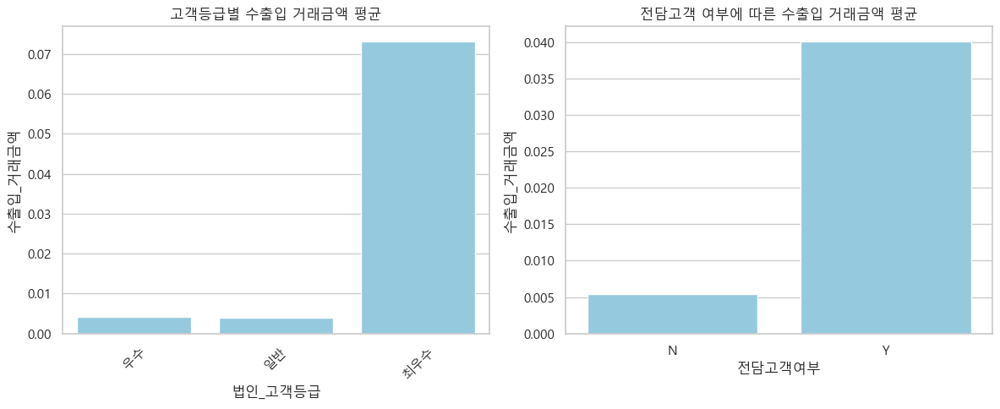

In [47]:
#✅ 3. 시각화: 등급 / 전담고객 여부별 수출입 규모
plt.figure(figsize=(12, 5))

# 등급별
plt.subplot(1, 2, 1)
sns.barplot(data=grade_avg, x='법인_고객등급', y='수출입_거래금액', color='skyblue')
plt.title('고객등급별 수출입 거래금액 평균')
plt.xticks(rotation=45)

# 전담고객 여부별
plt.subplot(1, 2, 2)
sns.barplot(data=dedicated_avg, x='전담고객여부', y='수출입_거래금액', color='skyblue')
plt.title('전담고객 여부에 따른 수출입 거래금액 평균')
plt.tight_layout()
plt.show()


In [12]:
#✅ 1. 고객등급 및 전담고객 여부별 유의미한 차이 검정
# 고객등급별 수출입 거래금액 차이 검정
from scipy.stats import ttest_ind, mannwhitneyu
grade_groups = [group['수출입_거래금액'].dropna() for name, group in df.groupby('법인_고객등급')]

# 등급이 2개 이상일 경우 ANOVA 가능 / 2개일 경우 t-test 또는 Mann-Whitney U
if len(grade_groups) == 2:
    stat, p = mannwhitneyu(grade_groups[0], grade_groups[1])
    print(f"등급별 금액 차이 - Mann-Whitney U 검정: p={p:.4f}")
else:
    from scipy.stats import f_oneway
    stat, p = f_oneway(*grade_groups)
    print(f"등급별 금액 차이 - ANOVA: p={p:.4f}")

# 전담고객 여부에 따른 차이
y = df[df['전담고객여부'] == 'Y']['수출입_거래금액'].dropna()
n = df[df['전담고객여부'] == 'N']['수출입_거래금액'].dropna()

stat, p = mannwhitneyu(y, n)
print(f"전담고객 여부에 따른 금액 차이 - Mann-Whitney U 검정: p={p:.4f}")


등급별 금액 차이 - ANOVA: p=0.0000
전담고객 여부에 따른 금액 차이 - Mann-Whitney U 검정: p=0.0000


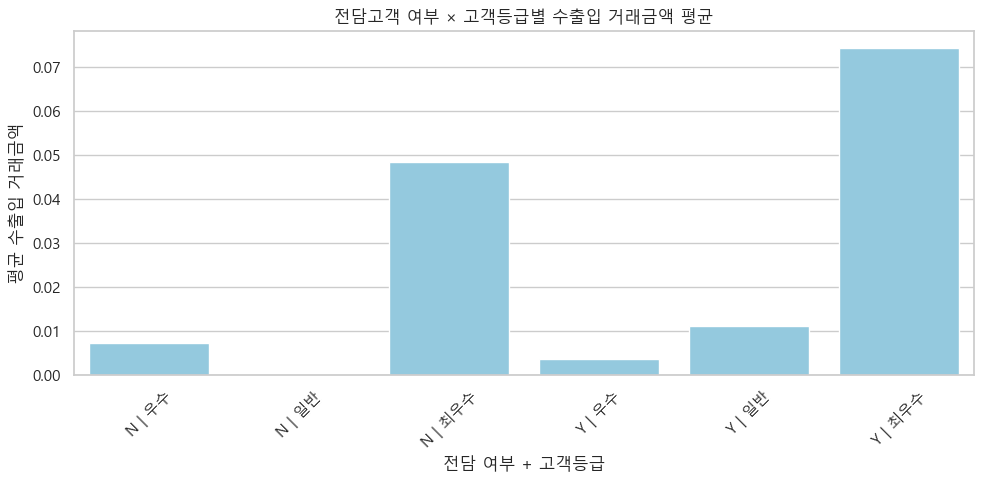

In [14]:
#✅ 2. 고객등급 × 전담 여부 조합별 시각화 및 통계 검정
#🔹 (1) 조합별 평균 금액 시각화
# 교차 컬럼 생성
df['전담등급조합'] = df['전담고객여부'] + ' | ' + df['법인_고객등급']

# 평균 집계
group_mean = df.groupby('전담등급조합')['수출입_거래금액'].mean().reset_index()

# 시각화
plt.figure(figsize=(10, 5))
sns.barplot(data=group_mean, x='전담등급조합', y='수출입_거래금액', color='skyblue')
plt.title('전담고객 여부 × 고객등급별 수출입 거래금액 평균')
plt.xlabel('전담 여부 + 고객등급')
plt.ylabel('평균 수출입 거래금액')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [17]:
#🔹 (2) 그룹별 통계표 출력
pivot_table = df.pivot_table(
    index='전담고객여부',
    columns='법인_고객등급',
    values='수출입_거래금액',
    aggfunc='mean'
)
print("📊 전담 x 고객등급별 수출입 거래금액 평균")
display(pivot_table.round(2))


📊 전담 x 고객등급별 수출입 거래금액 평균


법인_고객등급,우수,일반,최우수
전담고객여부,,,
N,0.01,0.00,0.05
Y,0.00,0.01,0.07


In [19]:
#🔹 (3) 조합별 유의한 차이 검정
# 조합 그룹 추출
from itertools import combinations

print("\n📌 전담+등급 조합별 금액 차이 유의성 검정 (Mann-Whitney U):")
combo_list = list(df['전담등급조합'].unique())

for a, b in combinations(combo_list, 2):
    data_a = df[df['전담등급조합'] == a]['수출입_거래금액'].dropna()
    data_b = df[df['전담등급조합'] == b]['수출입_거래금액'].dropna()
    if len(data_a) > 20 and len(data_b) > 20:
        stat, p = mannwhitneyu(data_a, data_b, alternative='two-sided')
        if p < 0.05:
            print(f"🔹 {a} vs {b} → p = {p:.4f} ✅ 유의한 차이")



📌 전담+등급 조합별 금액 차이 유의성 검정 (Mann-Whitney U):
🔹 N | 일반 vs N | 우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs Y | 우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs Y | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 N | 우수 vs Y | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 우수 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 우수 vs Y | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 우수 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 최우수 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 최우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 N | 최우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이


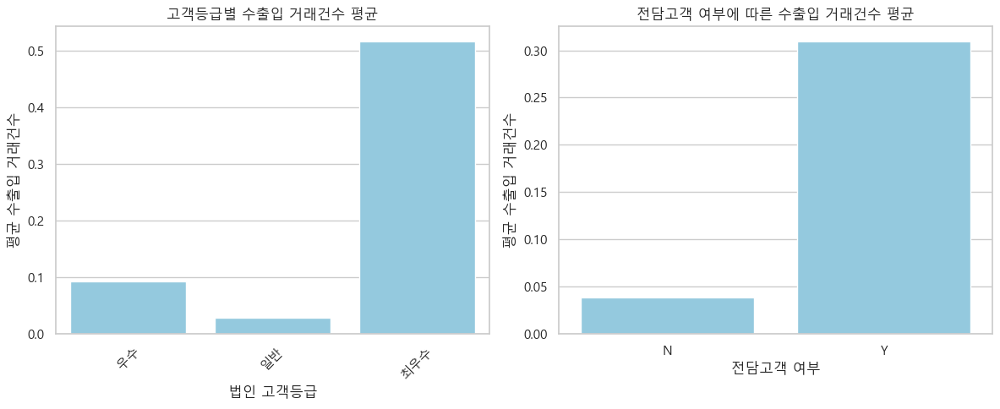

In [21]:
# ✅ 1. 고객등급 / 전담고객 여부별 수출입 거래건수 시각화
plt.figure(figsize=(12, 5))

# 등급별
plt.subplot(1, 2, 1)
sns.barplot(data=grade_avg, x='법인_고객등급', y='수출입_거래건수', color='skyblue')
plt.title('고객등급별 수출입 거래건수 평균')
plt.xlabel('법인 고객등급')
plt.ylabel('평균 수출입 거래건수')
plt.xticks(rotation=45)

# 전담고객 여부별
plt.subplot(1, 2, 2)
sns.barplot(data=dedicated_avg, x='전담고객여부', y='수출입_거래건수', color='skyblue')
plt.title('전담고객 여부에 따른 수출입 거래건수 평균')
plt.xlabel('전담고객 여부')
plt.ylabel('평균 수출입 거래건수')

plt.tight_layout()
plt.show()


In [22]:
# ✅ 2. 고객등급 및 전담고객 여부별 유의미한 차이 검정 (수출입_거래건수 기준)
from scipy.stats import ttest_ind, mannwhitneyu, f_oneway

# 고객등급별 수출입 거래건수 차이 검정
grade_groups = [group['수출입_거래건수'].dropna() for name, group in df.groupby('법인_고객등급')]

if len(grade_groups) == 2:
    stat, p = mannwhitneyu(grade_groups[0], grade_groups[1])
    print(f"등급별 건수 차이 - Mann-Whitney U 검정: p={p:.4f}")
else:
    stat, p = f_oneway(*grade_groups)
    print(f"등급별 건수 차이 - ANOVA: p={p:.4f}")

# 전담고객 여부에 따른 차이
y = df[df['전담고객여부'] == 'Y']['수출입_거래건수'].dropna()
n = df[df['전담고객여부'] == 'N']['수출입_거래건수'].dropna()

stat, p = mannwhitneyu(y, n)
print(f"전담고객 여부에 따른 건수 차이 - Mann-Whitney U 검정: p={p:.4f}")


등급별 건수 차이 - ANOVA: p=0.0000
전담고객 여부에 따른 건수 차이 - Mann-Whitney U 검정: p=0.0000


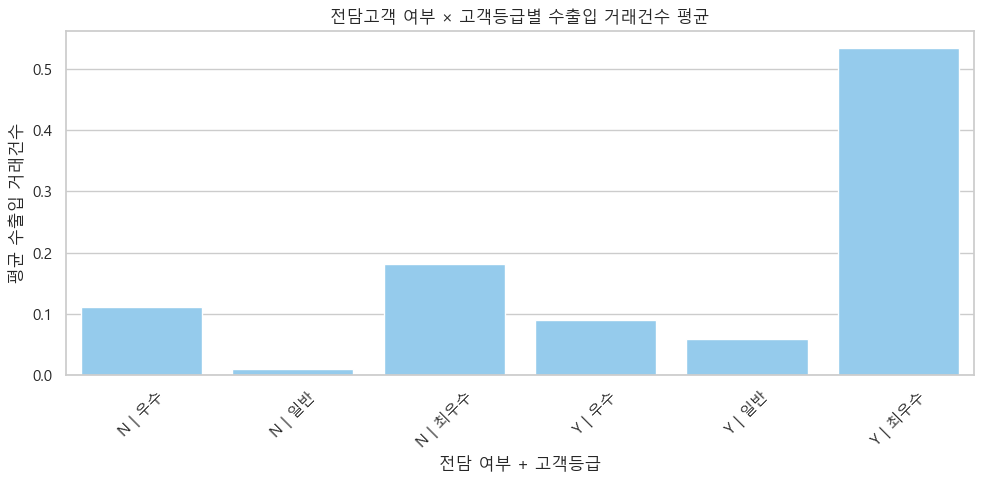

In [29]:
#✅ 3. 전담 × 등급 조합별 수출입 거래건수 분석
#🔹 (1) 조합별 평균 건수 시각화
# 교차 컬럼 생성
df['전담등급조합'] = df['전담고객여부'] + ' | ' + df['법인_고객등급']

# 평균 집계
group_mean = df.groupby('전담등급조합')['수출입_거래건수'].mean().reset_index()

# 시각화
plt.figure(figsize=(10, 5))
sns.barplot(data=group_mean, x='전담등급조합', y='수출입_거래건수', color='lightskyblue')
plt.title('전담고객 여부 × 고객등급별 수출입 거래건수 평균')
plt.xlabel('전담 여부 + 고객등급')
plt.ylabel('평균 수출입 거래건수')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [24]:
#🔹 (2) 그룹별 통계표 출력
pivot_table = df.pivot_table(
    index='전담고객여부',
    columns='법인_고객등급',
    values='수출입_거래건수',
    aggfunc='mean'
)
print("📊 전담 x 고객등급별 수출입 거래건수 평균")
display(pivot_table.round(2))


📊 전담 x 고객등급별 수출입 거래건수 평균


법인_고객등급,우수,일반,최우수
전담고객여부,,,
N,0.11,0.01,0.18
Y,0.09,0.06,0.53


In [25]:
# 🔹 (3) 조합별 유의성 검정 (Mann-Whitney U)
from itertools import combinations

print("\n📌 전담+등급 조합별 건수 차이 유의성 검정 (Mann-Whitney U):")
combo_list = list(df['전담등급조합'].unique())

for a, b in combinations(combo_list, 2):
    data_a = df[df['전담등급조합'] == a]['수출입_거래건수'].dropna()
    data_b = df[df['전담등급조합'] == b]['수출입_거래건수'].dropna()
    if len(data_a) > 20 and len(data_b) > 20:
        stat, p = mannwhitneyu(data_a, data_b, alternative='two-sided')
        if p < 0.05:
            print(f"🔹 {a} vs {b} → p = {p:.4f} ✅ 유의한 차이")



📌 전담+등급 조합별 건수 차이 유의성 검정 (Mann-Whitney U):
🔹 N | 일반 vs N | 우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs Y | 우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs Y | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 일반 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 N | 우수 vs Y | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 우수 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 N | 우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 우수 vs Y | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 우수 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 최우수 vs N | 최우수 → p = 0.0000 ✅ 유의한 차이
🔹 Y | 최우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이
🔹 N | 최우수 vs Y | 일반 → p = 0.0000 ✅ 유의한 차이


## 외환1

In [4]:
# 상관계수 계산 대상 컬럼
cols = [
    '외환_수출실적금액', '외환_수입실적금액',
    '외환_수출실적거래건수', '외환_수입실적거래건수'
]

# 상관계수 행렬 출력 (피어슨 기본)
corr_matrix = data[cols].corr()
display(corr_matrix)

,외환_수출실적금액,외환_수입실적금액,외환_수출실적거래건수,외환_수입실적거래건수
외환_수출실적금액,1.000000,0.084367,0.424959,0.100850
외환_수입실적금액,0.084367,1.000000,0.073186,0.242073
외환_수출실적거래건수,0.424959,0.073186,1.000000,0.182716
외환_수입실적거래건수,0.100850,0.242073,0.182716,1.000000


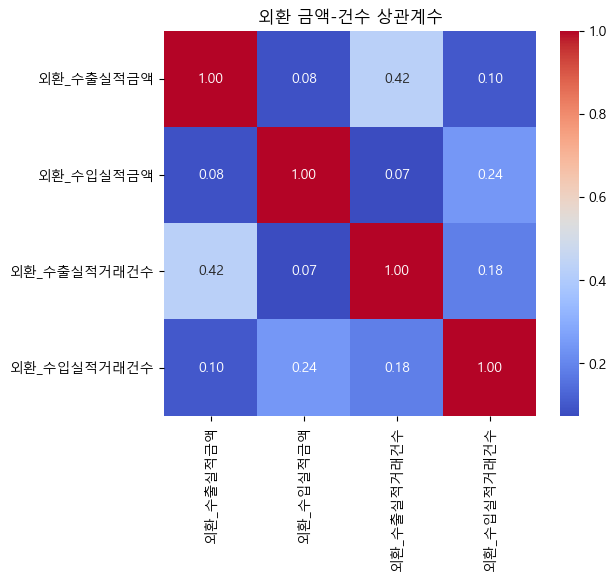

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('외환 금액-건수 상관계수')
plt.show()


In [6]:
data_log = np.log1p(data[cols])
data_log.corr()


,외환_수출실적금액,외환_수입실적금액,외환_수출실적거래건수,외환_수입실적거래건수
외환_수출실적금액,1.000000,0.258948,0.683010,0.226878
외환_수입실적금액,0.258948,1.000000,0.208773,0.575155
외환_수출실적거래건수,0.683010,0.208773,1.000000,0.286105
외환_수입실적거래건수,0.226878,0.575155,0.286105,1.000000


로그 스케일링을 통해 비선형적 분포가 완화되어 관계가 더 명확해졌습니다.<br>
수출/수입 건수 ↔ 금액 간의 관계는 실제로 존재했지만, 원래 스케일에서는 이상치나 분포 왜곡 때문에 숨겨졌던 것.<br>
수출 ↔ 수입 간 상관관계가 낮은 것은 기업이 양쪽을 동시에 활발히 하지 않거나, 업종 특성상 한쪽에 집중된 경우가 많기 때문입니다.<br>

In [7]:
# 업종 대분류별 수출/수입 금액-건수 상관계수 계산
grouped_corrs = []

for name, group in data.groupby('업종_대분류'):
    try:
        export_corr = group[['외환_수출실적금액', '외환_수출실적거래건수']].corr().iloc[0,1]
        import_corr = group[['외환_수입실적금액', '외환_수입실적거래건수']].corr().iloc[0,1]
        grouped_corrs.append({'업종': name, '수출_corr': export_corr, '수입_corr': import_corr})
    except:
        continue

# DataFrame으로 변환 후 정렬
import pandas as pd
corr_df = pd.DataFrame(grouped_corrs).sort_values(by='수출_corr', ascending=False)
display(corr_df.round(3))


,업종,수출_corr,수입_corr
7,부동산업,1.000,0.624
4,"농업, 임업 및 어업",0.985,0.504
14,"전문, 과학 및 기술 서비스업",0.941,0.928
3,금융 및 보험업,0.851,NaN
10,숙박 및 음식점업,0.816,1.000
0,건설업,0.769,0.605
12,운수 및 창고업,0.688,0.359
8,"사업시설 관리, 사업 지원 및 임대 서비스업",0.634,0.698
15,정보통신업,0.616,0.777
5,도매 및 소매업,0.523,0.408


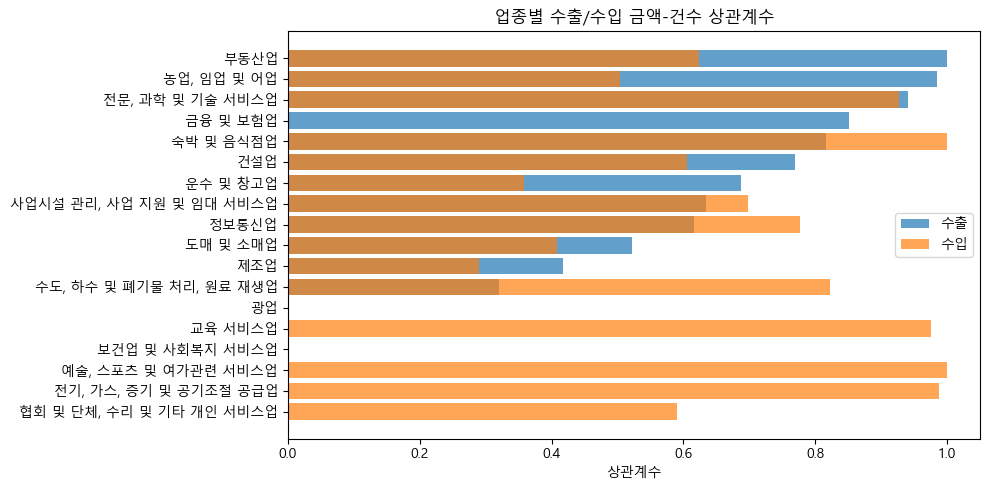

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.barh(corr_df['업종'], corr_df['수출_corr'], label='수출', alpha=0.7)
plt.barh(corr_df['업종'], corr_df['수입_corr'], label='수입', alpha=0.7)
plt.title("업종별 수출/수입 금액-건수 상관계수")
plt.xlabel("상관계수")
plt.legend()
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


건수-금액 관계가 고객등급/전담 여부에 따라 어떻게 달라지는지 분석하기
🎯 목적:
같은 업종이어도 고객등급이 높거나, 전담관리 여부에 따라 거래 패턴이 다를 수 있음

즉, 고급 고객일수록 소수 대형 거래를 선호한다면 → 상관계수 낮음
일반 고객은 거래건수와 금액이 비례한다면 → 상관계수 높음

In [9]:
results = []

for (grade, dedicated), group in data.groupby(['법인_고객등급', '전담고객여부']):
    try:
        corr = group[['외환_수출실적금액', '외환_수출실적거래건수']].corr().iloc[0,1]
        results.append({'고객등급': grade, '전담여부': dedicated, '수출_corr': corr})
    except:
        continue

export_corr_df = pd.DataFrame(results).sort_values(by='수출_corr', ascending=False)
display(export_corr_df)


,고객등급,전담여부,수출_corr
3,일반,Y,0.902302
0,우수,N,0.660430
4,최우수,N,0.612057
5,최우수,Y,0.405135
2,일반,N,0.345700
1,우수,Y,0.270700


In [10]:
results = []

for (grade, dedicated), group in data.groupby(['법인_고객등급', '전담고객여부']):
    try:
        corr = group[['외환_수입실적금액', '외환_수입실적거래건수']].corr().iloc[0,1]
        results.append({'고객등급': grade, '전담여부': dedicated, '수입_corr': corr})
    except:
        continue

export_corr_df = pd.DataFrame(results).sort_values(by='수입_corr', ascending=False)
display(export_corr_df)


,고객등급,전담여부,수입_corr
0,우수,N,0.769835
2,일반,N,0.634723
1,우수,Y,0.317104
5,최우수,Y,0.268693
3,일반,Y,0.167462
4,최우수,N,0.073180


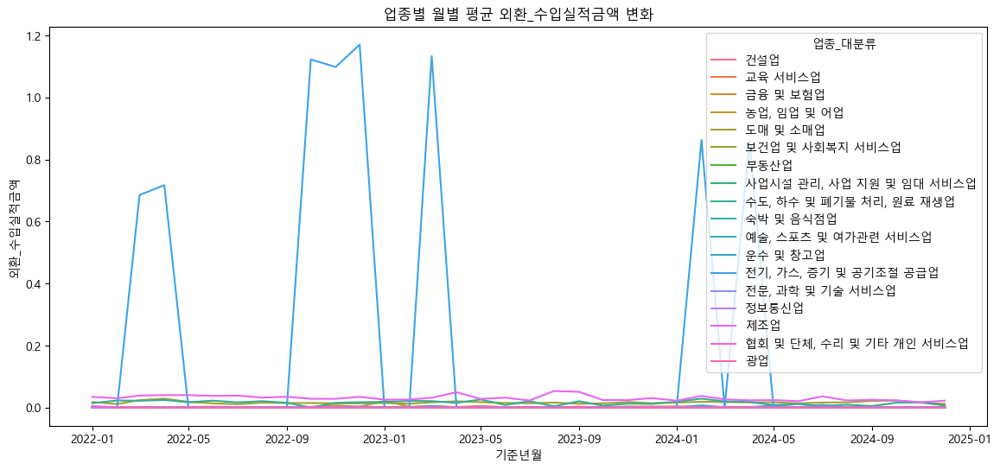

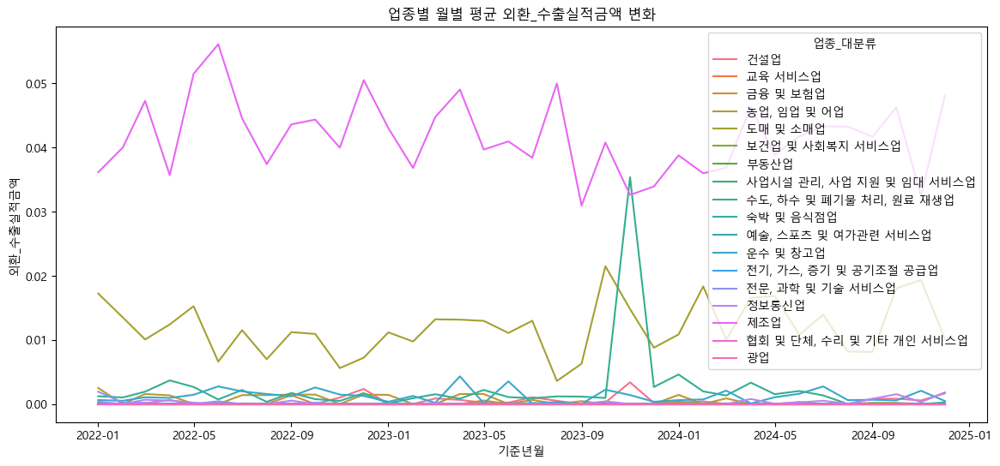

In [11]:
import seaborn as sns

# ✅ 2. 업종별 금융 상품 이용 변화 추적
agg = data.groupby(['기준년월', '업종_대분류'])[['외환_수입실적금액', '외환_수출실적금액']].mean().reset_index()

plt.figure(figsize=(14, 6))
sns.lineplot(data=agg, x='기준년월', y='외환_수입실적금액', hue='업종_대분류')
plt.title('업종별 월별 평균 외환_수입실적금액 변화')
plt.ylabel('외환_수입실적금액')
plt.show()

plt.figure(figsize=(14, 6))
sns.lineplot(data=agg, x='기준년월', y='외환_수출실적금액', hue='업종_대분류')
plt.title('업종별 월별 평균 외환_수출실적금액 변화')
plt.ylabel('외환_수출실적금액')
plt.show()



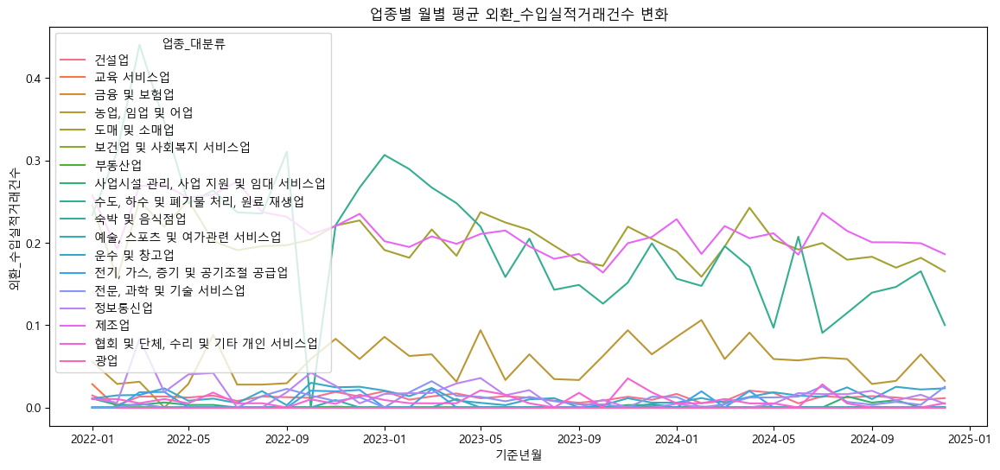

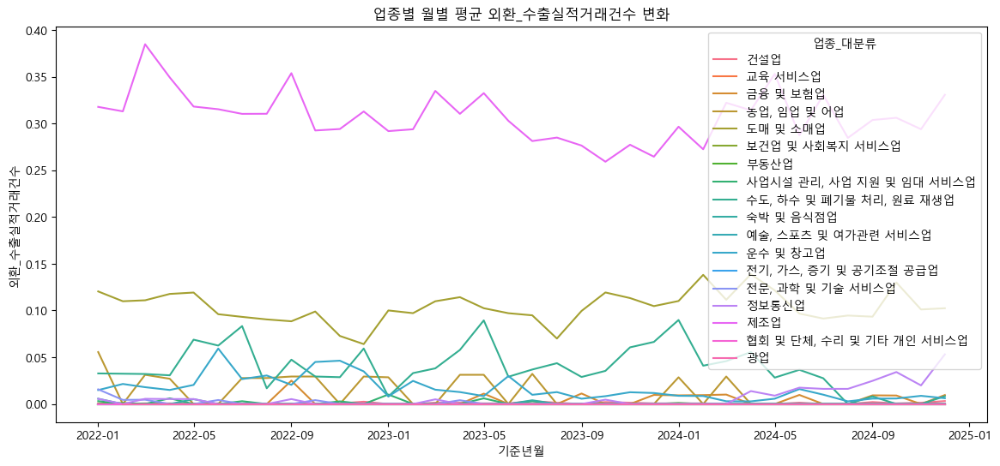

In [12]:
import seaborn as sns

# ✅ 2. 업종별 금융 상품 이용 변화 추적
agg = data.groupby(['기준년월', '업종_대분류'])[['외환_수입실적거래건수', '외환_수출실적거래건수']].mean().reset_index()

plt.figure(figsize=(14, 6))
sns.lineplot(data=agg, x='기준년월', y='외환_수입실적거래건수', hue='업종_대분류')
plt.title('업종별 월별 평균 외환_수입실적거래건수 변화')
plt.ylabel('외환_수입실적거래건수')
plt.show()

plt.figure(figsize=(14, 6))
sns.lineplot(data=agg, x='기준년월', y='외환_수출실적거래건수', hue='업종_대분류')
plt.title('업종별 월별 평균 외환_수출실적거래건수 변화')
plt.ylabel('외환_수출실적거래건수')
plt.show()



,업종_대분류,외환_수출실적금액,외환_수입실적금액
0,건설업,23.44,24.09
1,광업,0.00,0.00
2,교육 서비스업,0.00,0.05
3,금융 및 보험업,0.33,0.00
4,"농업, 임업 및 어업",0.69,2.99
5,도매 및 소매업,783.05,1054.79
6,보건업 및 사회복지 서비스업,0.00,0.00
7,부동산업,0.06,0.24
8,"사업시설 관리, 사업 지원 및 임대 서비스업",0.18,0.72
9,"수도, 하수 및 폐기물 처리, 원료 재생업",10.47,65.48


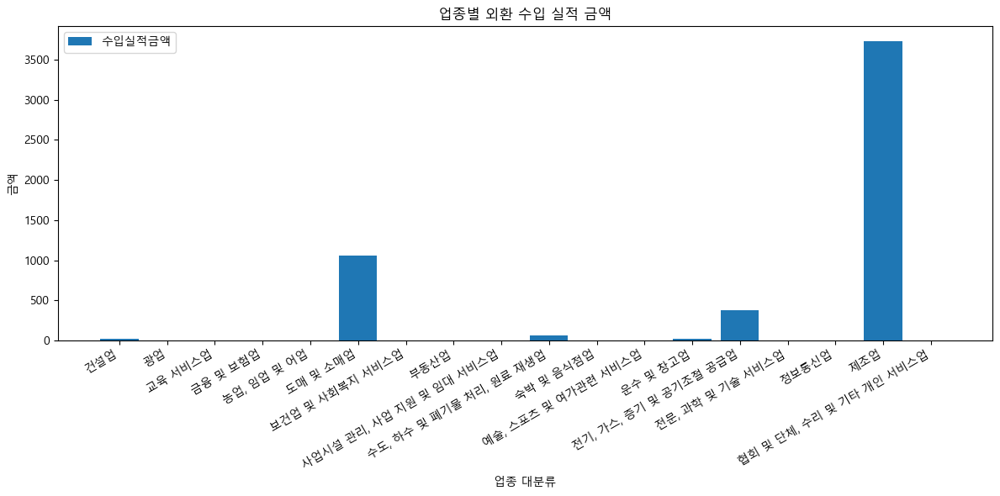

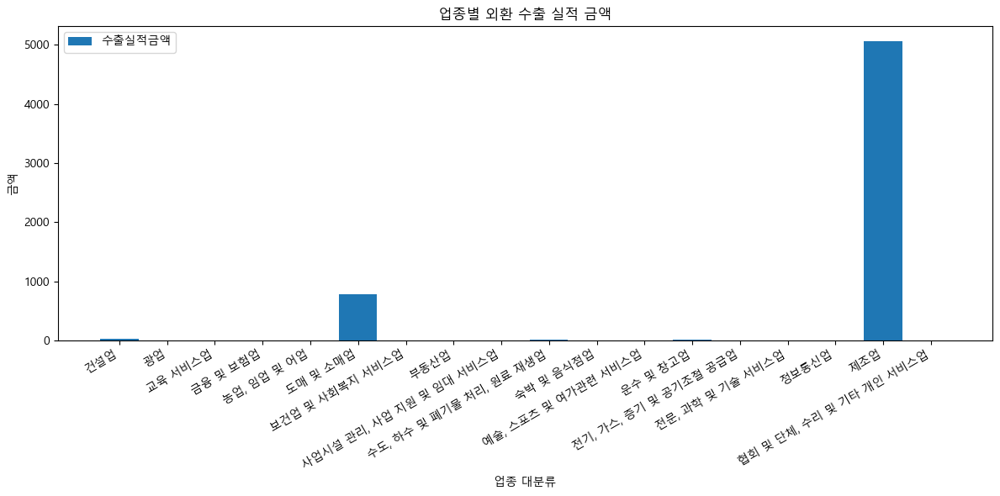

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 업종별 외환 금액 집계
grouped_fx = data.groupby('업종_대분류')[['외환_수출실적금액', '외환_수입실적금액']].sum().reset_index()

# 2. 표 출력
from IPython.display import display
display(grouped_fx)

# 3. 막대그래프 시각화
plt.figure(figsize=(12, 6))
x = grouped_fx['업종_대분류']

plt.bar(x, grouped_fx['외환_수입실적금액'], label='수입실적금액')
plt.xlabel('업종 대분류')
plt.ylabel('금액')
plt.title('업종별 외환 수입 실적 금액')
plt.xticks(rotation=30, ha='right', fontsize=10)  
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
x = grouped_fx['업종_대분류']
plt.bar(x, grouped_fx['외환_수출실적금액'], label='수출실적금액')
plt.xlabel('업종 대분류')
plt.ylabel('금액')
plt.title('업종별 외환 수출 실적 금액')
plt.xticks(rotation=30, ha='right', fontsize=10)  
plt.legend()
plt.tight_layout()
plt.show()



In [14]:
# 제조업, 도소매업, 전기공급업에 해당하는 행만 필터링
수입업종 = ['제조업', '도매 및 소매업', '전기, 가스, 증기 및 공기조절 공급업']
수출업종 = ['제조업', '도매 및 소매업']

# 수입 필터링
수입_df = data[data['업종_대분류'].isin(수입업종)].copy()
# 수출 필터링
수출_df = data[data['업종_대분류'].isin(수출업종)].copy()


In [15]:
# 월별 수입금액 추이
수입_grouped = 수입_df.groupby(['기준년월', '업종_대분류'])['외환_수입실적금액'].sum().reset_index()

# 월별 수출금액 추이
수출_grouped = 수출_df.groupby(['기준년월', '업종_대분류'])['외환_수출실적금액'].sum().reset_index()


In [16]:
from IPython.display import display

print("✅ 외환 수입 실적 금액 추이")
display(수입_grouped)

print("✅ 외환 수출 실적 금액 추이")
display(수출_grouped)


✅ 외환 수입 실적 금액 추이


,기준년월,업종_대분류,외환_수입실적금액
0,2022-01-01,도매 및 소매업,31.89
1,2022-01-01,"전기, 가스, 증기 및 공기조절 공급업",0.00
2,2022-01-01,제조업,115.87
3,2022-02-01,도매 및 소매업,20.21
4,2022-02-01,"전기, 가스, 증기 및 공기조절 공급업",0.00
...,...,...,...
103,2024-11-01,"전기, 가스, 증기 및 공기조절 공급업",0.00
104,2024-11-01,제조업,58.36
105,2024-12-01,도매 및 소매업,21.54
106,2024-12-01,"전기, 가스, 증기 및 공기조절 공급업",0.00


✅ 외환 수출 실적 금액 추이


,기준년월,업종_대분류,외환_수출실적금액
0,2022-01-01,도매 및 소매업,31.22
1,2022-01-01,제조업,122.24
2,2022-02-01,도매 및 소매업,24.57
3,2022-02-01,제조업,135.42
4,2022-03-01,도매 및 소매업,17.79
...,...,...,...
67,2024-10-01,제조업,157.74
68,2024-11-01,도매 및 소매업,36.63
69,2024-11-01,제조업,111.41
70,2024-12-01,도매 및 소매업,18.59


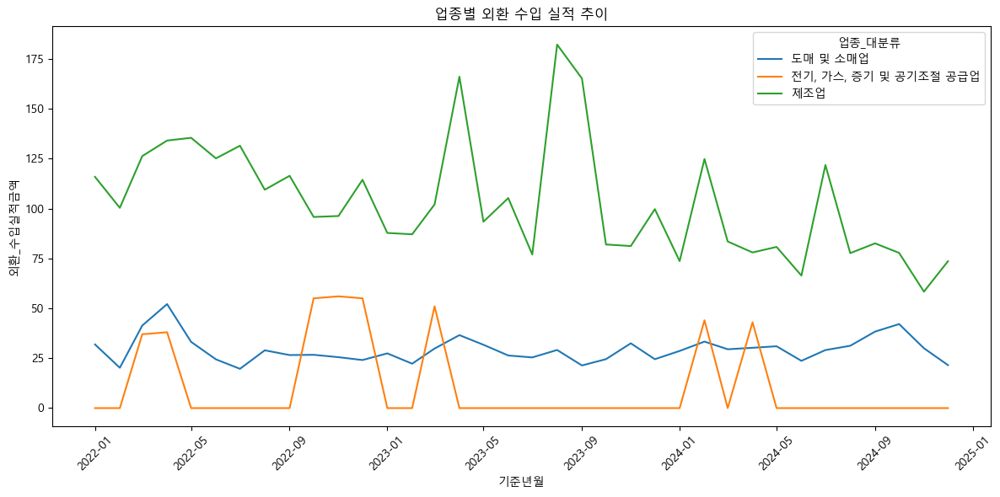

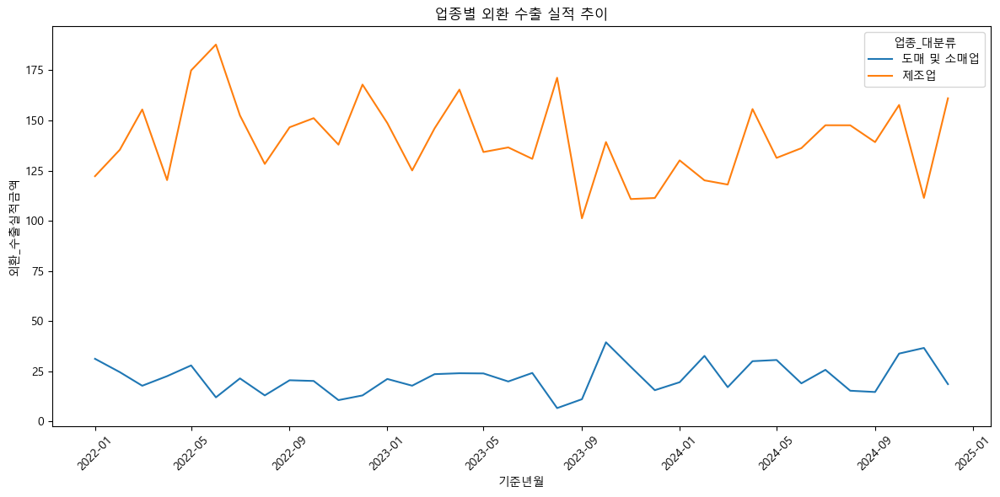

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.lineplot(data=수입_grouped, x='기준년월', y='외환_수입실적금액', hue='업종_대분류')
plt.title('업종별 외환 수입 실적 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.lineplot(data=수출_grouped, x='기준년월', y='외환_수출실적금액', hue='업종_대분류')
plt.title('업종별 외환 수출 실적 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


,업종_대분류,외환_수출실적거래건수,외환_수입실적거래건수
0,건설업,41.5,620.5
1,광업,0.0,0.0
2,교육 서비스업,0.0,3.0
3,금융 및 보험업,12.0,0.0
4,"농업, 임업 및 어업",15.0,65.5
5,도매 및 소매업,6801.0,13195.5
6,보건업 및 사회복지 서비스업,0.0,0.0
7,부동산업,2.0,4.0
8,"사업시설 관리, 사업 지원 및 임대 서비스업",11.5,21.0
9,"수도, 하수 및 폐기물 처리, 원료 재생업",167.5,868.5


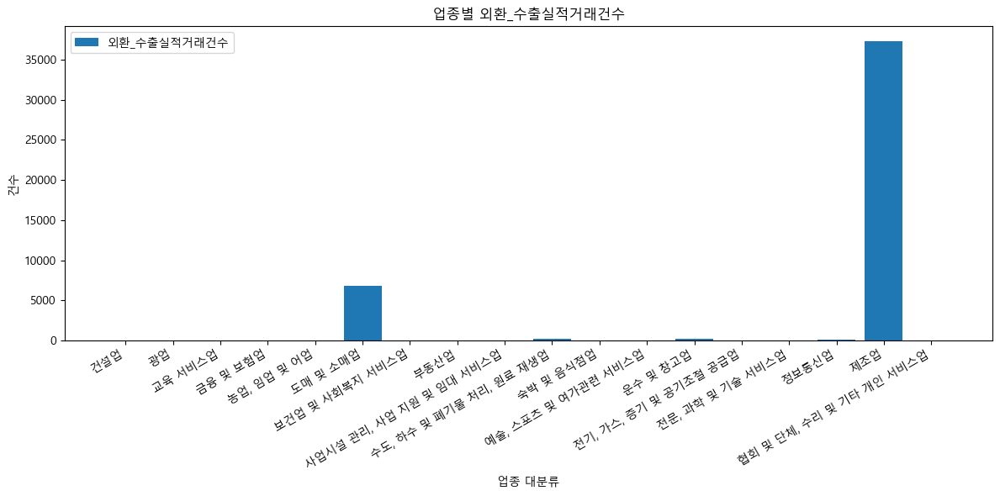

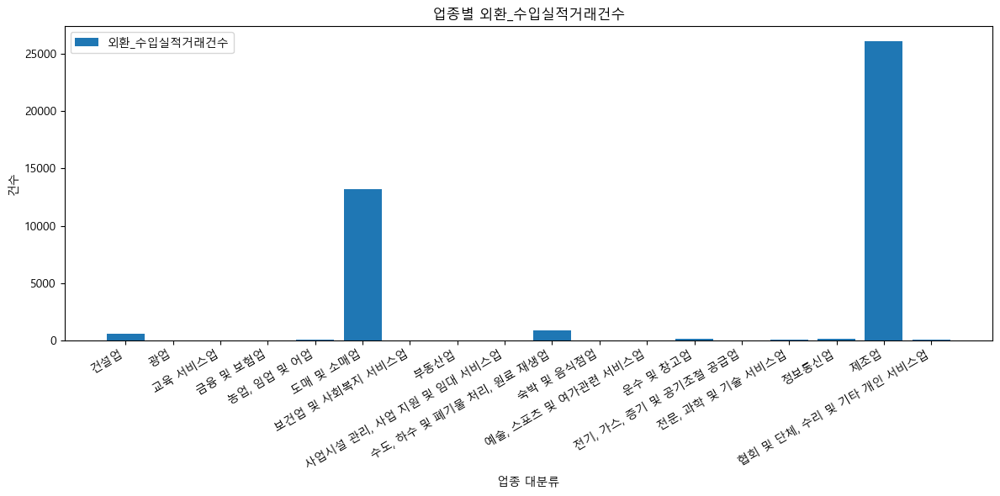

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 업종별 외환 금액 집계
grouped_fx = data.groupby('업종_대분류')[['외환_수출실적거래건수', '외환_수입실적거래건수']].sum().reset_index()

# 2. 표 출력
from IPython.display import display
display(grouped_fx)

# 3. 막대그래프 시각화
plt.figure(figsize=(12, 6))
x = grouped_fx['업종_대분류']

plt.bar(x, grouped_fx['외환_수출실적거래건수'], label='외환_수출실적거래건수')
plt.xlabel('업종 대분류')
plt.ylabel('건수')
plt.title('업종별 외환_수출실적거래건수')
plt.xticks(rotation=30, ha='right', fontsize=10)  
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
x = grouped_fx['업종_대분류']
plt.bar(x, grouped_fx['외환_수입실적거래건수'], label='외환_수입실적거래건수')
plt.xlabel('업종 대분류')
plt.ylabel('건수')
plt.title('업종별 외환_수입실적거래건수')
plt.xticks(rotation=30, ha='right', fontsize=10)  
plt.legend()
plt.tight_layout()
plt.show()



In [20]:
0.3# 월별 수입건수 추이
수입_grouped = 수입_df.groupby(['기준년월', '업종_대분류'])['외환_수입실적거래건수'].sum().reset_index()

# 월별 수출건수 추이
수출_grouped = 수출_df.groupby(['기준년월', '업종_대분류'])['외환_수출실적거래건수'].sum().reset_index()


In [21]:
from IPython.display import display

print("✅ 외환_수입실적거래건수추이")
display(수입_grouped)

print("✅ 외환_수입실적거래건수 추이")
display(수출_grouped)


✅ 외환_수입실적거래건수추이


,기준년월,업종_대분류,외환_수입실적거래건수
0,2022-01-01,도매 및 소매업,445.0
1,2022-01-01,"전기, 가스, 증기 및 공기조절 공급업",0.0
2,2022-01-01,제조업,870.5
3,2022-02-01,도매 및 소매업,285.0
4,2022-02-01,"전기, 가스, 증기 및 공기조절 공급업",0.0
...,...,...,...
103,2024-11-01,"전기, 가스, 증기 및 공기조절 공급업",0.0
104,2024-11-01,제조업,684.0
105,2024-12-01,도매 및 소매업,301.5
106,2024-12-01,"전기, 가스, 증기 및 공기조절 공급업",0.0


✅ 외환_수입실적거래건수 추이


,기준년월,업종_대분류,외환_수출실적거래건수
0,2022-01-01,도매 및 소매업,218.0
1,2022-01-01,제조업,1074.5
2,2022-02-01,도매 및 소매업,200.0
3,2022-02-01,제조업,1059.0
4,2022-03-01,도매 및 소매업,196.0
...,...,...,...
67,2024-10-01,제조업,1043.0
68,2024-11-01,도매 및 소매업,191.5
69,2024-11-01,제조업,1008.5
70,2024-12-01,도매 및 소매업,187.0


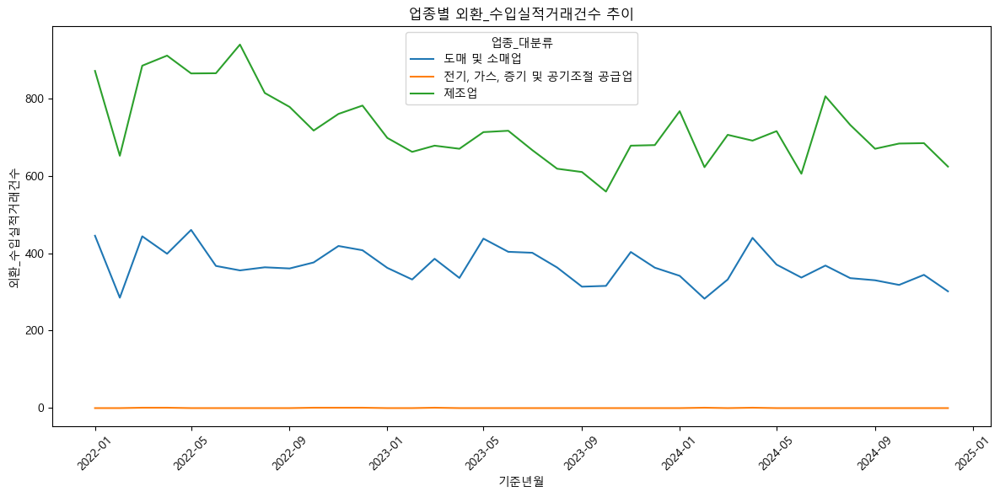

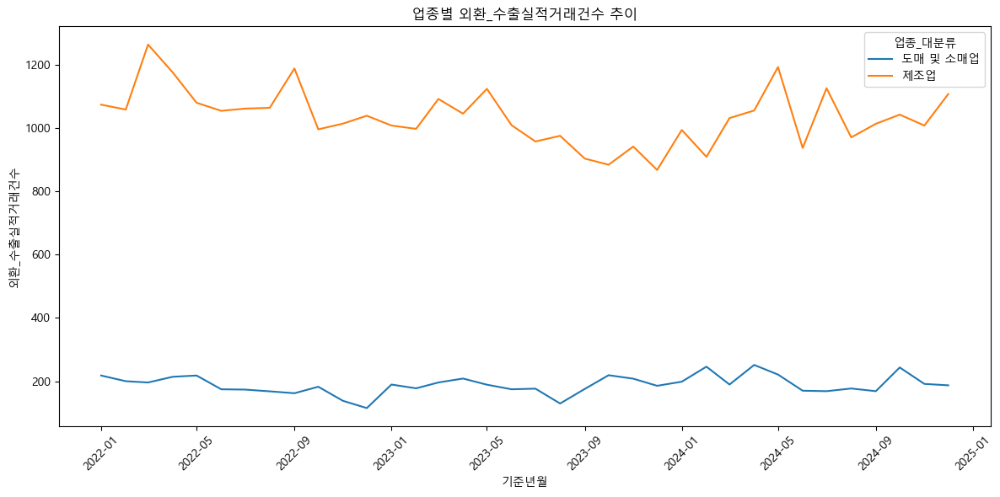

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.lineplot(data=수입_grouped, x='기준년월', y='외환_수입실적거래건수', hue='업종_대분류')
plt.title('업종별 외환_수입실적거래건수 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.lineplot(data=수출_grouped, x='기준년월', y='외환_수출실적거래건수', hue='업종_대분류')
plt.title('업종별 외환_수출실적거래건수 추이')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


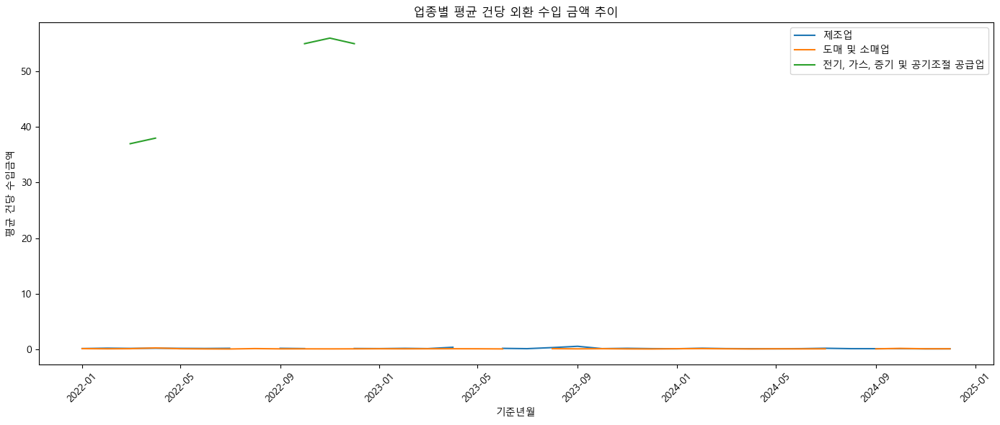

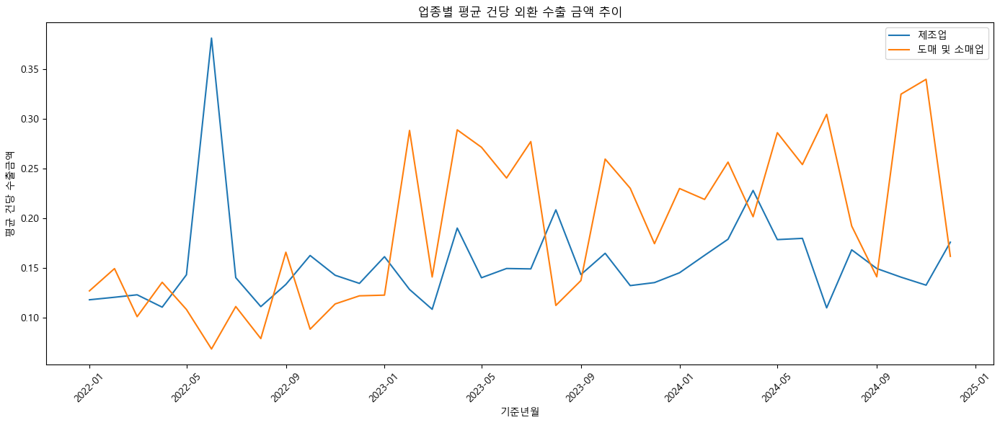

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 업종 정의
수입업종 = ['제조업', '도매 및 소매업', '전기, 가스, 증기 및 공기조절 공급업']
수출업종 = ['제조업', '도매 및 소매업']

# 2. 업종별 필터링
수입_df = data[data['업종_대분류'].isin(수입업종)].copy()
수출_df = data[data['업종_대분류'].isin(수출업종)].copy()

# 3. 평균 건당 금액 계산
수입_df['평균_건당_수입금액'] = 수입_df['외환_수입실적금액'] / 수입_df['외환_수입실적거래건수']
수출_df['평균_건당_수출금액'] = 수출_df['외환_수출실적금액'] / 수출_df['외환_수출실적거래건수']

# 4. 월별 평균 단가 계산
수입_평균단가 = 수입_df.groupby(['기준년월', '업종_대분류'])['평균_건당_수입금액'].mean().reset_index()
수출_평균단가 = 수출_df.groupby(['기준년월', '업종_대분류'])['평균_건당_수출금액'].mean().reset_index()

# 5. 시각화: 수입 단가
plt.figure(figsize=(14, 6))
for 업종 in 수입업종:
    temp = 수입_평균단가[수입_평균단가['업종_대분류'] == 업종]
    plt.plot(temp['기준년월'], temp['평균_건당_수입금액'], label=업종)
plt.title('업종별 평균 건당 외환 수입 금액 추이')
plt.xlabel('기준년월')
plt.ylabel('평균 건당 수입금액')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# 6. 시각화: 수출 단가
plt.figure(figsize=(14, 6))
for 업종 in 수출업종:
    temp = 수출_평균단가[수출_평균단가['업종_대분류'] == 업종]
    plt.plot(temp['기준년월'], temp['평균_건당_수출금액'], label=업종)
plt.title('업종별 평균 건당 외환 수출 금액 추이')
plt.xlabel('기준년월')
plt.ylabel('평균 건당 수출금액')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


📦 2. 수출 측면: 업종별 평균 건당 외환 수출 금액 추이<br>
제조업	평균적으로 0.1~0.2 사이에서 변동, 간헐적 급등	일관적인 중소규모 수출, 일부 고단가 계약(스파이크) 존재<br>
도매 및 소매업	점차 증가하는 추세, 일부 월에 급등	건당 수출단가가 상승 중일 가능성, 새로운 유통 루트 또는 고가 상품 수출 확장 추정<br>
전체 추세	두 업종 모두 변동성 존재, 도소매는 최근 더 가파른 상승세	시장 확장성, 거래 유형의 변화 등 영향 추정 가능<br>

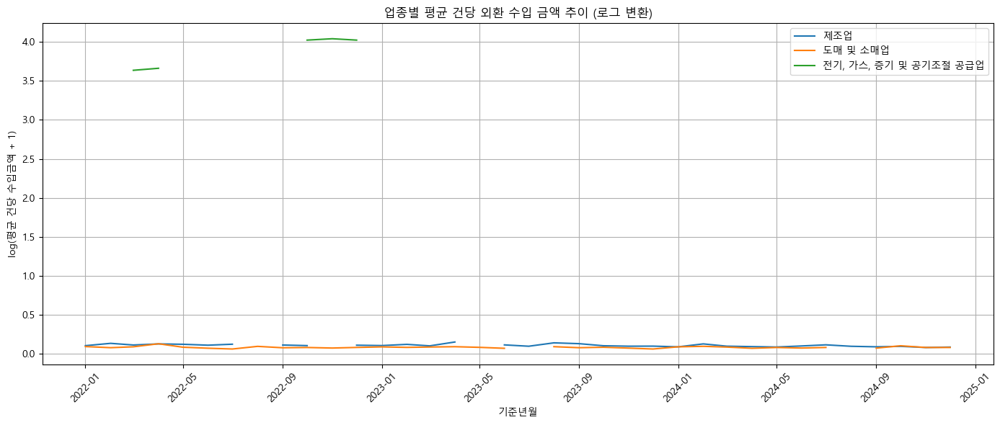

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 업종 정의
수입업종 = ['제조업', '도매 및 소매업', '전기, 가스, 증기 및 공기조절 공급업']

# 수입 필터링
수입_df = data[data['업종_대분류'].isin(수입업종)].copy()

# 평균 건당 수입금액 계산
수입_df['평균_건당_수입금액'] = 수입_df['외환_수입실적금액'] / 수입_df['외환_수입실적거래건수']

# 로그 변환 (log1p 사용)
수입_df['로그_평균_건당_수입금액'] = np.log1p(수입_df['평균_건당_수입금액'])

# 월별 업종별 평균값 계산
수입_로그단가 = 수입_df.groupby(['기준년월', '업종_대분류'])['로그_평균_건당_수입금액'].mean().reset_index()

# 시각화
plt.figure(figsize=(14, 6))
for 업종 in 수입업종:
    temp = 수입_로그단가[수입_로그단가['업종_대분류'] == 업종]
    plt.plot(temp['기준년월'], temp['로그_평균_건당_수입금액'], label=업종)
plt.title('업종별 평균 건당 외환 수입 금액 추이 (로그 변환)')
plt.xlabel('기준년월')
plt.ylabel('log(평균 건당 수입금액 + 1)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()


[1] 업종별 수입 구조 인사이트<br>
전기, 가스, 증기 및 공기조절 공급업 - 매우 고액의 비정기적 수입 거래 존재 → 에너지 수입 관련 대규모 계약일 가능성. 거래 수는 적으나 금액은 크며, 수입단가의 변동성도 큼.<br>
제조업 - 안정적인 중소단가 수입 거래 구조 → 주기적 수입이 유지되며, 평균 단가는 낮고 변화폭도 적음 → 부품/중간재 수입 가능성.<br>
도매 및 소매업 - 소액-다건 중심 거래 → 전체 수입 규모는 작으나, 단가가 매우 낮고 안정적. 해외 유통상품 도입 등의 정기거래 추정 가능.<br>
<br>
[2] 업종별 수출 구조 인사이트<br>
제조업 - 상대적으로 단가가 낮고 변동성 있음 → 다수의 수출처에 중간재 또는 가공재 납품하는 구조 가능성. 중소규모 수출이 중심.<br>
도매 및 소매업 - 최근 들어 단가 증가세가 뚜렷함 → 새로운 유통경로 확보 또는 고가 상품 수출 가능성. 수출 전략 변화가 있었을 가능성.<br>
<br>
전기공급업	고액-비정기	(없음/미분석)	단일 거래가 전체 흐름 좌우<br>
제조업	중단가-정기	중단가-변동성 있음	수출입 모두 안정적 기반산업<br>
도소매업	저단가-정기	단가 증가 추세	최근 수출단가 변화 주목<br>

전기공급업은 리스크 관리 대상으로 적합 (단일 고액계약 중심 → 환율·시장 가격 변화에 민감)<br>
도소매업 수출 전략 변화 가능성 있음 → 수출 상품군 추적, 고부가가치 제품 수출 가능성 탐색<br>
제조업은 중추적인 무역 업종 → 안정적인 구조를 유지 중이며, 수출입 모두 탄탄함

,기준년월,업종_대분류,외환_수출실적금액,외환_수입실적금액,무역수지
0,2022-01-01,도매 및 소매업,31.22,31.89,-0.67
1,2022-01-01,제조업,122.24,115.87,6.37
2,2022-02-01,도매 및 소매업,24.57,20.21,4.36
3,2022-02-01,제조업,135.42,100.35,35.07
4,2022-03-01,도매 및 소매업,17.79,41.36,-23.57


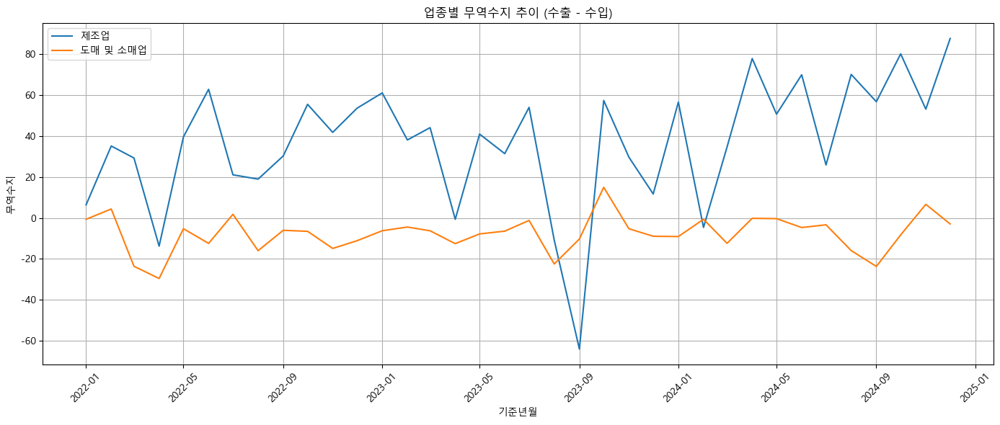

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 수출입 업종 정의 (공통되는 업종만 분석)
공통업종 = ['제조업', '도매 및 소매업']

# 2. 수출/수입 필터링
수입_df = data[data['업종_대분류'].isin(공통업종)].copy()
수출_df = data[data['업종_대분류'].isin(공통업종)].copy()

# 3. 월별 업종별 수출/수입 금액 집계
수출_grouped = 수출_df.groupby(['기준년월', '업종_대분류'])['외환_수출실적금액'].sum().reset_index()
수입_grouped = 수입_df.groupby(['기준년월', '업종_대분류'])['외환_수입실적금액'].sum().reset_index()

# 4. merge하여 무역수지 계산 (수출 - 수입)
무역수지_df = pd.merge(수출_grouped, 수입_grouped, on=['기준년월', '업종_대분류'], how='inner')
무역수지_df['무역수지'] = 무역수지_df['외환_수출실적금액'] - 무역수지_df['외환_수입실적금액']

# 5. 결과 예시 출력
display(무역수지_df.head())

# 6. 시계열 시각화 (옵션 - 필요시만 사용)

plt.figure(figsize=(14, 6))
for 업종 in 공통업종:
    temp = 무역수지_df[무역수지_df['업종_대분류'] == 업종]
    plt.plot(temp['기준년월'], temp['무역수지'], label=업종)
plt.title('업종별 무역수지 추이 (수출 - 수입)')
plt.xlabel('기준년월')
plt.ylabel('무역수지')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()



🔍 2023년 9월 제조업 무역수지 급락 해석<br>
📉 관찰된 현상:<br>
이전까지 제조업은 꾸준한 무역흑자 구조를 유지하다가,<br>

2023년 9월에 급격히 하락 → 음수로 전환됨 (즉, 수입금액 > 수출금액)<br>

🔎 원인 추정 방향<br>
1. 수출이 급감했을 가능성<br>
전방 수요 감소 (예: 글로벌 경기 둔화, 수출 규제, 공급망 차질 등)<br>

특정 품목 수출 중단 또는 수출 규제<br>

2. 수입이 급증했을 가능성<br>
원자재/중간재 가격 급등 (특히 제조업에 필요한 반도체, 에너지 등)<br>

환율 상승으로 인한 수입단가 증가<br>

재고 비축 목적 대량 수입<br>

→ 둘 중 무엇이 원인인지 확인하려면 2023년 9월 수출금액, 수입금액 원값 비교가 필요합니다.<br>

In [36]:
무역수지_df[
    (무역수지_df['기준년월'] == '2023-09') & (무역수지_df['업종_대분류'] == '제조업')
]


,기준년월,업종_대분류,외환_수출실적금액,외환_수입실적금액,무역수지
374,2023-09-01,제조업,101.25,165.16,-63.91


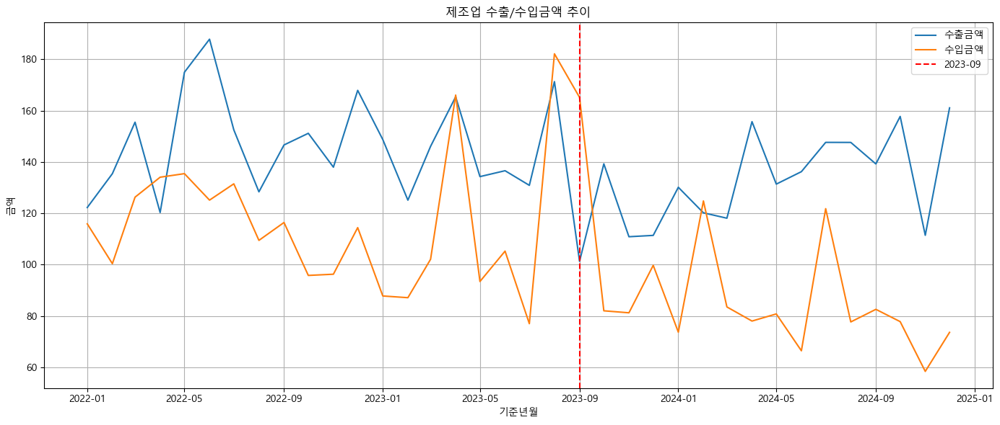

In [37]:
제조_수출 = 수출_grouped[수출_grouped['업종_대분류'] == '제조업']
제조_수입 = 수입_grouped[수입_grouped['업종_대분류'] == '제조업']

plt.figure(figsize=(14,6))
plt.plot(제조_수출['기준년월'], 제조_수출['외환_수출실적금액'], label='수출금액')
plt.plot(제조_수입['기준년월'], 제조_수입['외환_수입실적금액'], label='수입금액')
plt.axvline(pd.to_datetime('2023-09'), color='red', linestyle='--', label='2023-09')
plt.title('제조업 수출/수입금액 추이')
plt.xlabel('기준년월')
plt.ylabel('금액')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


📊 전체 흐름에서의 특징<br>
2023-09는 수출 급감 + 수입 급증이 동시에 발생한 이례적 상황<br>
이전 수년 간 무역흑자를 유지하던 제조업이 **유일하게 큰 적자(-63.91)**를 기록한 시점<br>
이후 몇 달 안에 다시 무역수지가 회복되므로 → 일시적 요인일 가능성 높음<br>

아마 9월에 제조업 낮아진 무역수지 낮아진 이유는<br>
https://kidd.co.kr/news/242241? <br>
미국이 철강, 자동차 등 한국 주력 제조제품에 대해 관세를 부과<br>

,기준년월,업종_대분류,외환_수출실적금액,외환_수입실적금액,무역수지
0,2022-01-01,건설업,0.10,0.79,-0.69
1,2022-01-01,교육 서비스업,0.00,0.05,-0.05
2,2022-01-01,금융 및 보험업,0.00,0.00,0.00
3,2022-01-01,"농업, 임업 및 어업",0.09,0.08,0.01
4,2022-01-01,도매 및 소매업,31.22,31.89,-0.67


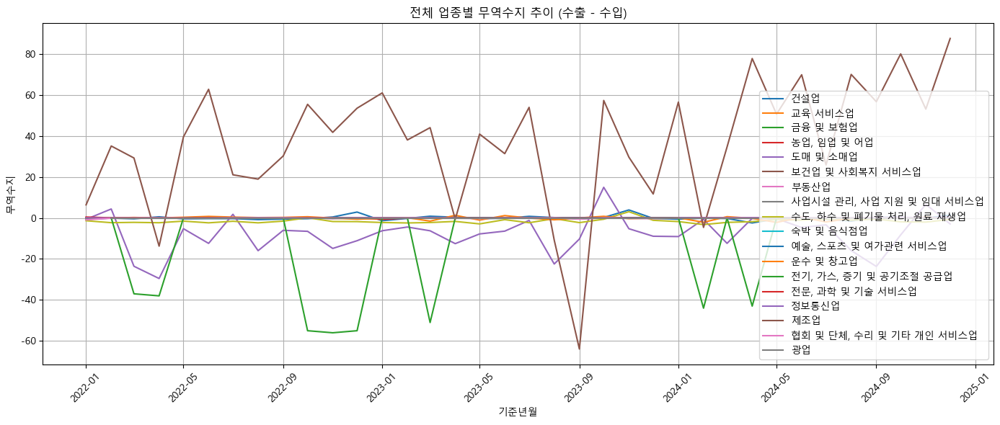

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 수출/수입 데이터 복사
수출_df = data.copy()
수입_df = data.copy()

# 2. 월별 업종별 수출/수입 금액 집계
수출_grouped = 수출_df.groupby(['기준년월', '업종_대분류'])['외환_수출실적금액'].sum().reset_index()
수입_grouped = 수입_df.groupby(['기준년월', '업종_대분류'])['외환_수입실적금액'].sum().reset_index()

# 3. 수출-수입 outer merge 후 결측값 0 처리
무역수지_df = pd.merge(수출_grouped, 수입_grouped, on=['기준년월', '업종_대분류'], how='outer')
무역수지_df['외환_수출실적금액'] = 무역수지_df['외환_수출실적금액'].fillna(0)
무역수지_df['외환_수입실적금액'] = 무역수지_df['외환_수입실적금액'].fillna(0)

# 4. 무역수지 계산
무역수지_df['무역수지'] = 무역수지_df['외환_수출실적금액'] - 무역수지_df['외환_수입실적금액']

# 5. 결과 확인
display(무역수지_df.head())

# 6. (선택) 시각화: 업종별 무역수지 추이
plt.figure(figsize=(14, 6))
for 업종 in 무역수지_df['업종_대분류'].unique():
    temp = 무역수지_df[무역수지_df['업종_대분류'] == 업종]
    plt.plot(temp['기준년월'], temp['무역수지'], label=업종)
plt.title('전체 업종별 무역수지 추이 (수출 - 수입)')
plt.xlabel('기준년월')
plt.ylabel('무역수지')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



혹시나 싶어서 봤는데 그냥 제조업이랑 도매 및 소매업만 봐도 될듯

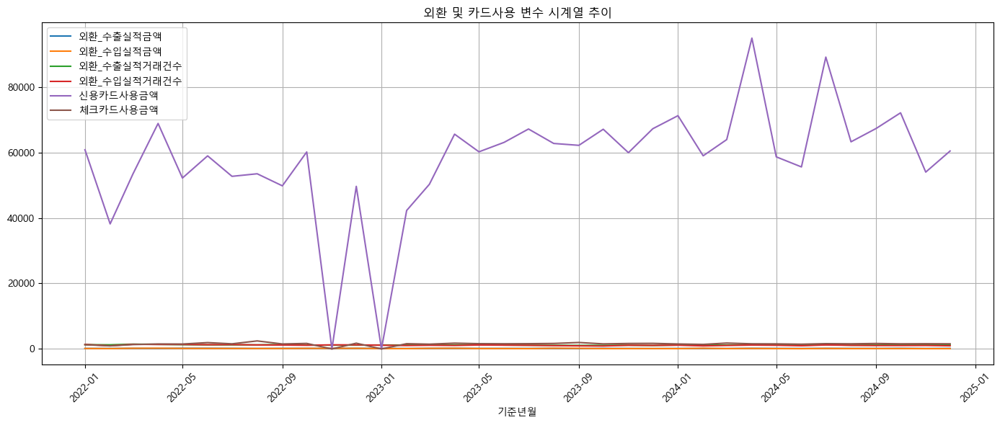

✅ 상관계수 (Pearson)
신용카드사용금액 ↔ 외환_수출실적금액: 상관계수=0.090, p-value=0.6031
신용카드사용금액 ↔ 외환_수입실적금액: 상관계수=-0.016, p-value=0.9255
신용카드사용금액 ↔ 외환_수출실적거래건수: 상관계수=0.093, p-value=0.5901
신용카드사용금액 ↔ 외환_수입실적거래건수: 상관계수=-0.077, p-value=0.6569
체크카드사용금액 ↔ 외환_수출실적금액: 상관계수=-0.050, p-value=0.7720
체크카드사용금액 ↔ 외환_수입실적금액: 상관계수=0.004, p-value=0.9810
체크카드사용금액 ↔ 외환_수출실적거래건수: 상관계수=-0.033, p-value=0.8501
체크카드사용금액 ↔ 외환_수입실적거래건수: 상관계수=-0.069, p-value=0.6893


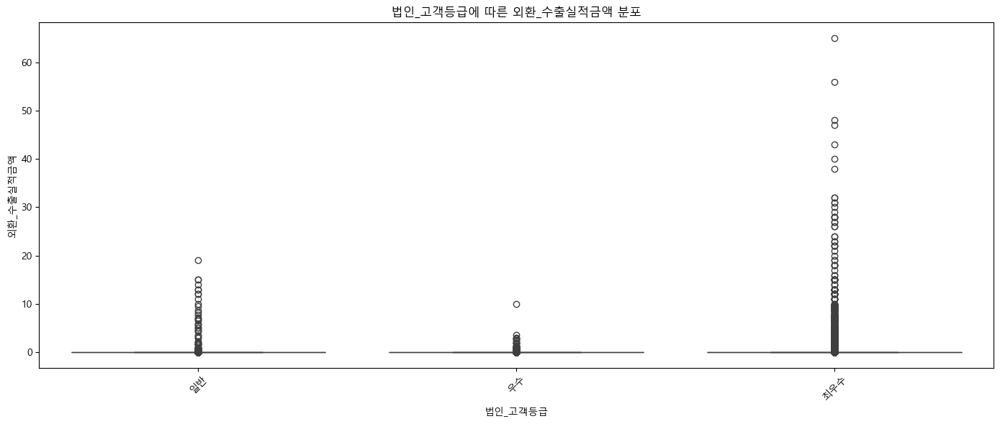

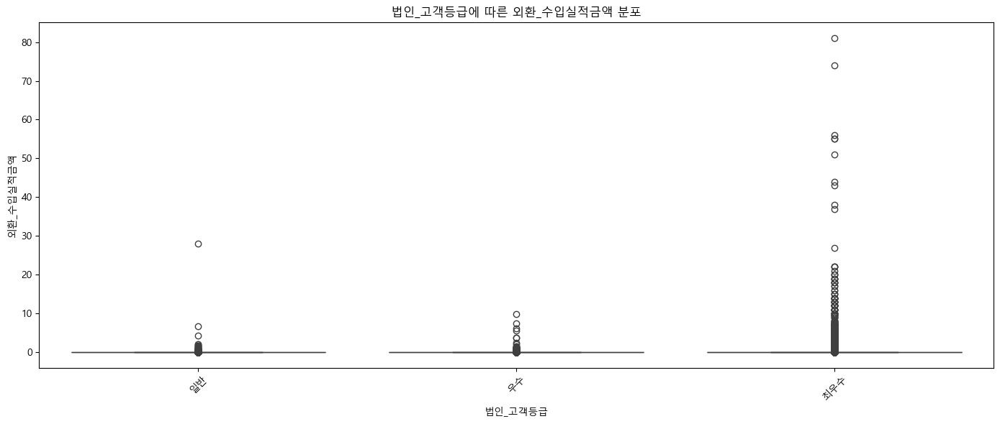

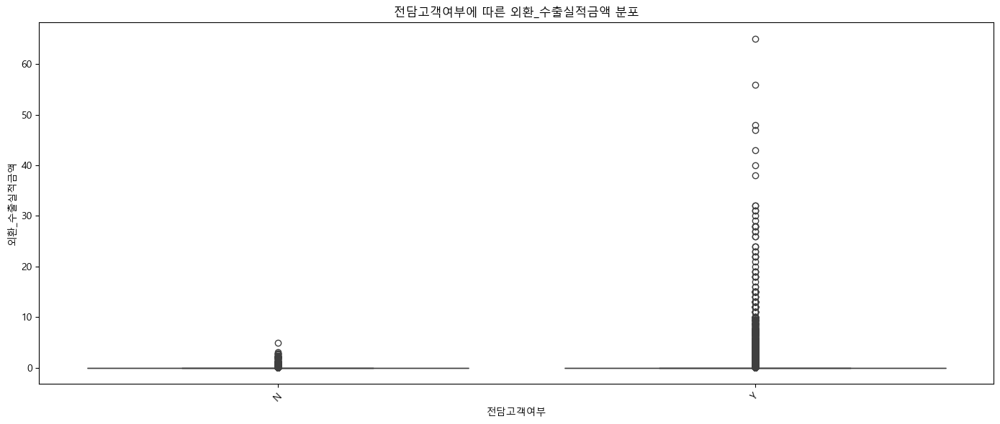

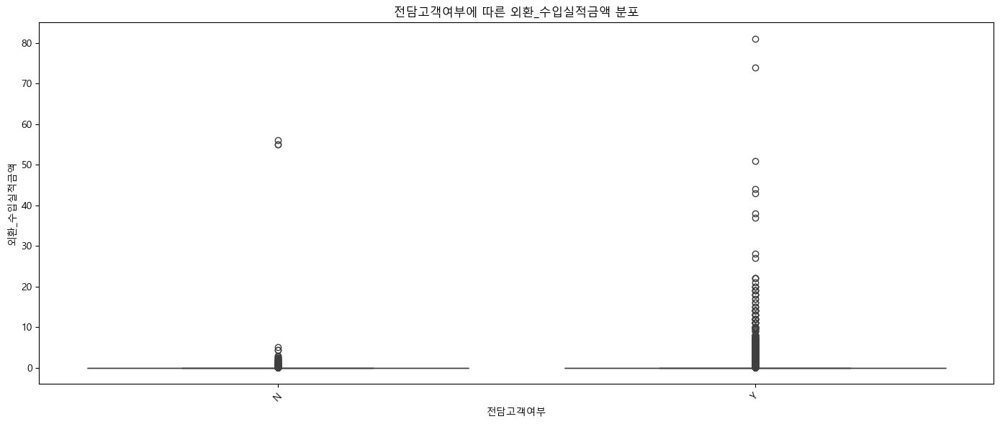

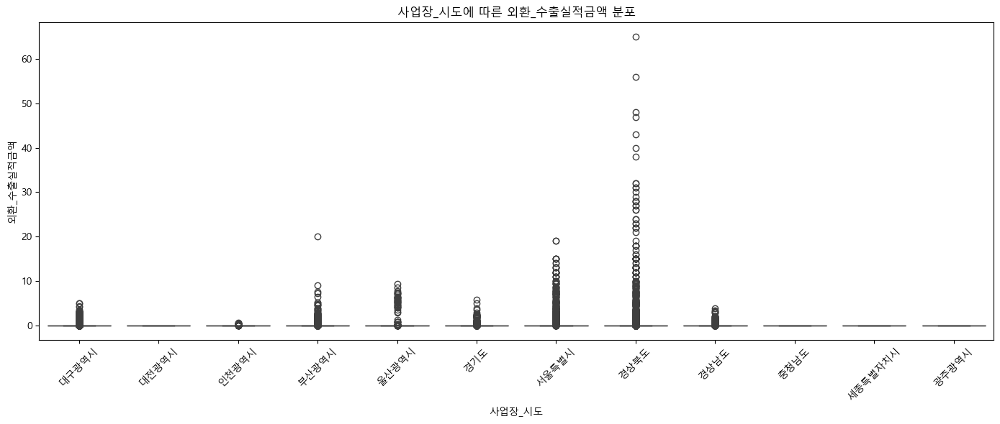

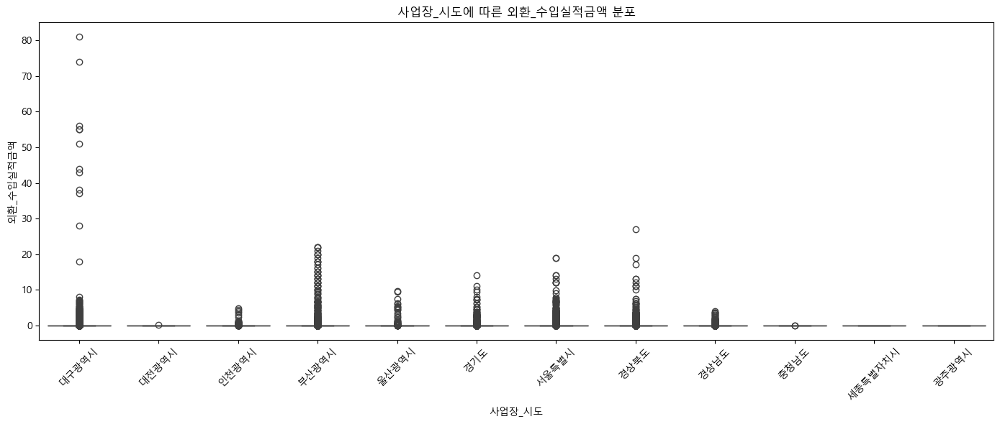


✅ ANOVA 유의성 검정
법인_고객등급 ↔ 외환_수출실적금액: F=331.01, p=0.0000
법인_고객등급 ↔ 외환_수입실적금액: F=294.13, p=0.0000
전담고객여부 ↔ 외환_수출실적금액: F=148.80, p=0.0000
전담고객여부 ↔ 외환_수입실적금액: F=85.76, p=0.0000
사업장_시도 ↔ 외환_수출실적금액: F=45.22, p=0.0000
사업장_시도 ↔ 외환_수입실적금액: F=32.07, p=0.0000


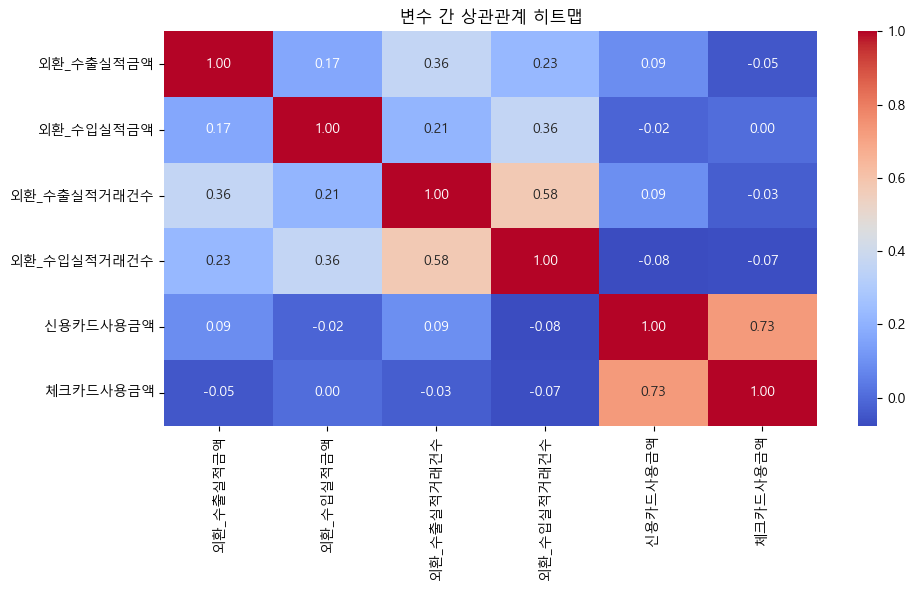

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr, f_oneway
from statsmodels.formula.api import ols

# 기준년월이 datetime 형식이 아닐 경우 변환
data['기준년월'] = pd.to_datetime(data['기준년월'])

# 1. 월별 집계: 분석 대상 변수들만 집계
grouped = data.groupby('기준년월').agg({
    '외환_수출실적금액': 'sum',
    '외환_수입실적금액': 'sum',
    '외환_수출실적거래건수': 'sum',
    '외환_수입실적거래건수': 'sum',
    '신용카드사용금액': 'sum',
    '체크카드사용금액': 'sum'
}).reset_index()

# 2. 시계열 그래프 (변수별 변화 확인용)
plt.figure(figsize=(14, 6))
for col in grouped.columns[1:]:
    plt.plot(grouped['기준년월'], grouped[col], label=col)
plt.legend()
plt.title('외환 및 카드사용 변수 시계열 추이')
plt.xlabel('기준년월')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# 3. 상관계수 출력
print("✅ 상관계수 (Pearson)")
for var in ['신용카드사용금액', '체크카드사용금액']:
    for target in ['외환_수출실적금액', '외환_수입실적금액', '외환_수출실적거래건수', '외환_수입실적거래건수']:
        corr, pval = pearsonr(grouped[var], grouped[target])
        print(f"{var} ↔ {target}: 상관계수={corr:.3f}, p-value={pval:.4f}")

# 4. boxplot: 등급/전담 여부/지역별 시계열 특성 시각화
cat_vars = ['법인_고객등급', '전담고객여부', '사업장_시도']
for cat in cat_vars:
    temp = data.copy()
    temp['기준년월'] = pd.to_datetime(temp['기준년월'])
    for target in ['외환_수출실적금액', '외환_수입실적금액']:
        plt.figure(figsize=(14, 6))
        sns.boxplot(x=cat, y=target, data=temp)
        plt.title(f'{cat}에 따른 {target} 분포')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# 5. 유의성 검정 (ANOVA)
print("\n✅ ANOVA 유의성 검정")
for cat in cat_vars:
    for target in ['외환_수출실적금액', '외환_수입실적금액']:
        groups = [group[target].dropna() for name, group in data.groupby(cat)]
        stat, pval = f_oneway(*groups)
        print(f"{cat} ↔ {target}: F={stat:.2f}, p={pval:.4f}")

# 6. 변수 간 시계열 관계 히트맵
plt.figure(figsize=(10, 6))
sns.heatmap(grouped.drop(columns='기준년월').corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("변수 간 상관관계 히트맵")
plt.tight_layout()
plt.show()


카드 사용금액과 외환 거래 실적 간에 직접적인 시계열적 관계는 없음<br>
→ 개인 소비 활동과 외환(법인 기준) 거래는 시장에서 독립적으로 움직임<br>

법인_고객등급, 전담고객여부, 사업장_시도는 모두 외환 실적을 결정짓는 유의미한 요인<br>
특히 고객등급이 가장 큰 분산 원인 → 등급별 거래 규모/신뢰도 차이 반영<br>
전담 고객은 거래 실적이 높을 가능성 높음 (VIP, 전략고객 관리 영향)<br>


📌 [시계열 그룹] 법인_고객등급
📈 외환_수출실적금액 - 그룹: 법인_고객등급


,기준년월,법인_고객등급,외환_수출실적금액
0,2022-01-01,우수,0.001882
1,2022-01-01,일반,0.005169
2,2022-01-01,최우수,0.031137
3,2022-02-01,우수,0.002166
4,2022-02-01,일반,0.007393


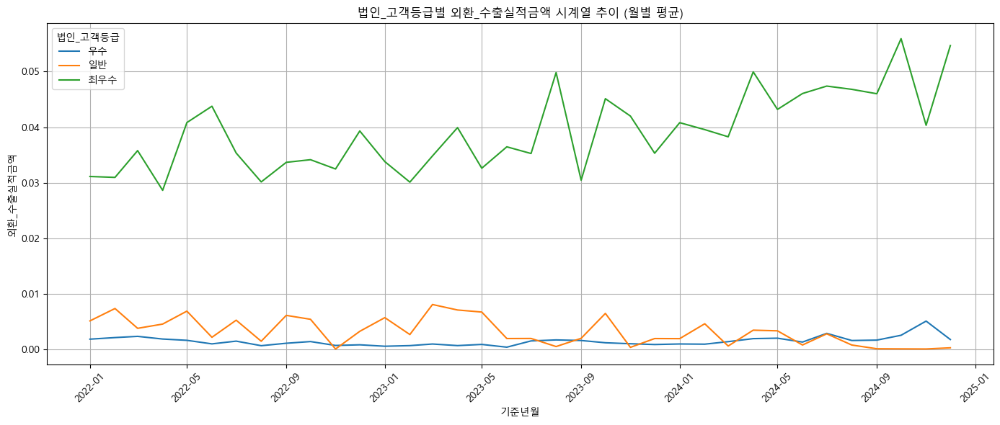

📈 외환_수입실적금액 - 그룹: 법인_고객등급


,기준년월,법인_고객등급,외환_수입실적금액
0,2022-01-01,우수,0.002263
1,2022-01-01,일반,0.002485
2,2022-01-01,최우수,0.031464
3,2022-02-01,우수,0.001646
4,2022-02-01,일반,0.000428


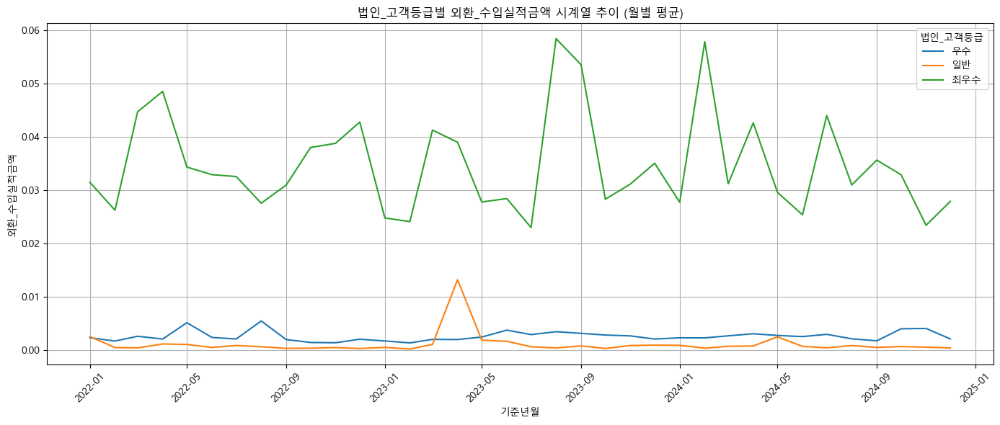


📌 [시계열 그룹] 전담고객여부
📈 외환_수출실적금액 - 그룹: 전담고객여부


,기준년월,전담고객여부,외환_수출실적금액
0,2022-01-01,N,0.003092
1,2022-01-01,Y,0.020362
2,2022-02-01,N,0.002588
3,2022-02-01,Y,0.020899
4,2022-03-01,N,0.002909


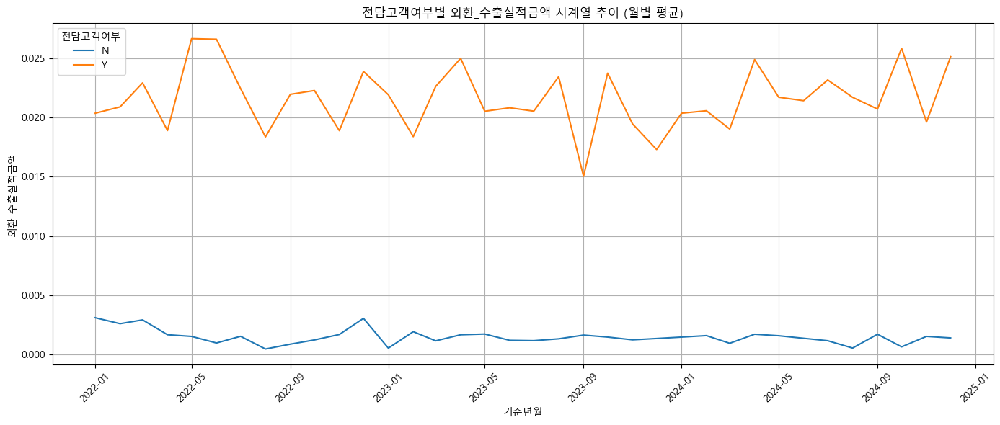

📈 외환_수입실적금액 - 그룹: 전담고객여부


,기준년월,전담고객여부,외환_수입실적금액
0,2022-01-01,N,0.003240
1,2022-01-01,Y,0.019893
2,2022-02-01,N,0.005191
3,2022-02-01,Y,0.015207
4,2022-03-01,N,0.002455


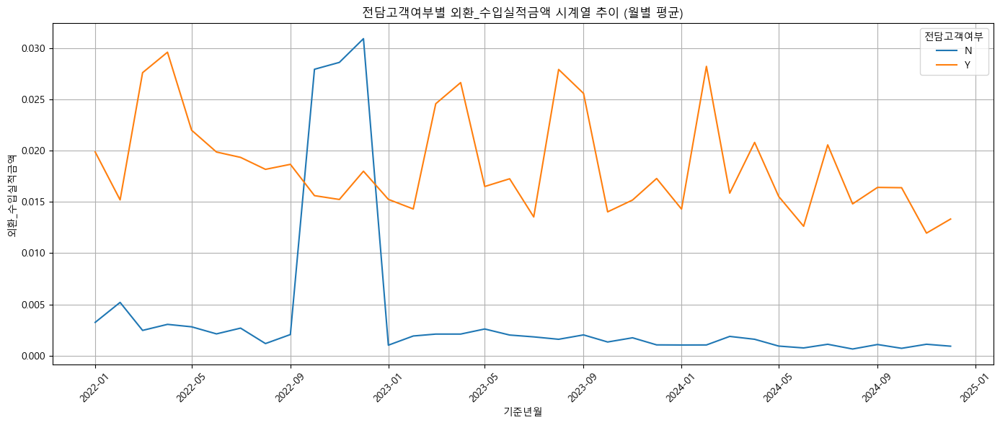


📌 [시계열 그룹] 사업장_시도
📈 외환_수출실적금액 - 그룹: 사업장_시도


,기준년월,사업장_시도,외환_수출실적금액
0,2022-01-01,경기도,0.006093
1,2022-01-01,경상남도,0.020000
2,2022-01-01,경상북도,0.019869
3,2022-01-01,광주광역시,0.000000
4,2022-01-01,대구광역시,0.006230


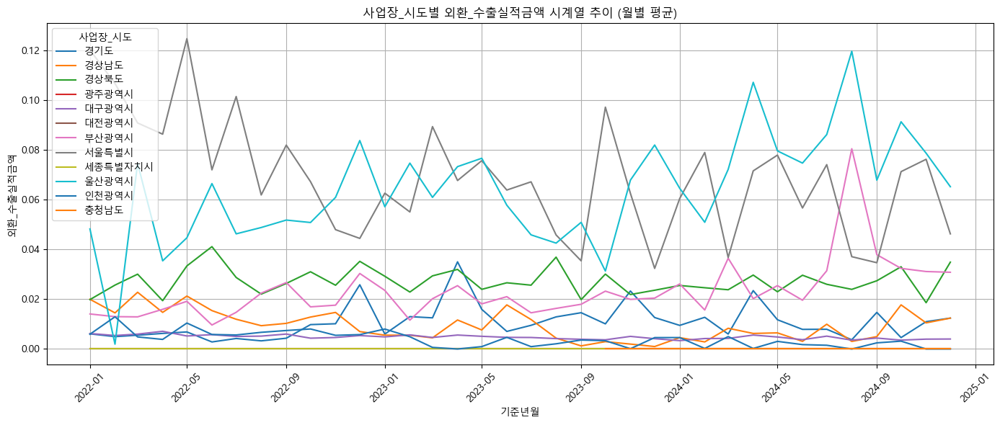

📈 외환_수입실적금액 - 그룹: 사업장_시도


,기준년월,사업장_시도,외환_수입실적금액
0,2022-01-01,경기도,0.055163
1,2022-01-01,경상남도,0.017546
2,2022-01-01,경상북도,0.010939
3,2022-01-01,광주광역시,0.000000
4,2022-01-01,대구광역시,0.009391


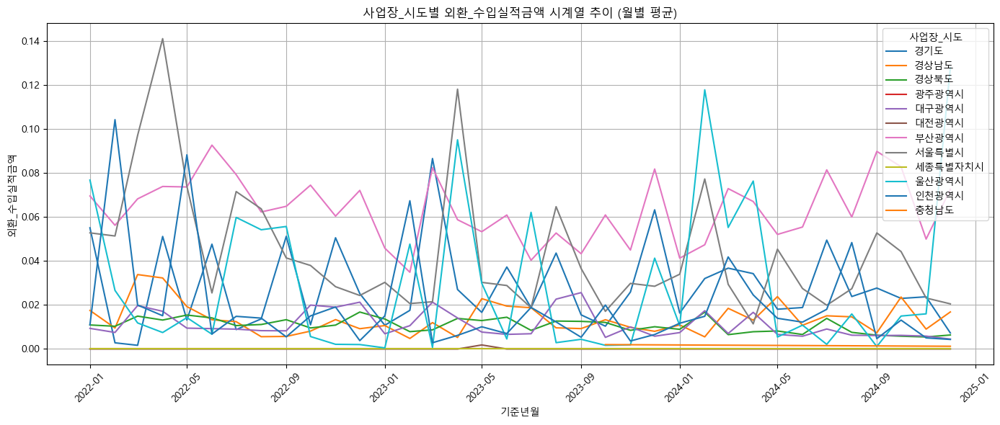

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display


# 분석 대상 변수
target_vars = ['외환_수출실적금액', '외환_수입실적금액']
group_vars = ['법인_고객등급', '전담고객여부', '사업장_시도']

# 그룹별 시계열 분석 루프
for group_col in group_vars:
    print(f"\n📌 [시계열 그룹] {group_col}")
    for target in target_vars:
        # 그룹 + 월별 평균 집계
        grouped = data.groupby(['기준년월', group_col])[target].mean().reset_index()

        # display로 표 출력
        print(f"📈 {target} - 그룹: {group_col}")
        display(grouped.head())

        # 시계열 그래프
        plt.figure(figsize=(14, 6))
        for g in grouped[group_col].unique():
            temp = grouped[grouped[group_col] == g]
            plt.plot(temp['기준년월'], temp[target], label=str(g))
        plt.title(f"{group_col}별 {target} 시계열 추이 (월별 평균)")
        plt.xlabel("기준년월")
        plt.ylabel(f"{target}")
        plt.legend(title=group_col)
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.tight_layout()
        plt.show()


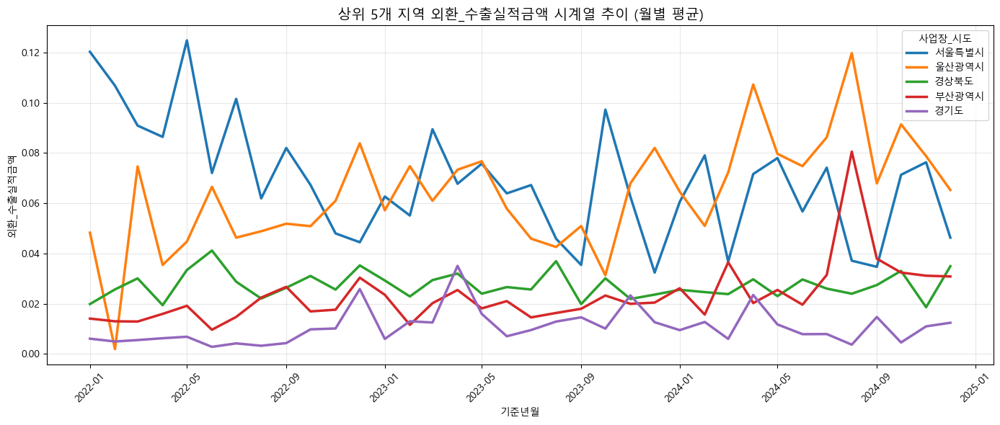

In [43]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 상위 시도 5개만 선택 (평균 기준)
top_sido = data.groupby('사업장_시도')['외환_수출실적금액'].mean().nlargest(5).index
filtered_data = data[data['사업장_시도'].isin(top_sido)]

# 2. 월 단위 평균 그룹화
monthly_avg = filtered_data.groupby(['기준년월', '사업장_시도'])['외환_수출실적금액'].mean().reset_index()

# 3. 시계열 플롯
plt.figure(figsize=(14, 6))
for sido in top_sido:
    subset = monthly_avg[monthly_avg['사업장_시도'] == sido]
    plt.plot(subset['기준년월'], subset['외환_수출실적금액'], label=sido, linewidth=2.5)

plt.title('상위 5개 지역 외환_수출실적금액 시계열 추이 (월별 평균)', fontsize=14)
plt.xlabel('기준년월')
plt.ylabel('외환_수출실적금액')
plt.legend(title='사업장_시도')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


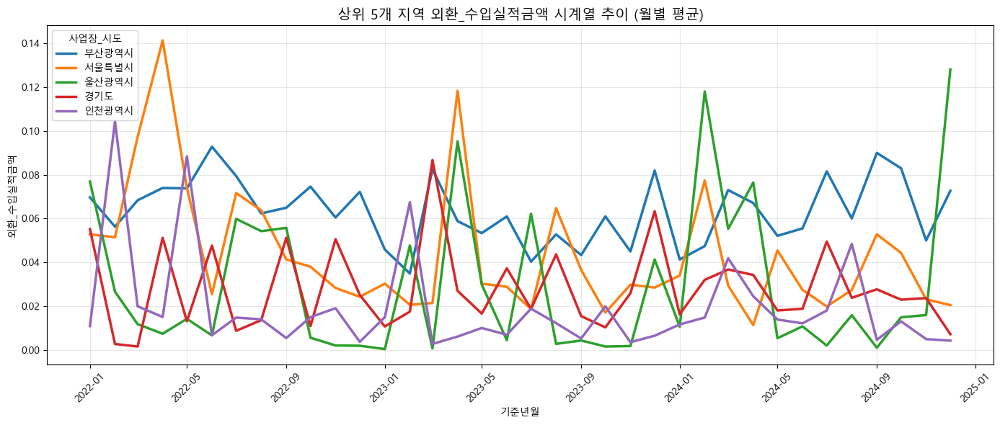

In [45]:
# 기준 열만 바꾸면 됨
# 이후 코드는 동일하게 사용
import pandas as pd
import matplotlib.pyplot as plt

# 1. 상위 시도 5개만 선택 (평균 기준)
top_sido = data.groupby('사업장_시도')['외환_수입실적금액'].mean().nlargest(5).index
filtered_data = data[data['사업장_시도'].isin(top_sido)]

# 2. 월 단위 평균 그룹화
monthly_avg = filtered_data.groupby(['기준년월', '사업장_시도'])['외환_수입실적금액'].mean().reset_index()

# 3. 시계열 플롯
plt.figure(figsize=(14, 6))
for sido in top_sido:
    subset = monthly_avg[monthly_avg['사업장_시도'] == sido]
    plt.plot(subset['기준년월'], subset['외환_수입실적금액'], label=sido, linewidth=2.5)

plt.title('상위 5개 지역 외환_수입실적금액 시계열 추이 (월별 평균)', fontsize=14)
plt.xlabel('기준년월')
plt.ylabel('외환_수입실적금액')
plt.legend(title='사업장_시도')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




✅ 경기도 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
0,건설업,0.00,0.000000,0.05,0.000184,0.0,0.000000,2.0,0.001358
1,교육 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
2,금융 및 보험업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
3,"농업, 임업 및 어업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
4,도매 및 소매업,0.47,0.004421,87.76,0.322576,21.5,0.035073,603.0,0.409369
5,보건업 및 사회복지 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
6,부동산업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
7,"사업시설 관리, 사업 지원 및 임대 서비스업",0.00,0.000000,0.18,0.000662,0.0,0.000000,8.5,0.005771
8,"수도, 하수 및 폐기물 처리, 원료 재생업",1.50,0.014110,0.26,0.000956,68.0,0.110930,9.0,0.006110
9,숙박 및 음식점업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000


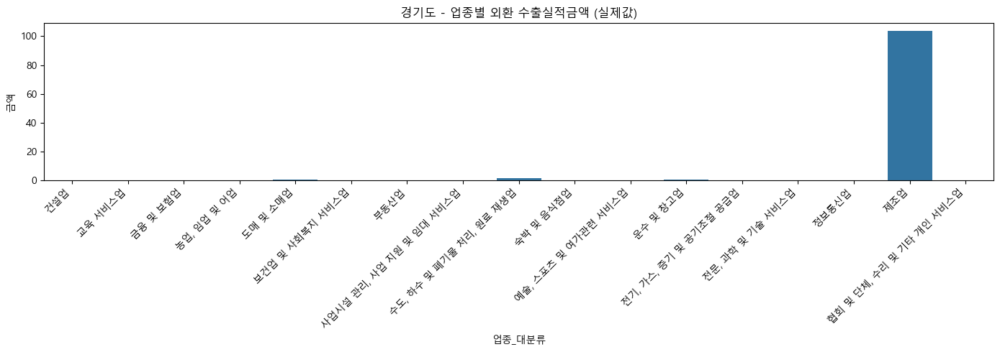

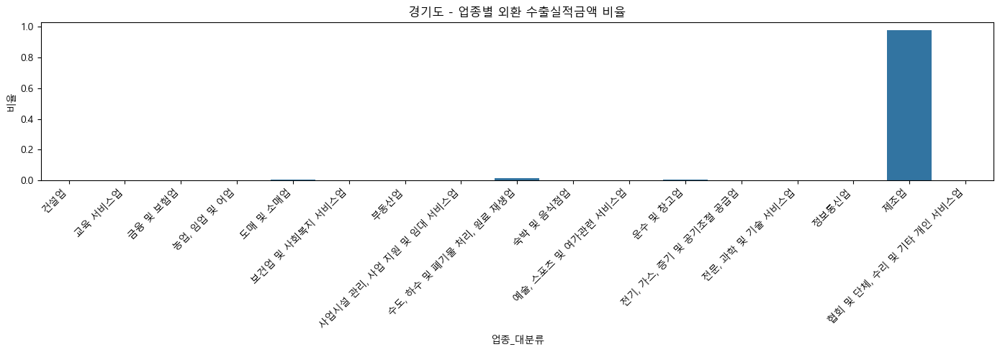

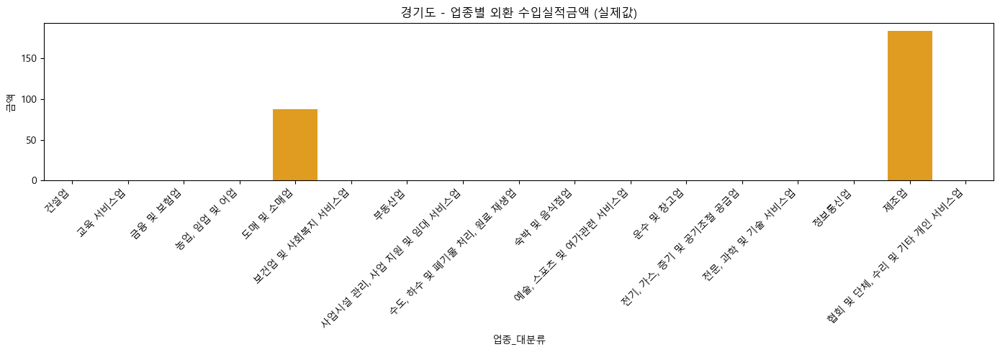

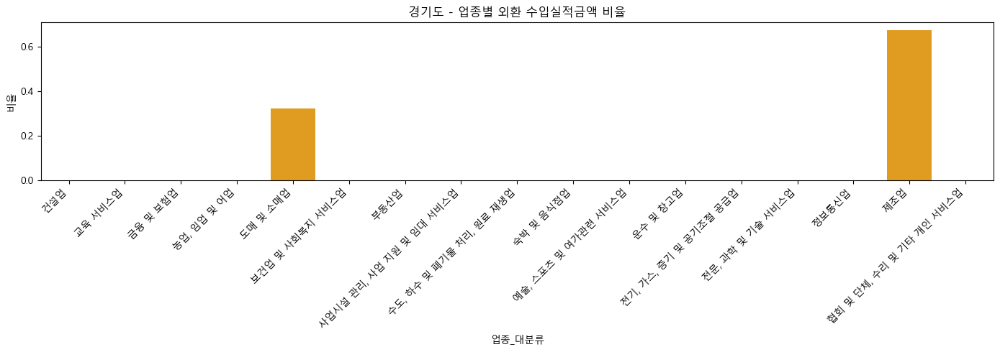

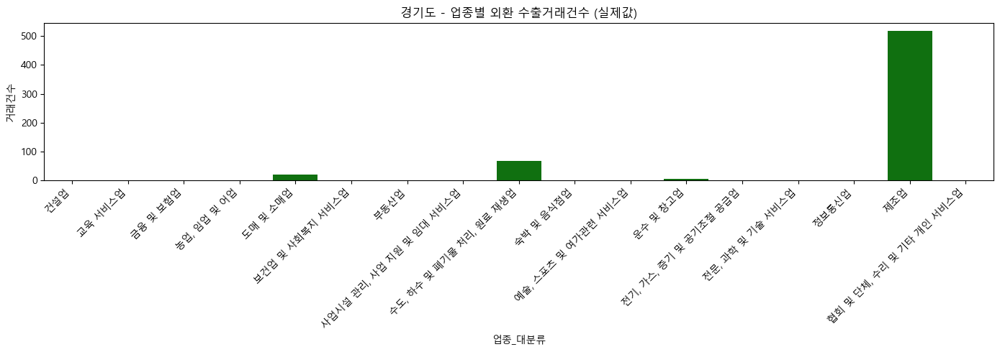

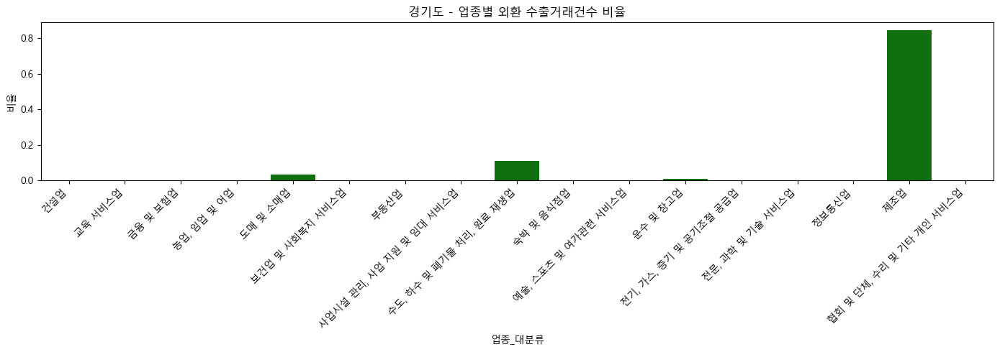

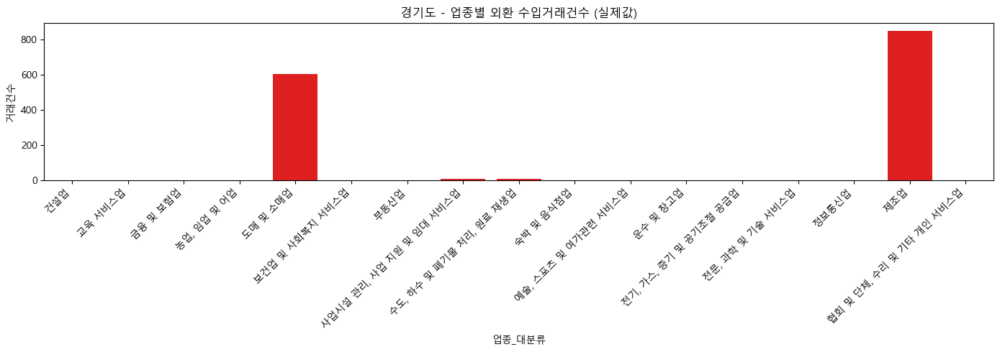

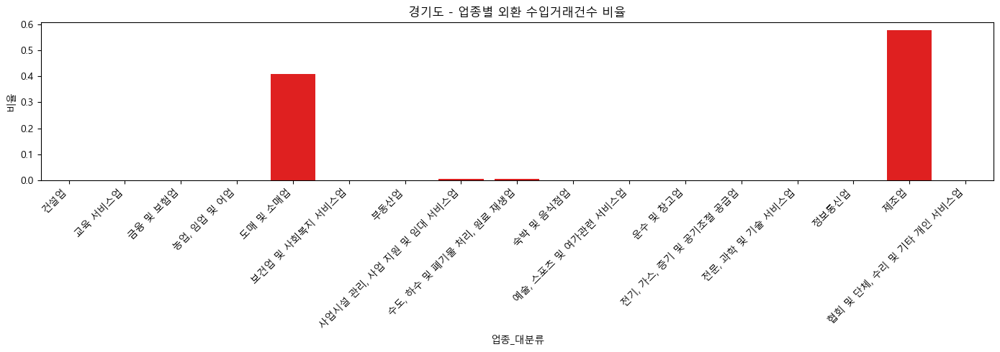



✅ 경상남도 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
17,건설업,0.00,0.000000,0.44,0.002975,0.0,0.000000,32.0,0.024691
18,광업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
19,"농업, 임업 및 어업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
20,도매 및 소매업,32.58,0.320071,50.19,0.339397,58.0,0.086891,355.0,0.273920
21,보건업 및 사회복지 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
22,부동산업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
23,"사업시설 관리, 사업 지원 및 임대 서비스업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
24,"수도, 하수 및 폐기물 처리, 원료 재생업",0.00,0.000000,0.14,0.000947,0.0,0.000000,4.0,0.003086
25,숙박 및 음식점업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
26,"예술, 스포츠 및 여가관련 서비스업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000


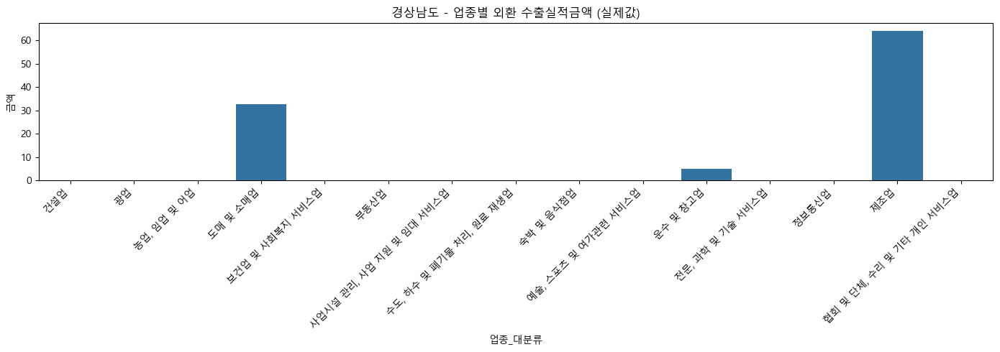

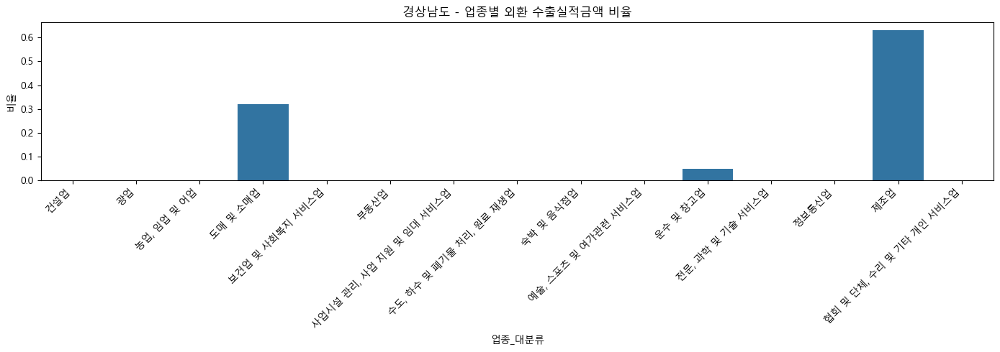

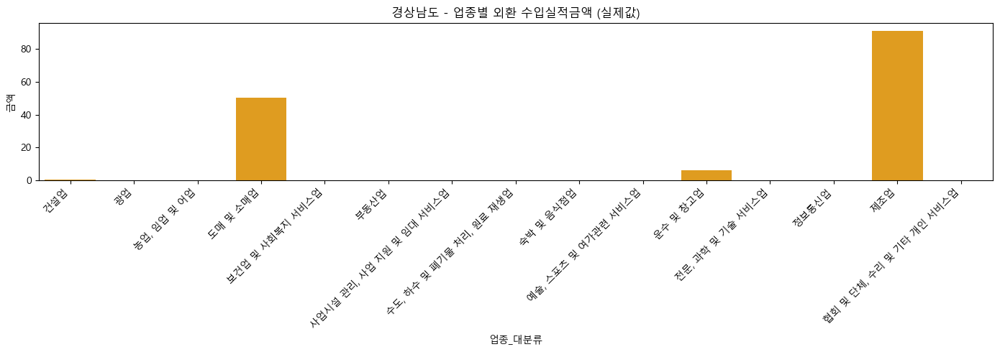

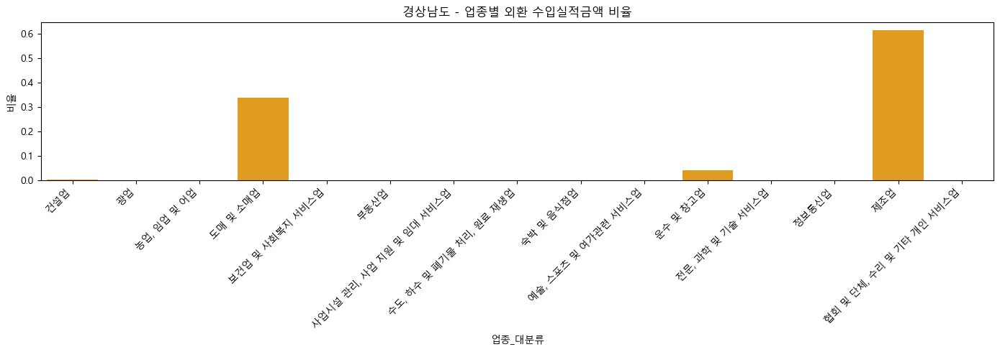

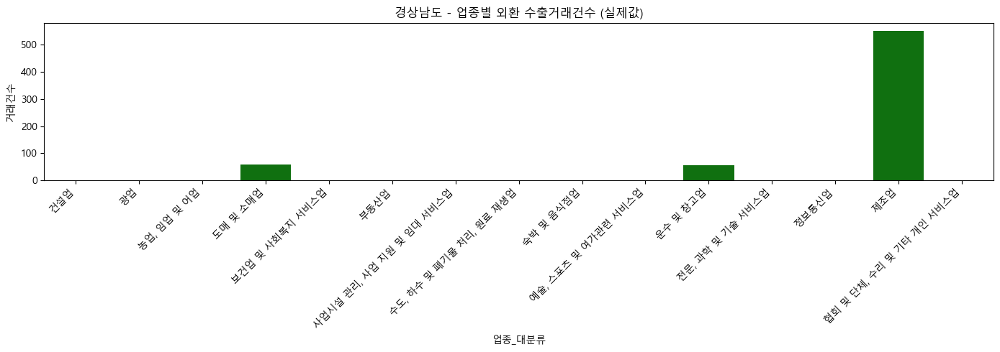

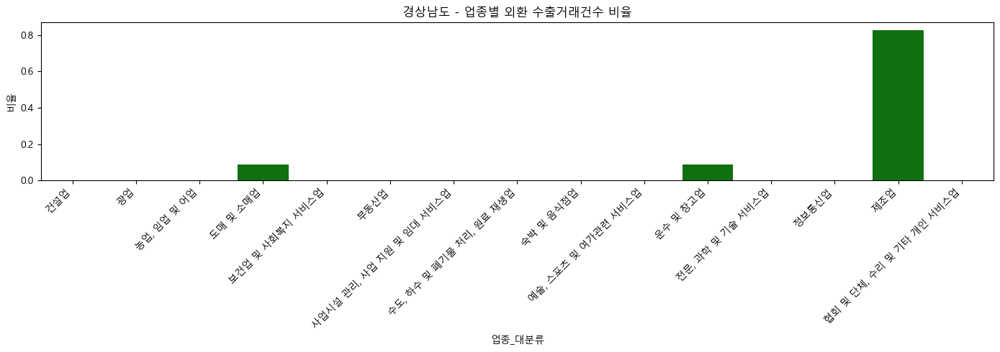

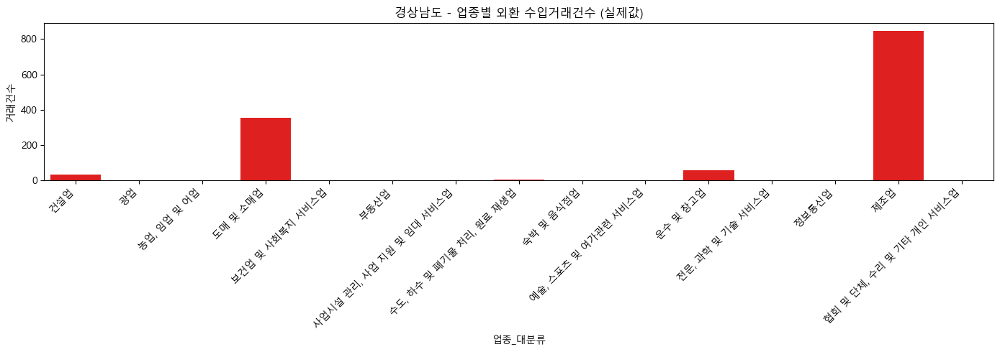

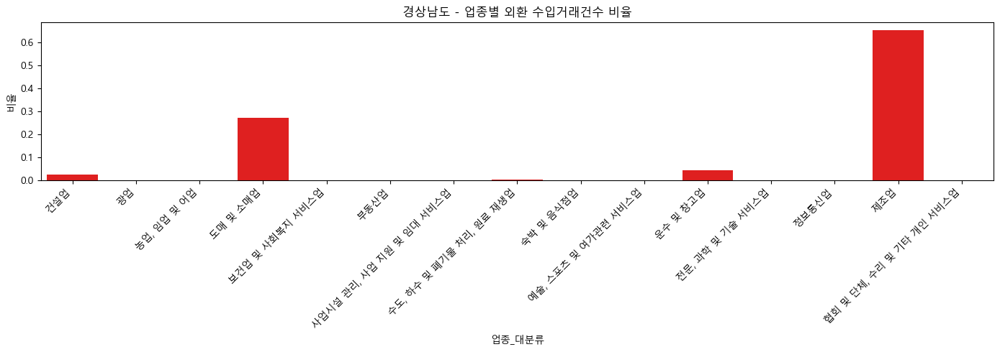



✅ 경상북도 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
32,건설업,20.80,0.006574,2.71,0.002173,31.5,0.001676,131.5,0.009382
33,광업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
34,교육 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
35,금융 및 보험업,0.04,0.000013,0.00,0.000000,1.0,0.000053,0.0,0.000000
36,"농업, 임업 및 어업",0.69,0.000218,2.99,0.002397,15.0,0.000798,65.5,0.004673
37,도매 및 소매업,70.91,0.022413,133.36,0.106922,1345.0,0.071560,1842.5,0.131457
38,보건업 및 사회복지 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
39,부동산업,0.06,0.000019,0.00,0.000000,2.0,0.000106,0.0,0.000000
40,"사업시설 관리, 사업 지원 및 임대 서비스업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
41,"수도, 하수 및 폐기물 처리, 원료 재생업",8.97,0.002835,57.86,0.046390,99.5,0.005294,809.0,0.057720


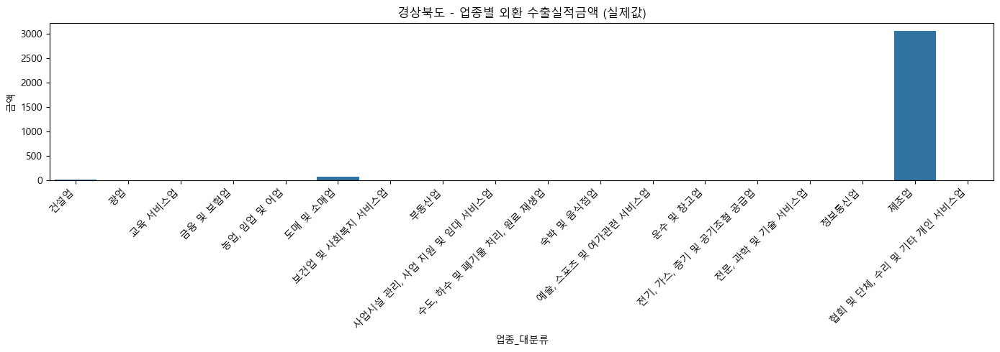

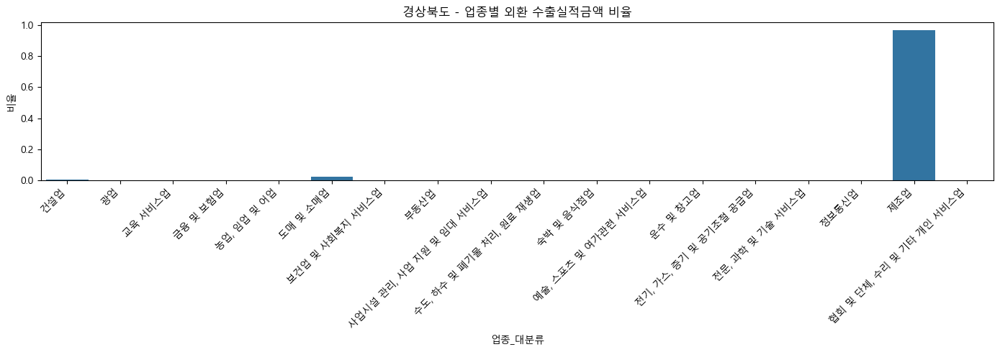

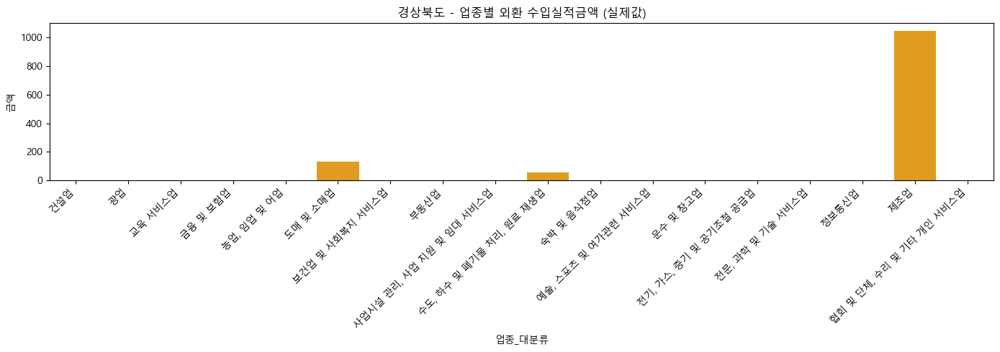

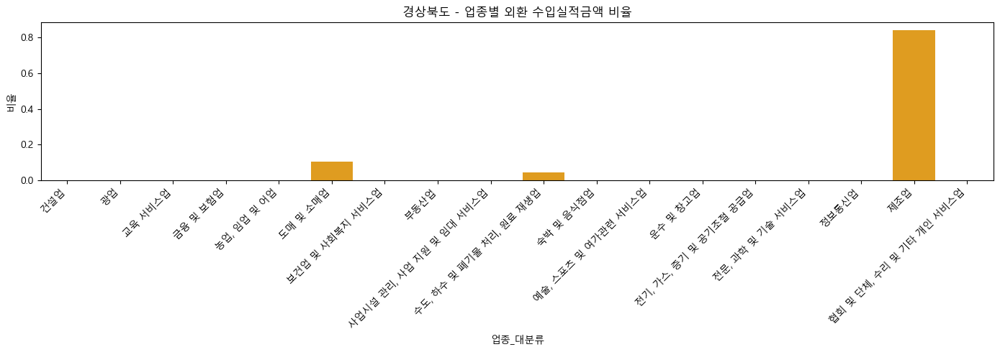

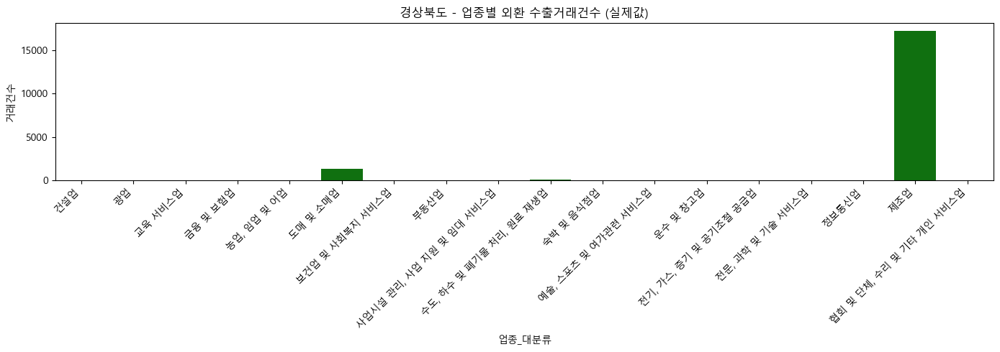

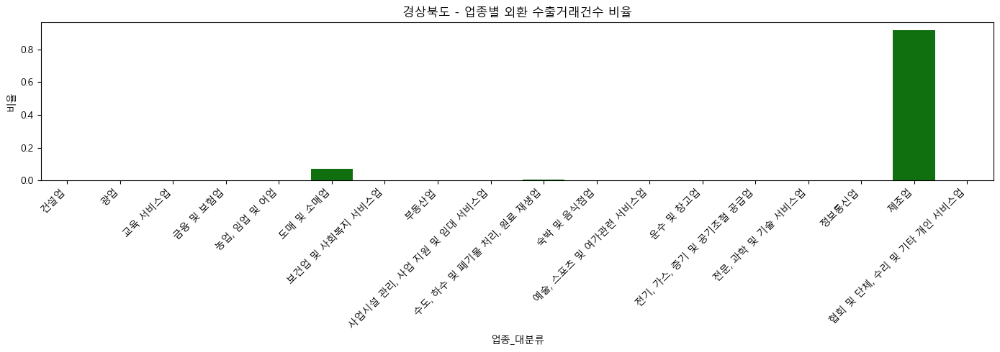

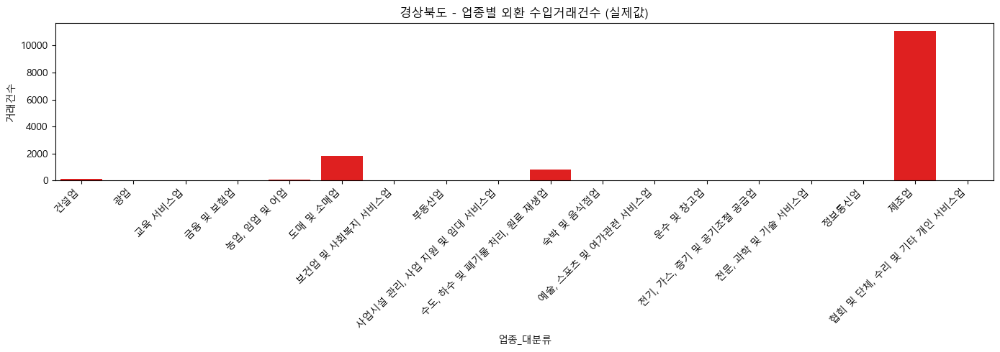

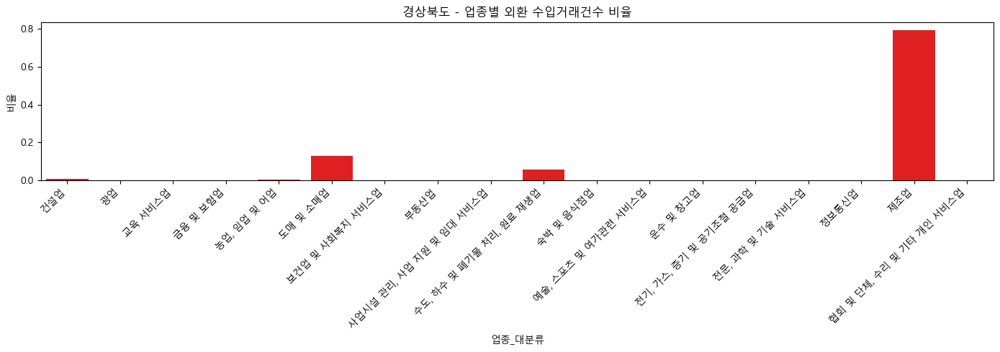



✅ 광주광역시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
50,건설업,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
51,도매 및 소매업,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
52,"전문, 과학 및 기술 서비스업",0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN


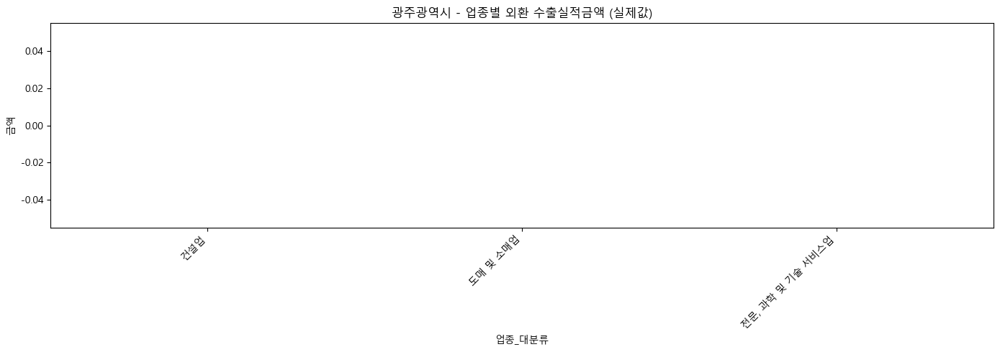

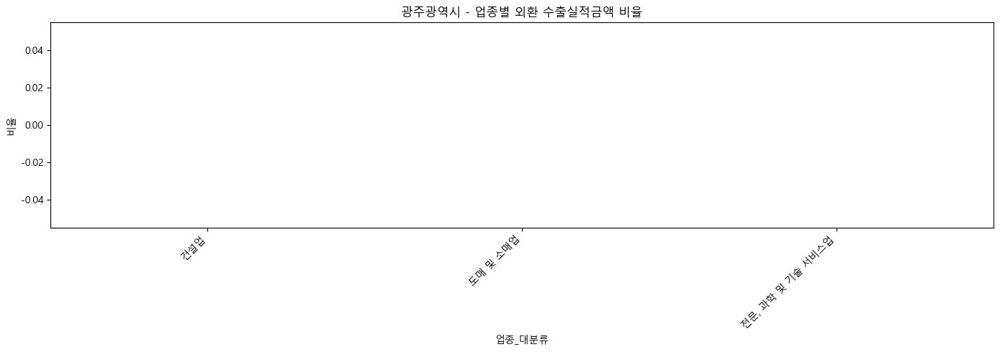

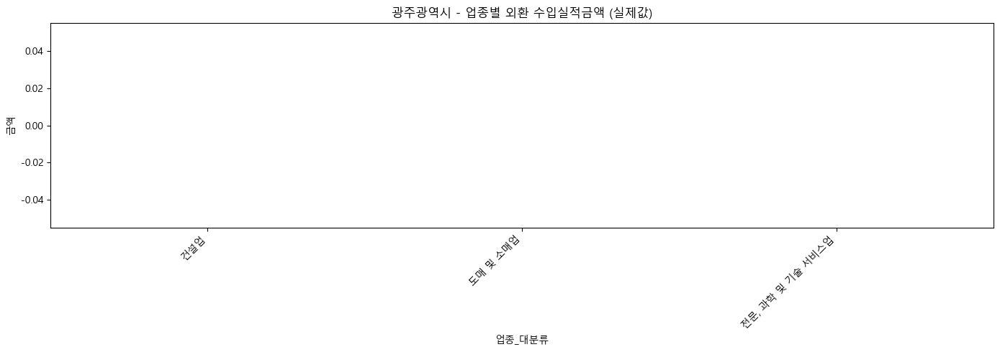

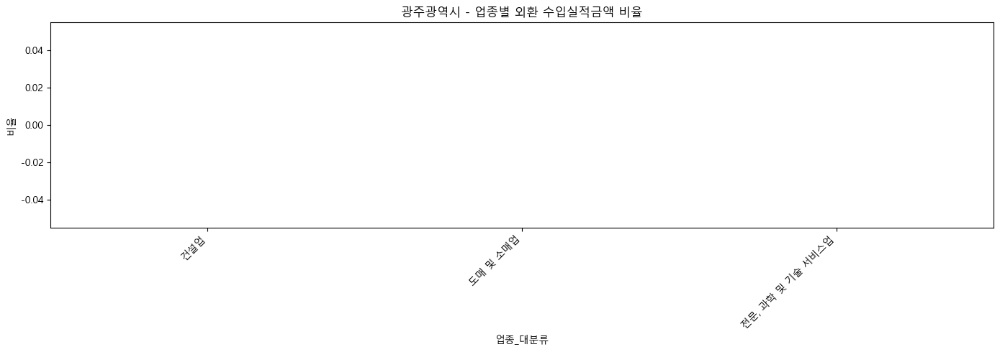

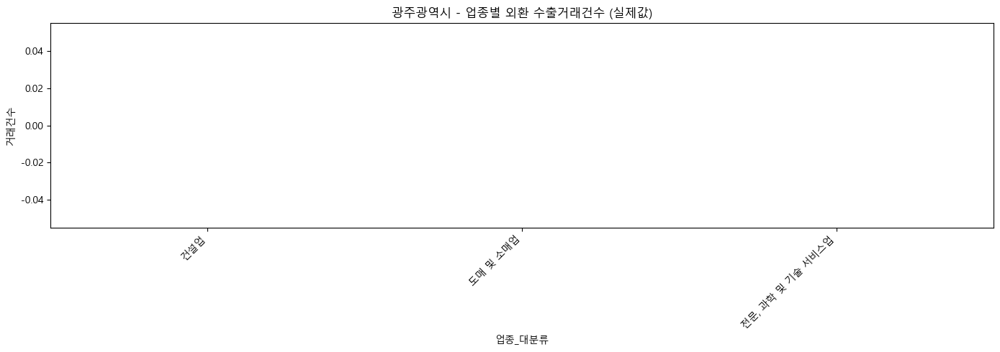

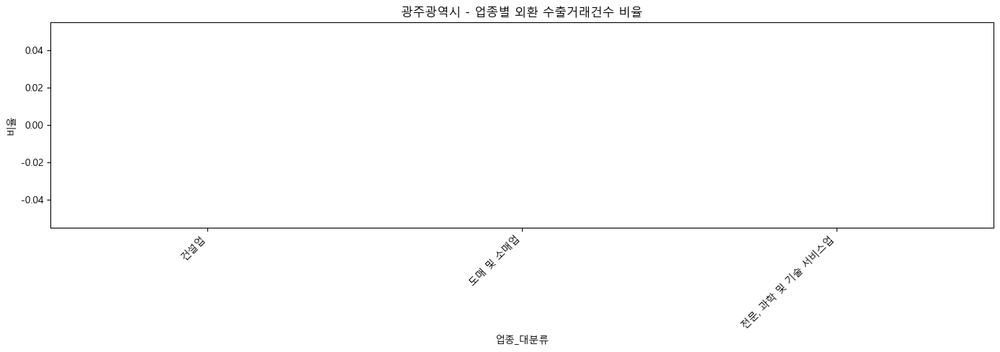

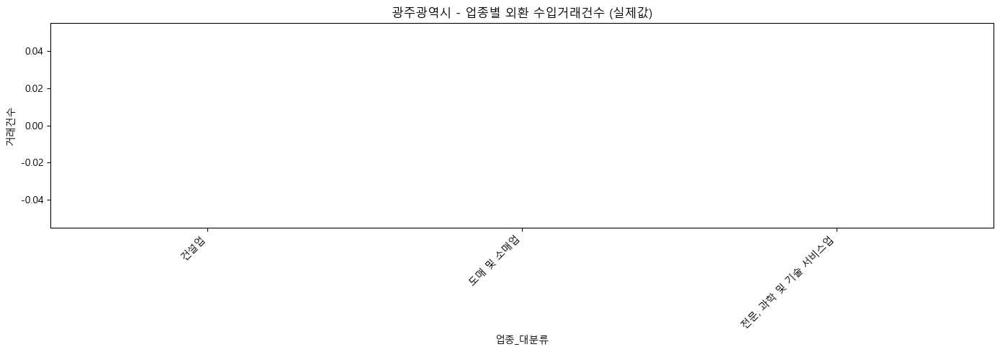

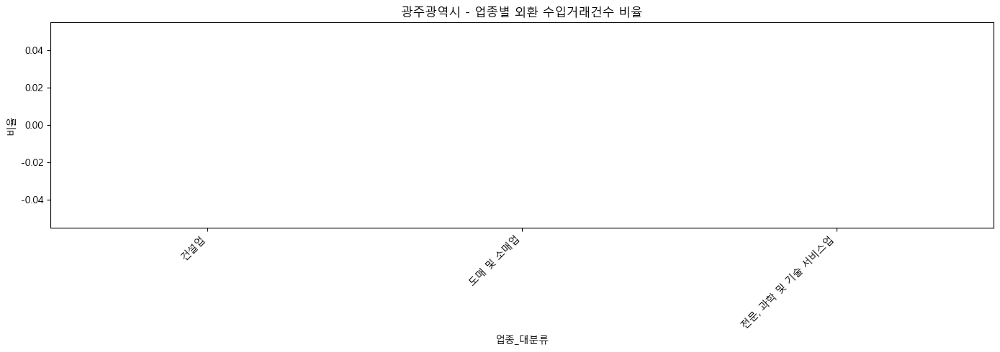



✅ 대구광역시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
53,건설업,2.64,0.003578,14.28,0.008362,10.0,0.000890,360.5,0.023118
54,교육 서비스업,0.00,0.000000,0.05,0.000029,0.0,0.000000,3.0,0.000192
55,금융 및 보험업,0.29,0.000393,0.00,0.000000,11.0,0.000979,0.0,0.000000
56,"농업, 임업 및 어업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
57,도매 및 소매업,78.97,0.107026,354.24,0.207430,1619.5,0.144154,6667.0,0.427536
58,보건업 및 사회복지 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
59,부동산업,0.00,0.000000,0.24,0.000141,0.0,0.000000,4.0,0.000257
60,"사업시설 관리, 사업 지원 및 임대 서비스업",0.10,0.000136,0.10,0.000059,8.5,0.000757,3.0,0.000192
61,"수도, 하수 및 폐기물 처리, 원료 재생업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
62,숙박 및 음식점업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000


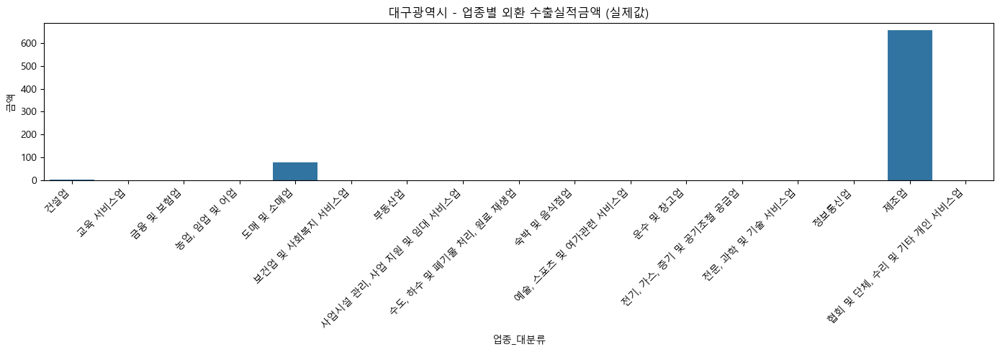

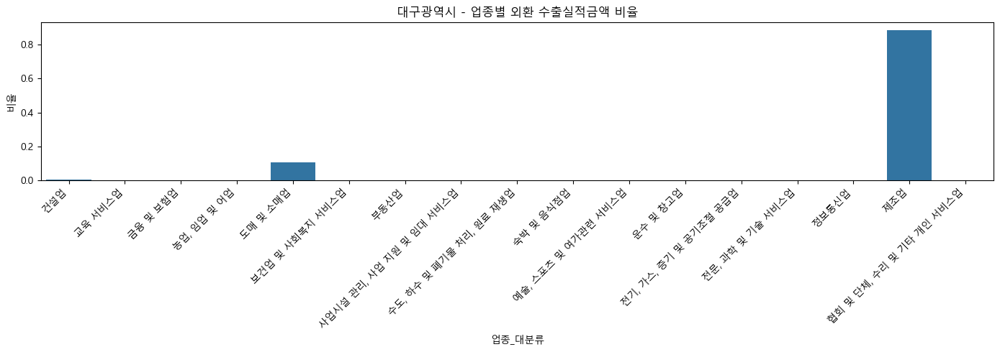

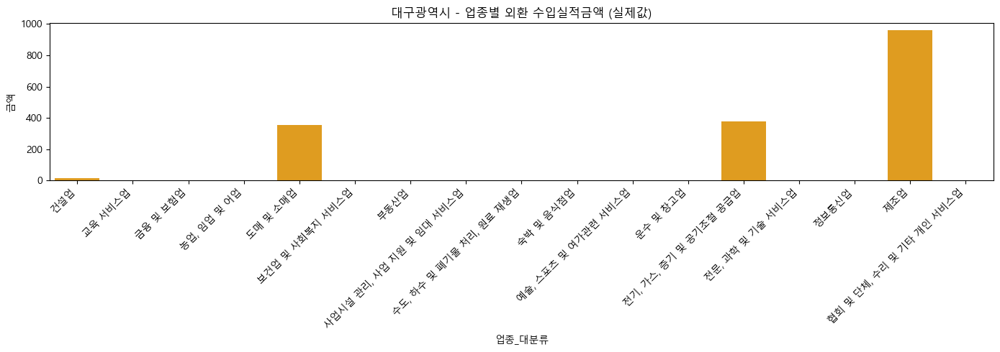

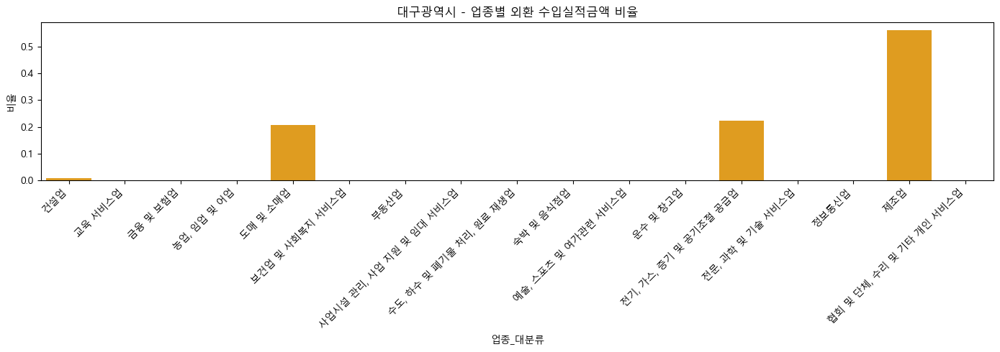

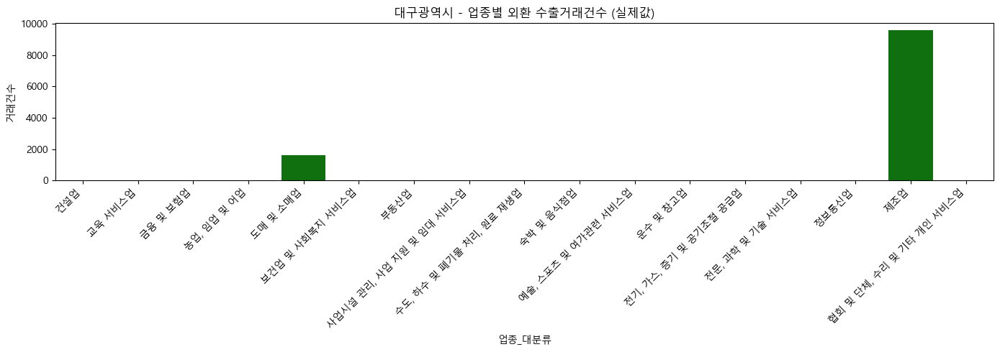

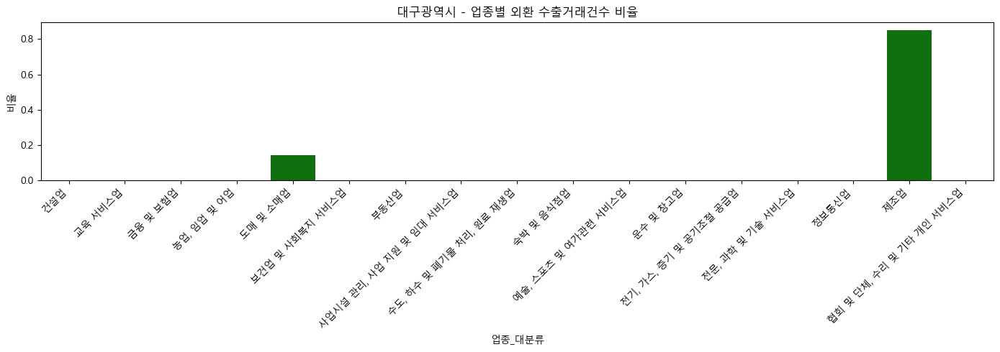

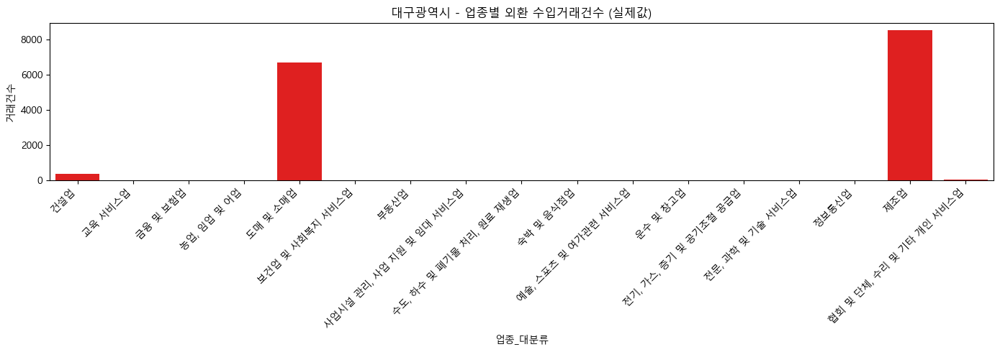

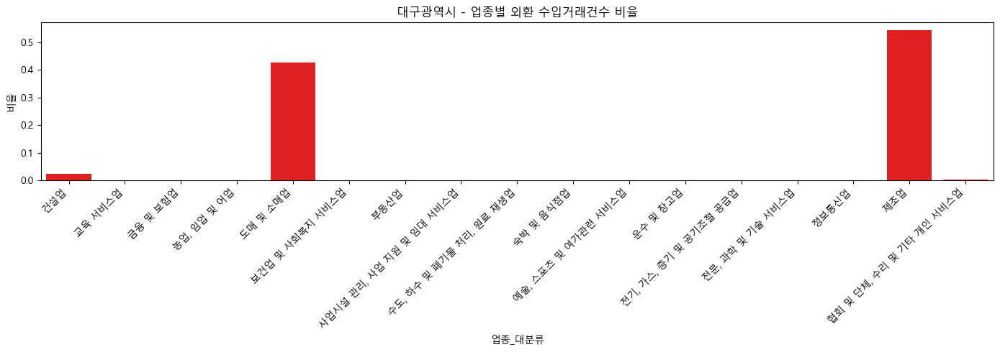



✅ 대전광역시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
70,건설업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
71,금융 및 보험업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
72,도매 및 소매업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
73,보건업 및 사회복지 서비스업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
74,부동산업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
75,숙박 및 음식점업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
76,"예술, 스포츠 및 여가관련 서비스업",0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
77,"전기, 가스, 증기 및 공기조절 공급업",0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
78,"전문, 과학 및 기술 서비스업",0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
79,정보통신업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0


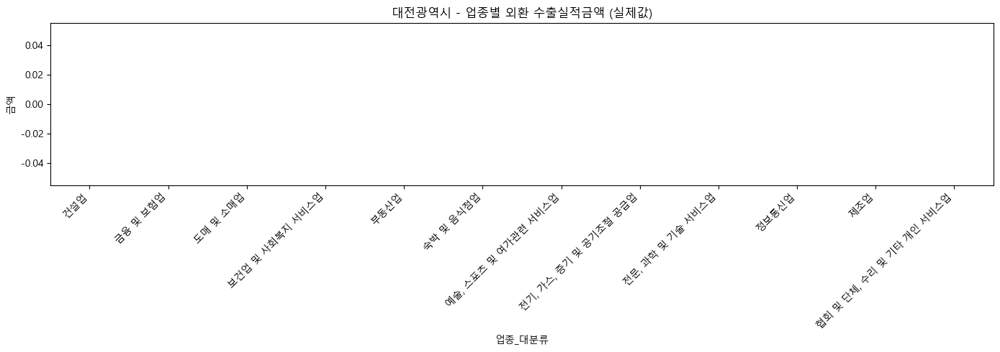

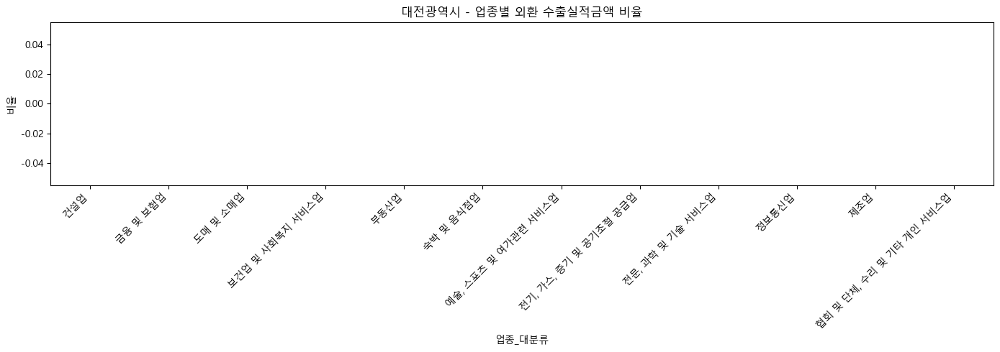

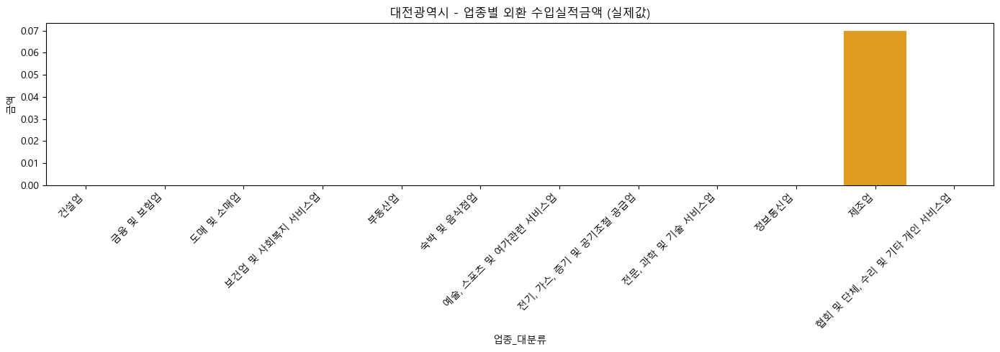

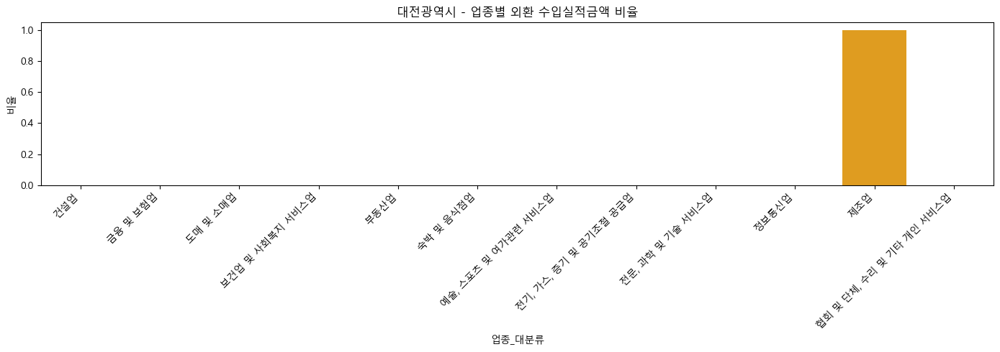

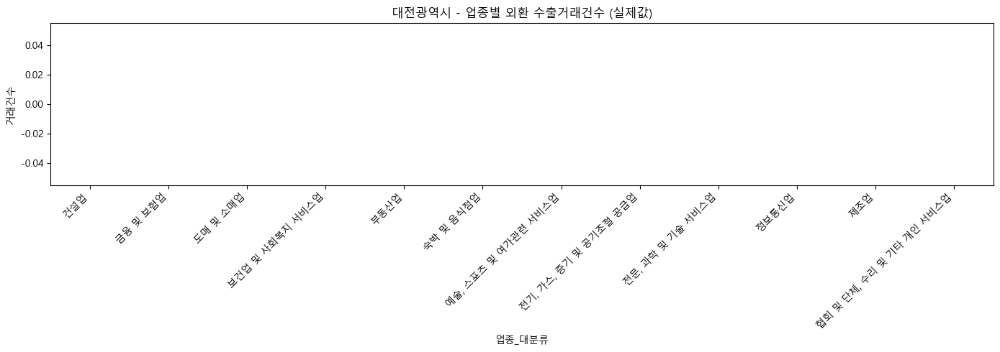

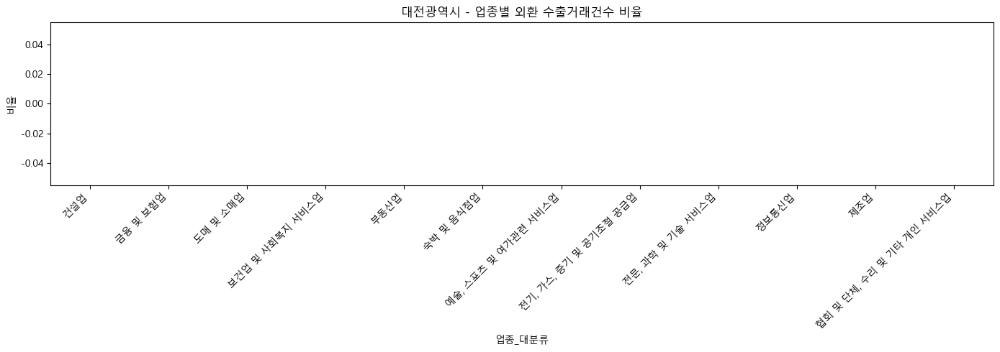

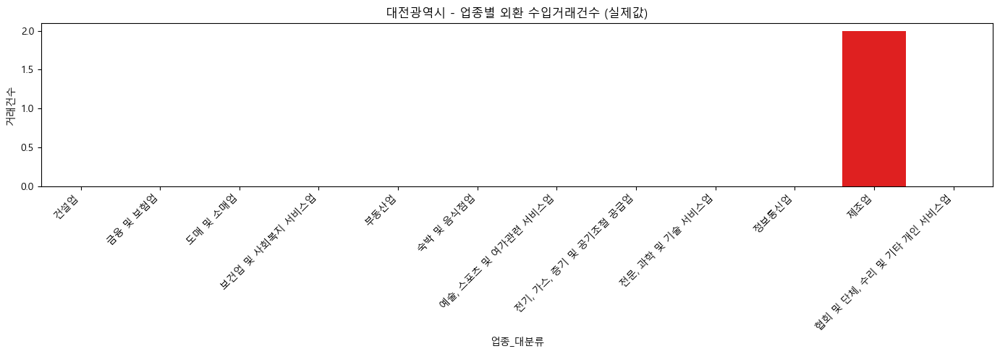

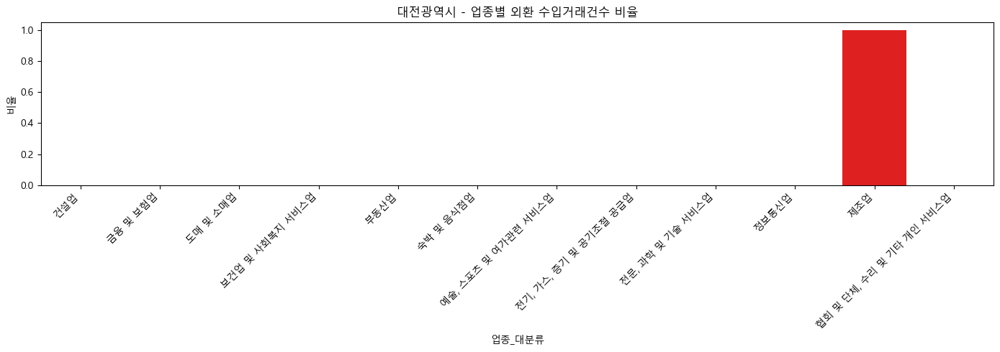



✅ 부산광역시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
82,건설업,0.00,0.000000,0.03,0.000029,0.0,0.000000,5.5,0.001506
83,교육 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
84,금융 및 보험업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
85,도매 및 소매업,105.54,0.284275,120.21,0.117458,1983.5,0.558496,1757.5,0.481111
86,보건업 및 사회복지 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
87,부동산업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
88,"사업시설 관리, 사업 지원 및 임대 서비스업",0.00,0.000000,0.02,0.000020,0.0,0.000000,2.0,0.000547
89,"수도, 하수 및 폐기물 처리, 원료 재생업",0.00,0.000000,6.67,0.006517,0.0,0.000000,35.0,0.009581
90,숙박 및 음식점업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
91,"예술, 스포츠 및 여가관련 서비스업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000


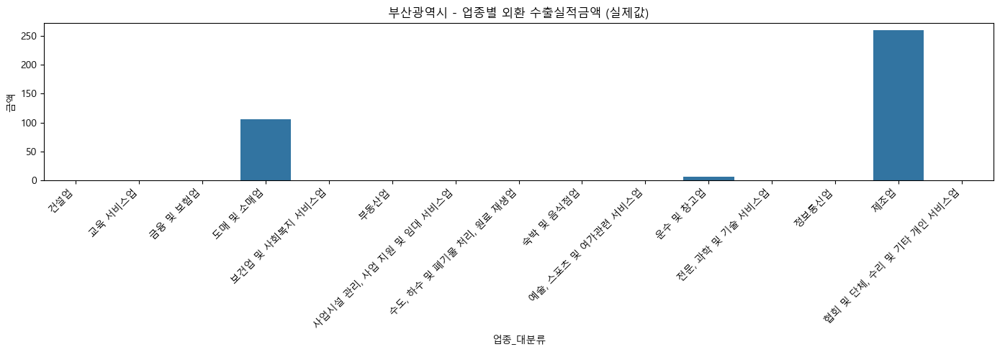

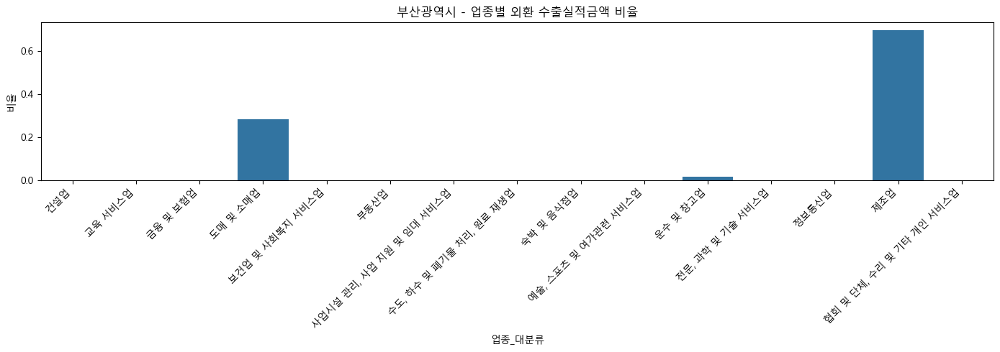

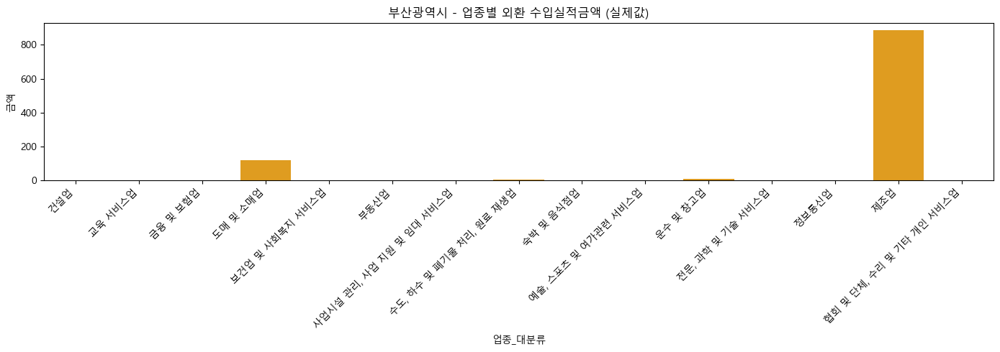

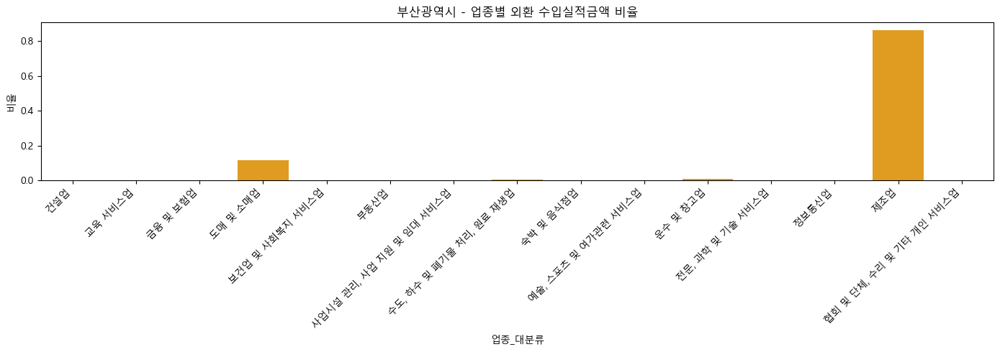

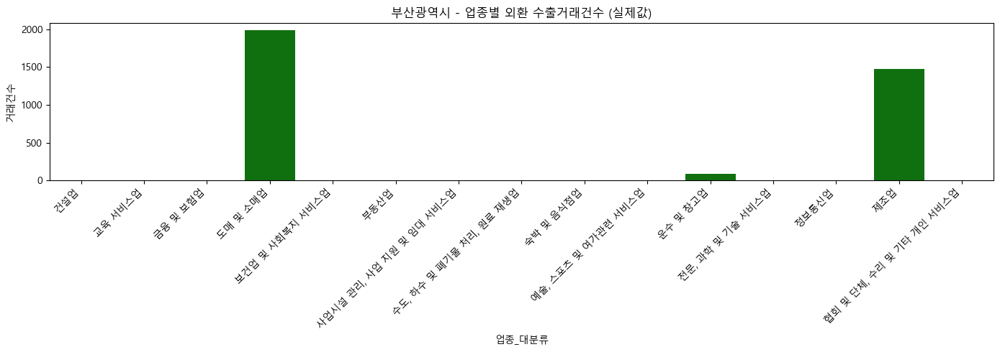

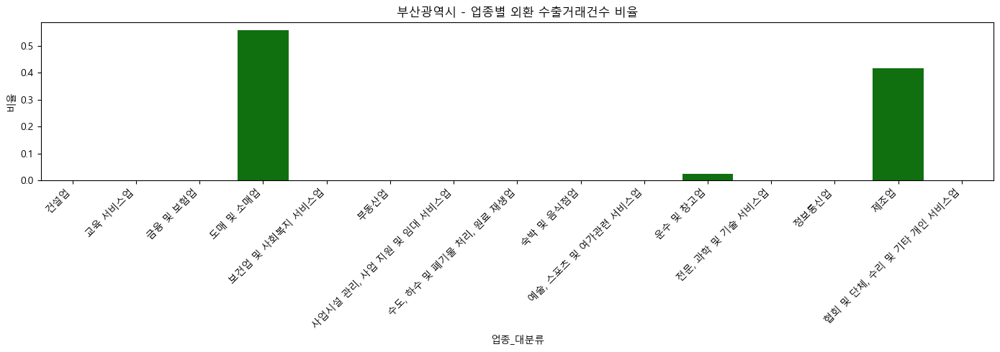

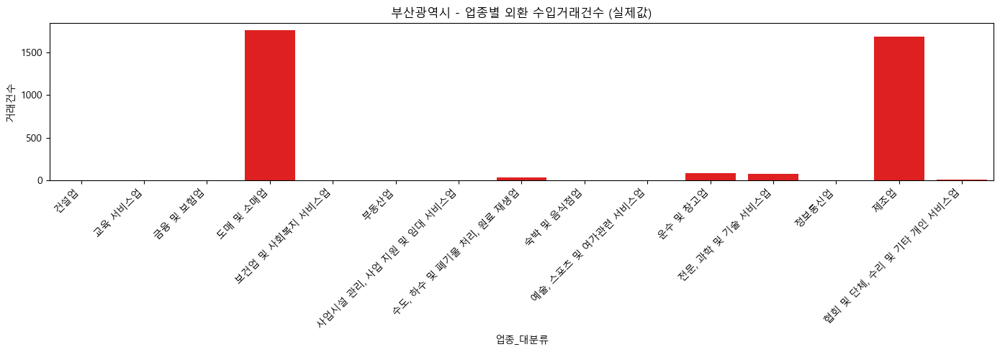

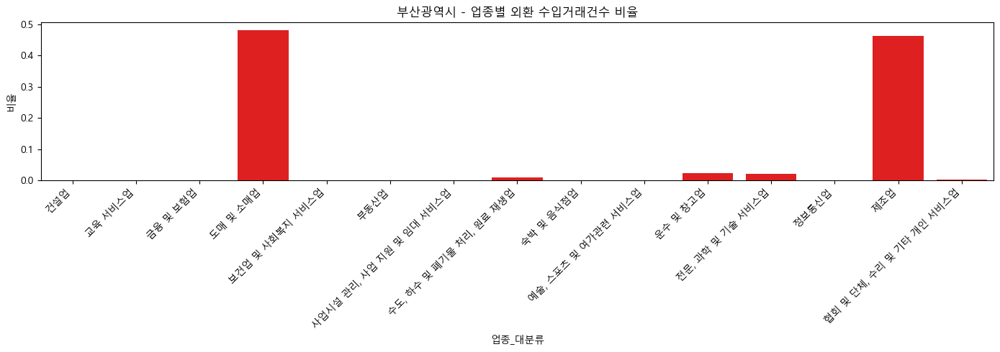



✅ 서울특별시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
97,건설업,0.00,0.000000,6.58,0.009373,0.0,0.000000,89.0,0.023752
98,광업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
99,교육 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
100,금융 및 보험업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
101,도매 및 소매업,481.32,0.428896,282.16,0.401914,1469.5,0.240763,1453.5,0.387910
102,보건업 및 사회복지 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
103,부동산업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
104,"사업시설 관리, 사업 지원 및 임대 서비스업",0.00,0.000000,0.42,0.000598,0.0,0.000000,7.5,0.002002
105,"수도, 하수 및 폐기물 처리, 원료 재생업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
106,숙박 및 음식점업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000


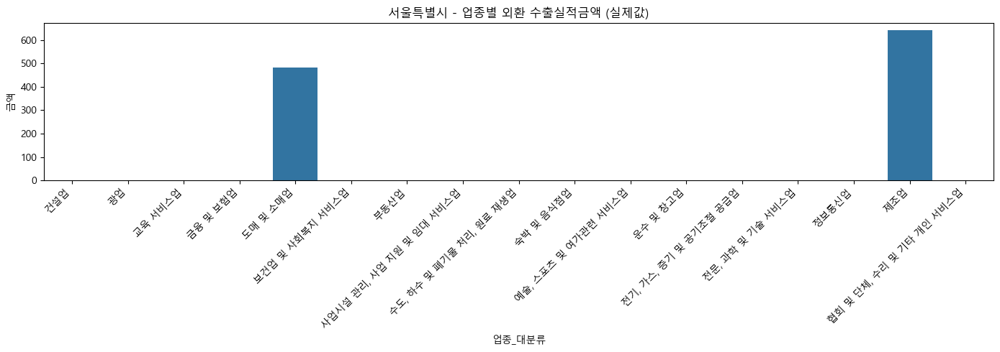

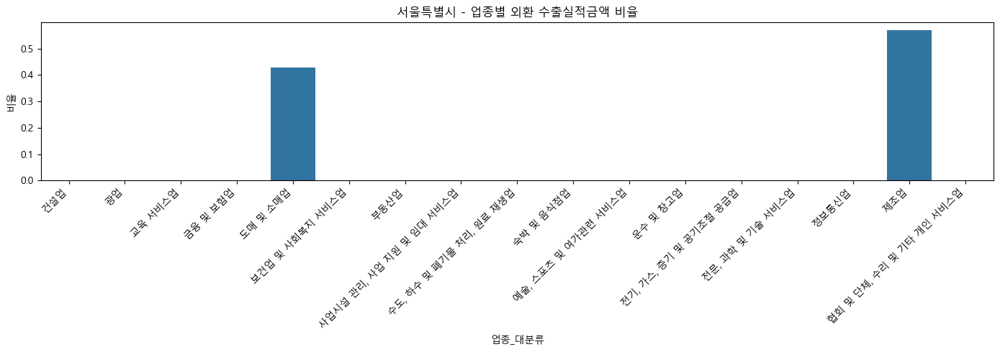

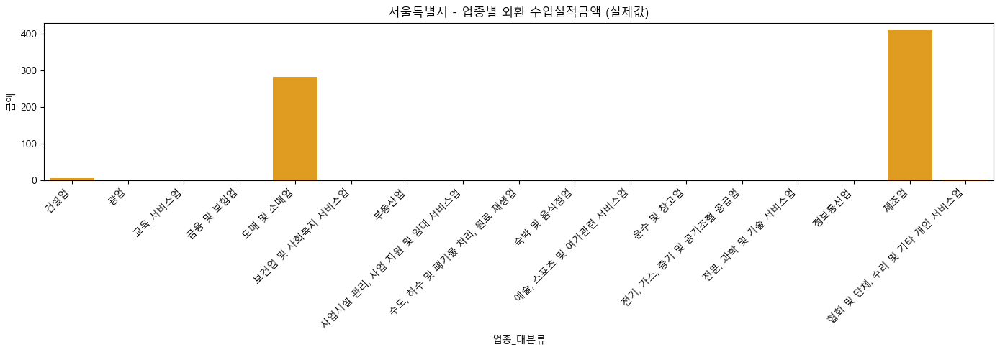

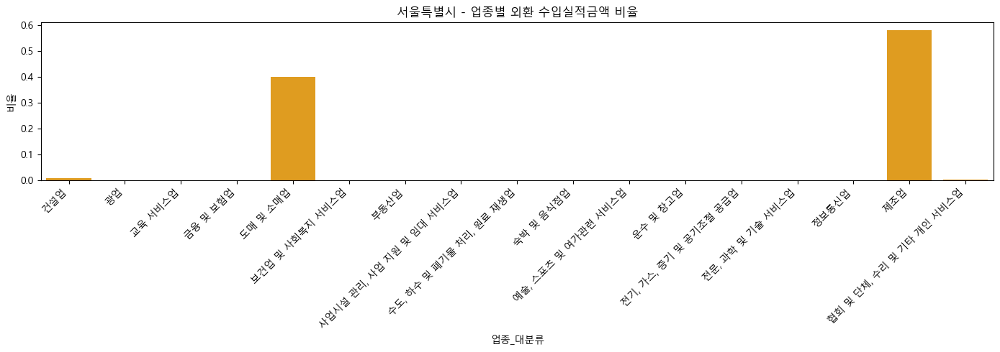

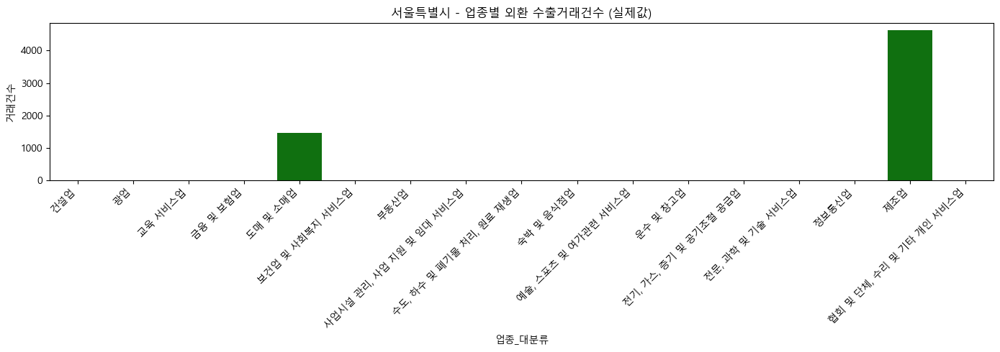

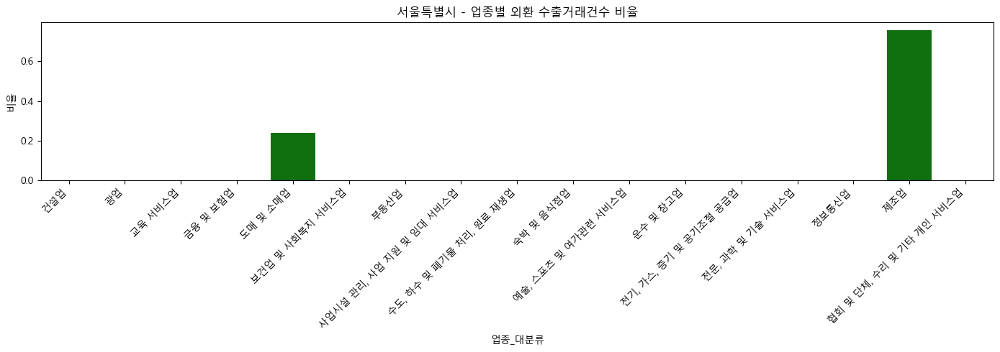

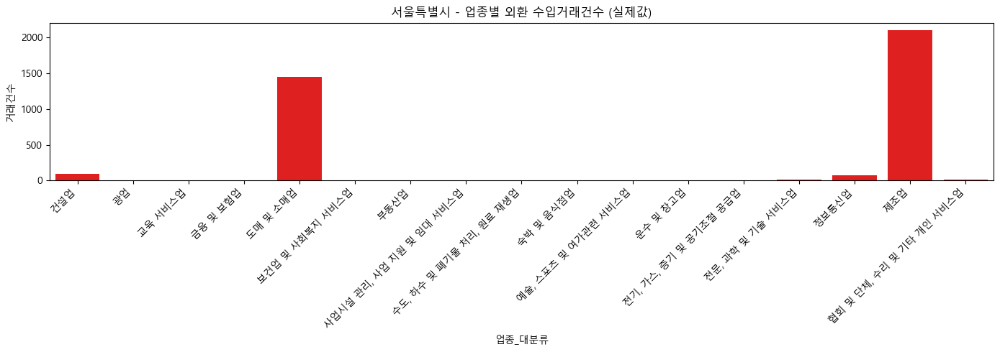

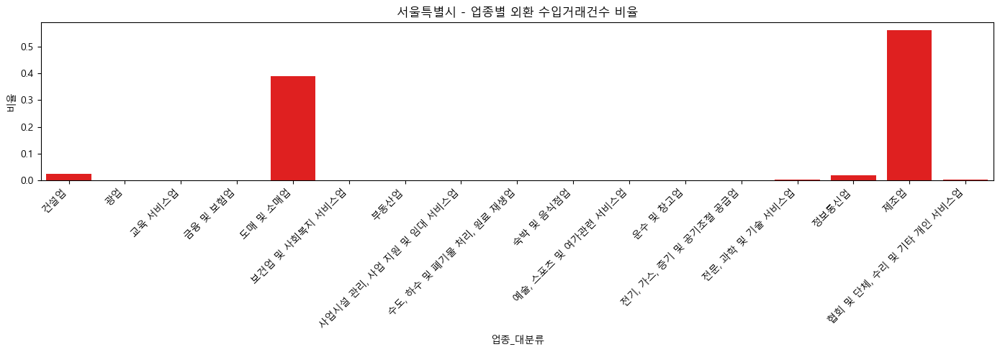



✅ 세종특별자치시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
114,건설업,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
115,광업,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
116,부동산업,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
117,제조업,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN


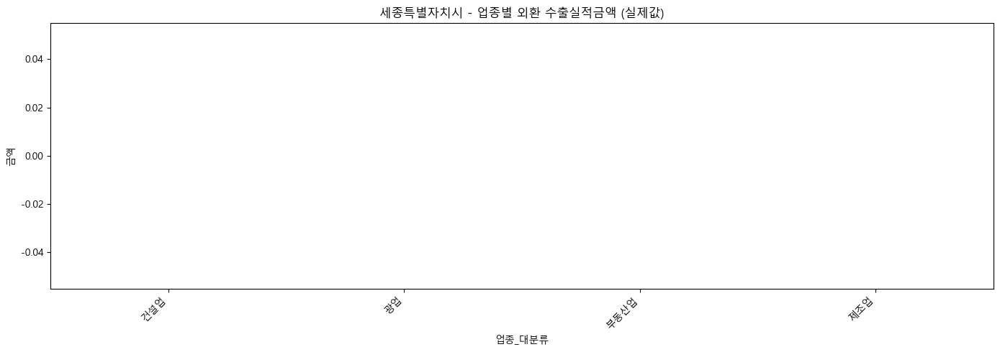

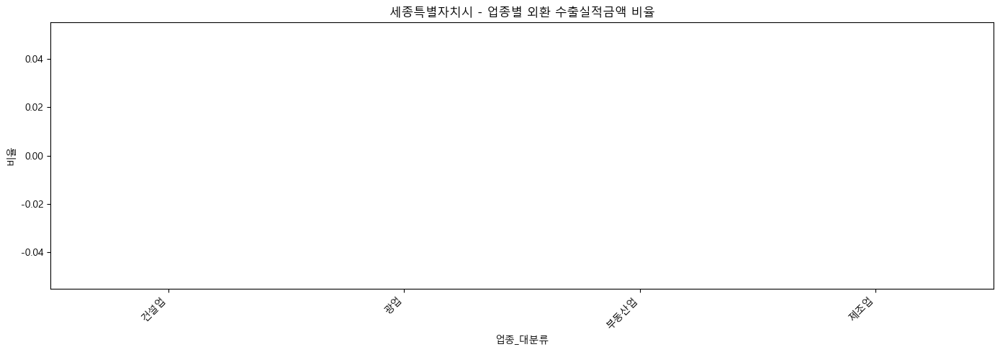

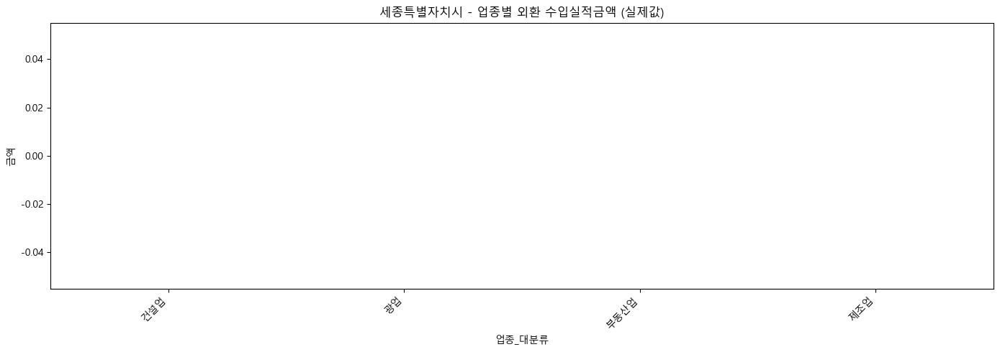

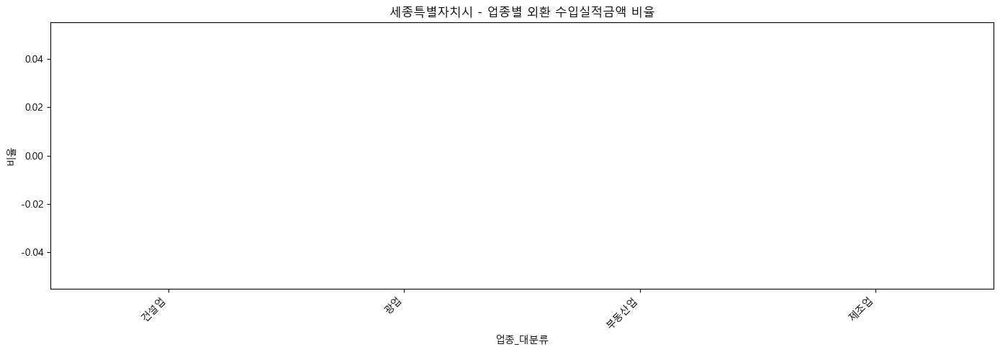

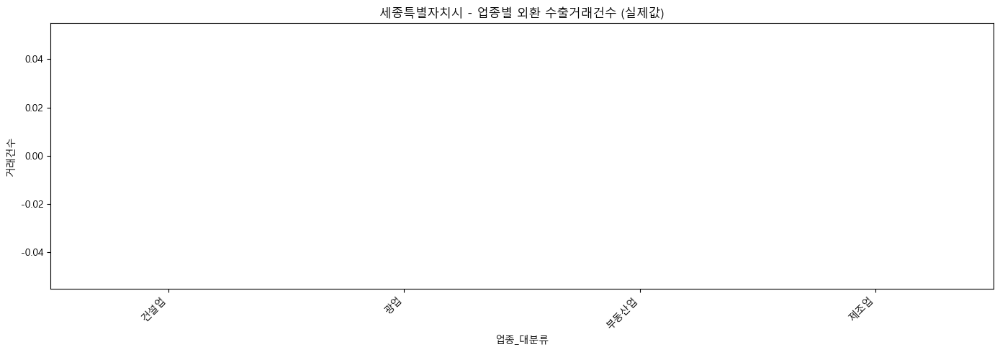

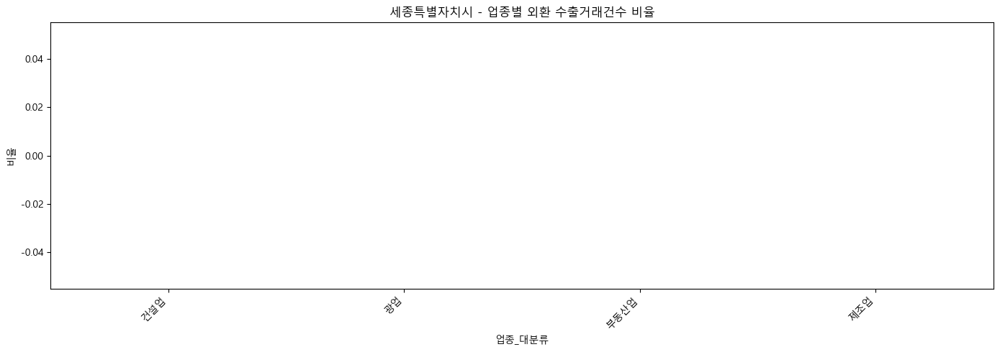

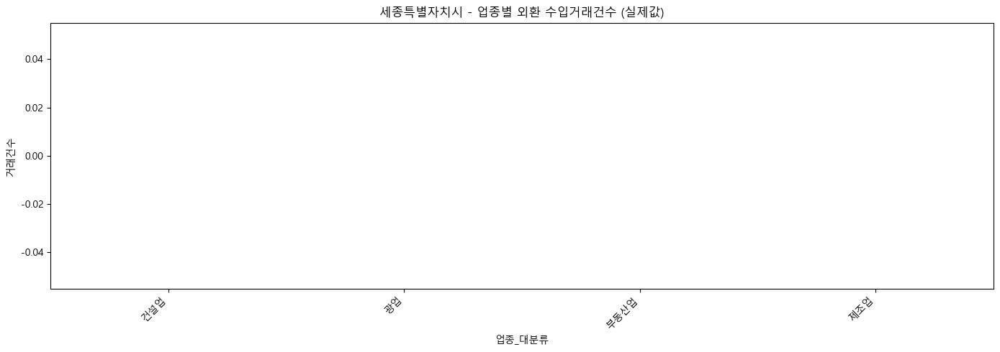

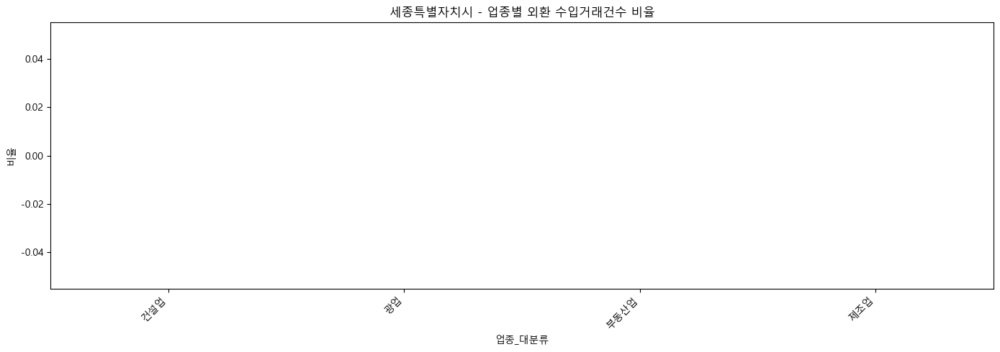



✅ 울산광역시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
118,건설업,0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000
119,도매 및 소매업,0.17,0.00083,1.35,0.014209,1.0,0.000509,48.5,0.163851
120,보건업 및 사회복지 서비스업,0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000
121,부동산업,0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000
122,"사업시설 관리, 사업 지원 및 임대 서비스업",0.08,0.00039,0.00,0.000000,3.0,0.001526,0.0,0.000000
123,"수도, 하수 및 폐기물 처리, 원료 재생업",0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000
124,숙박 및 음식점업,0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000
125,"예술, 스포츠 및 여가관련 서비스업",0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000
126,운수 및 창고업,0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000
127,"전기, 가스, 증기 및 공기조절 공급업",0.00,0.00000,0.00,0.000000,0.0,0.000000,0.0,0.000000


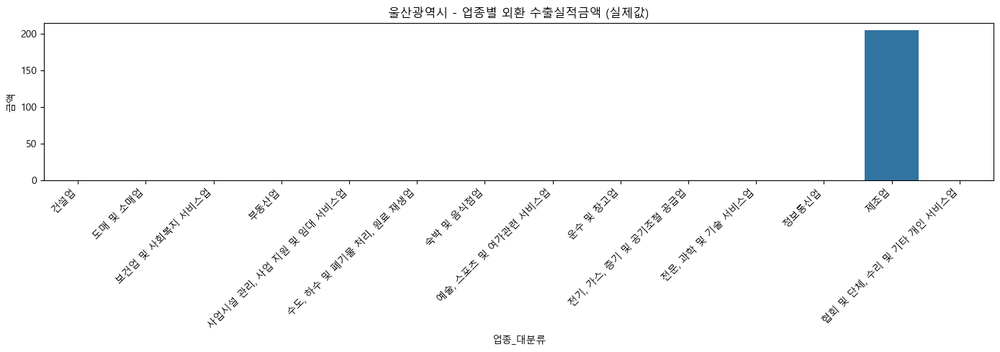

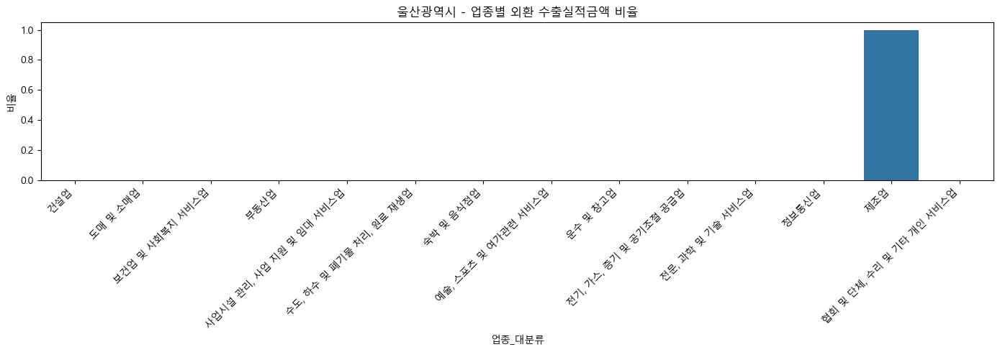

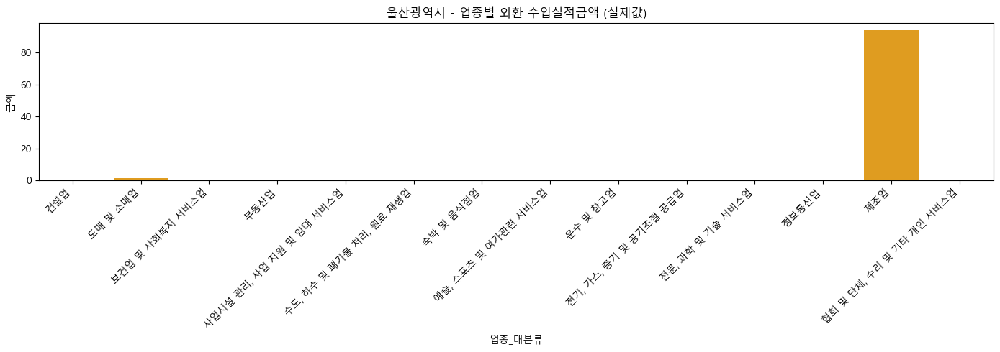

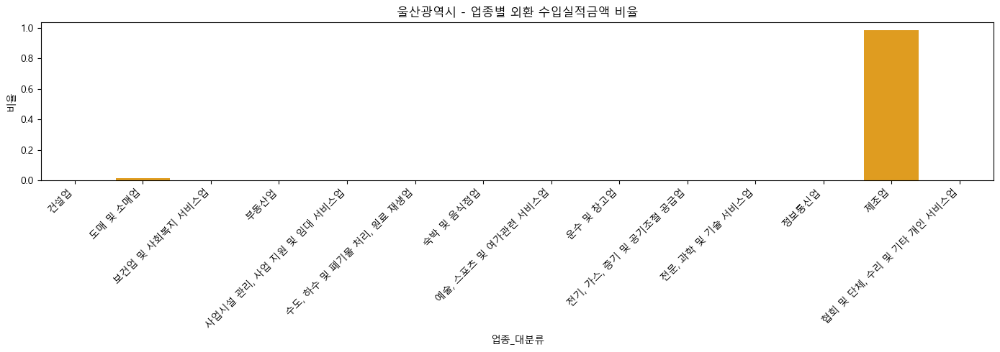

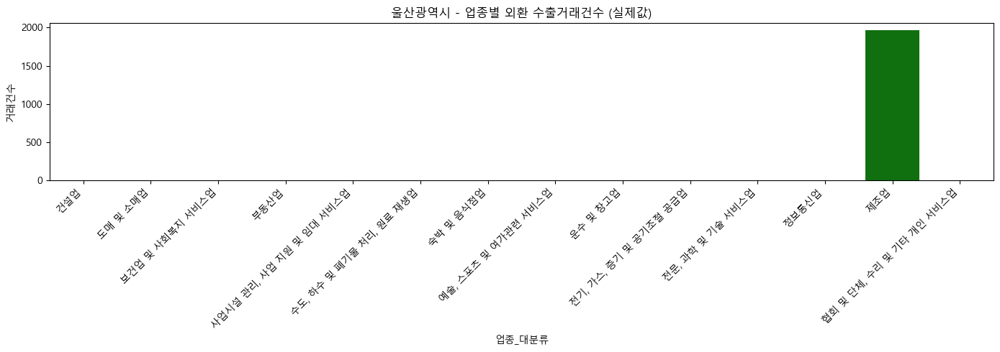

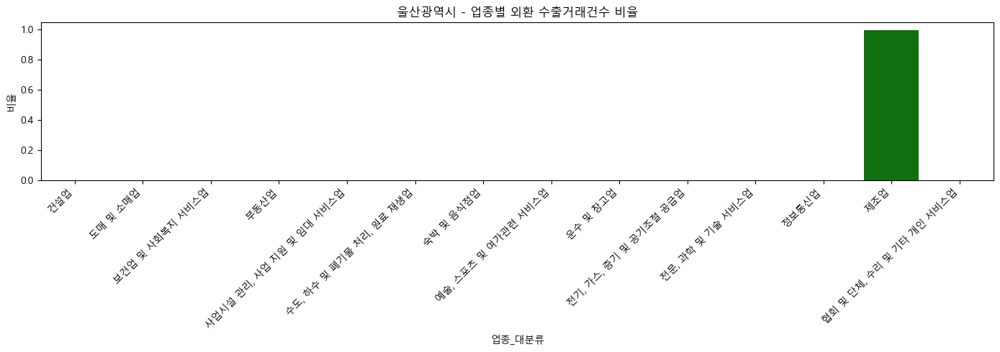

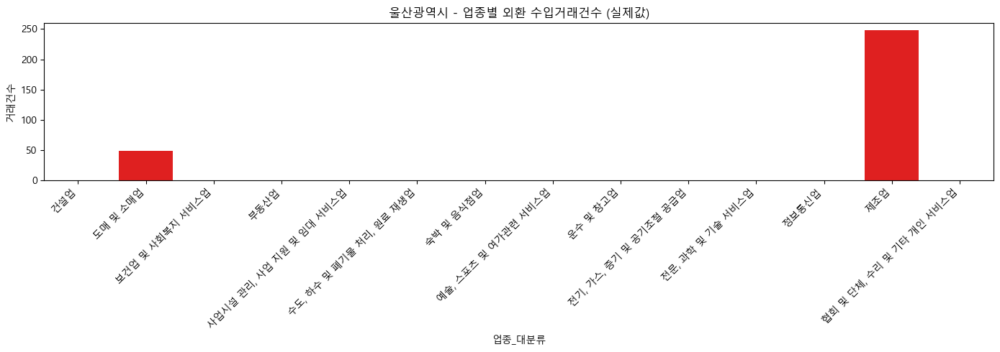

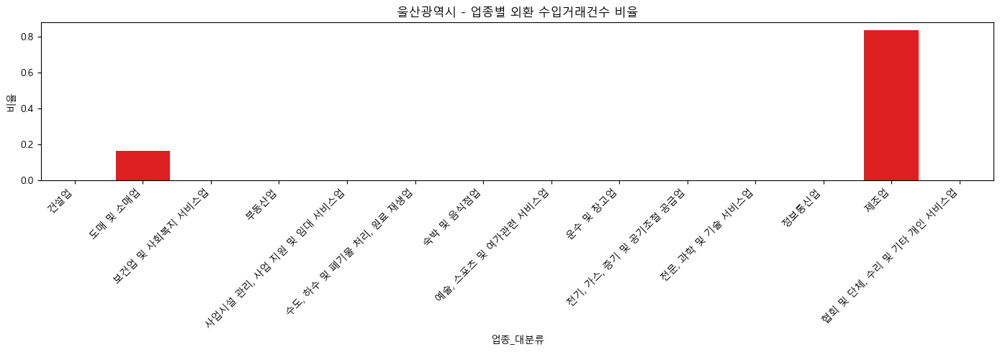



✅ 인천광역시 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
132,건설업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
133,교육 서비스업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
134,도매 및 소매업,7.26,0.672222,12.23,0.219254,48.0,0.354244,237.5,0.350037
135,부동산업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
136,"사업시설 관리, 사업 지원 및 임대 서비스업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
137,"수도, 하수 및 폐기물 처리, 원료 재생업",0.00,0.000000,0.55,0.009860,0.0,0.000000,11.5,0.016949
138,숙박 및 음식점업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
139,"예술, 스포츠 및 여가관련 서비스업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
140,운수 및 창고업,0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000
141,"전문, 과학 및 기술 서비스업",0.00,0.000000,0.00,0.000000,0.0,0.000000,0.0,0.000000


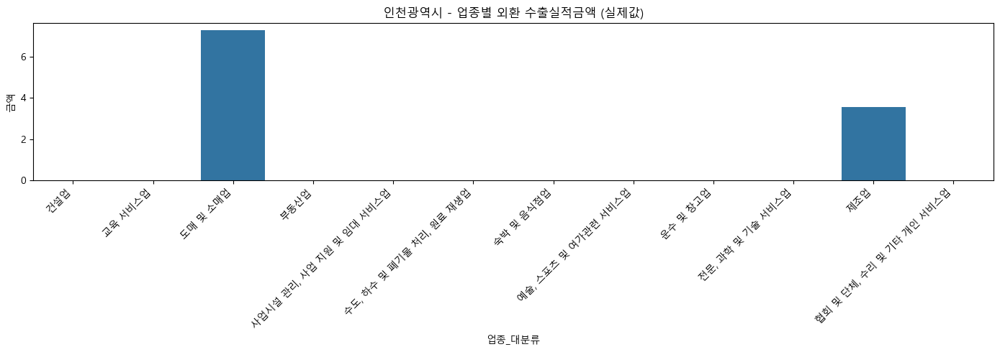

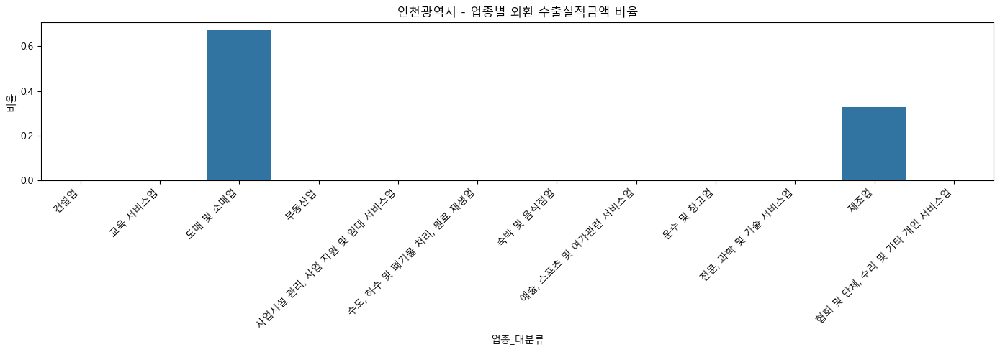

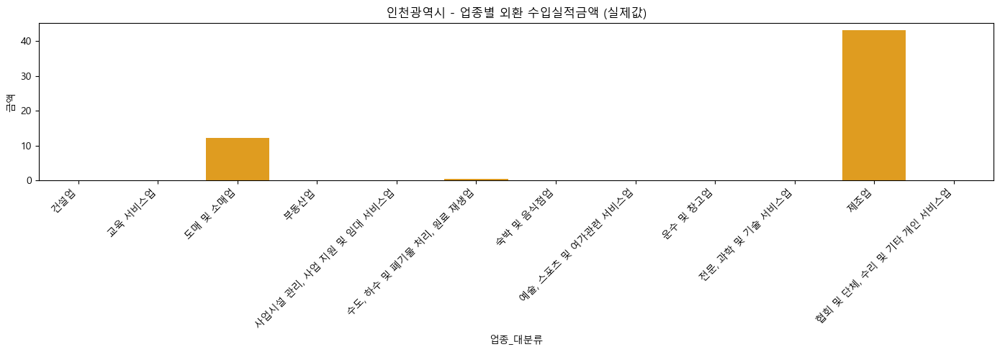

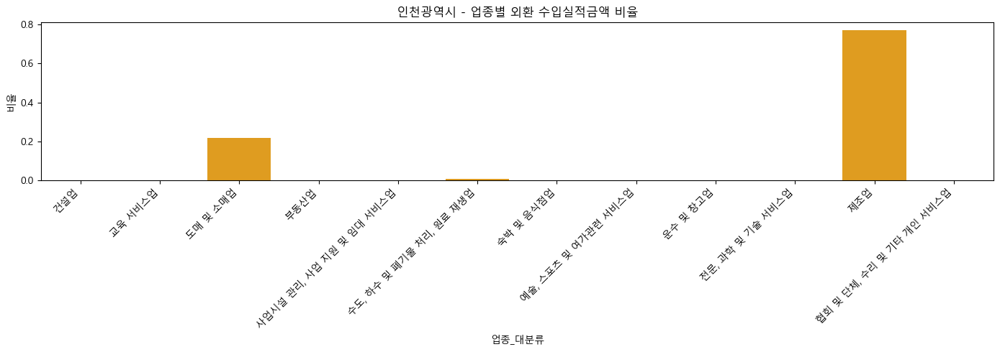

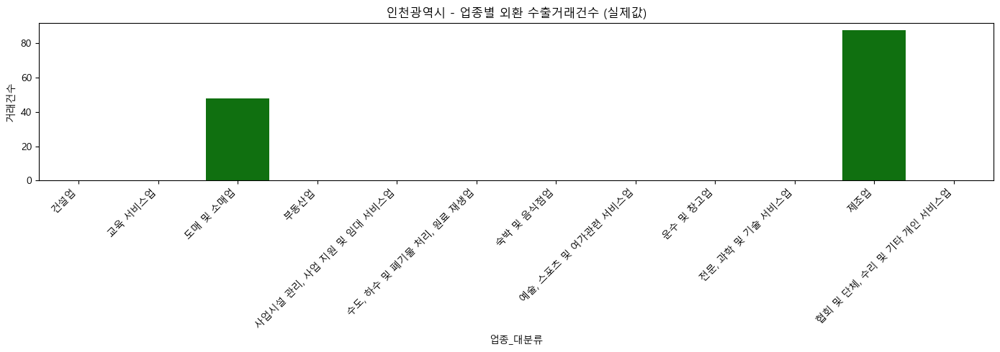

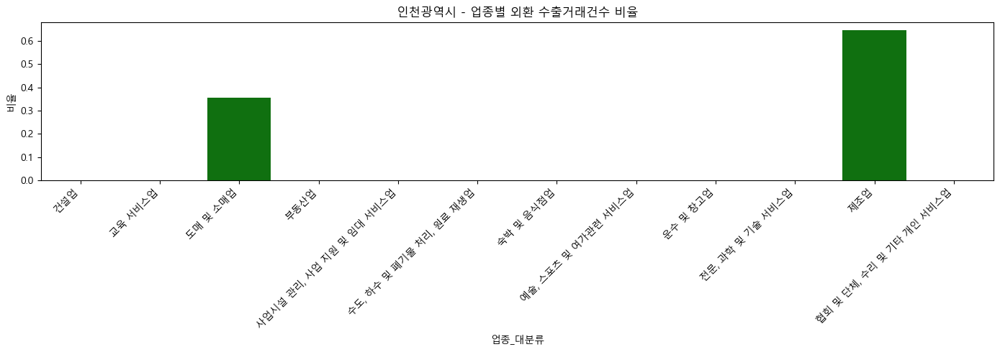

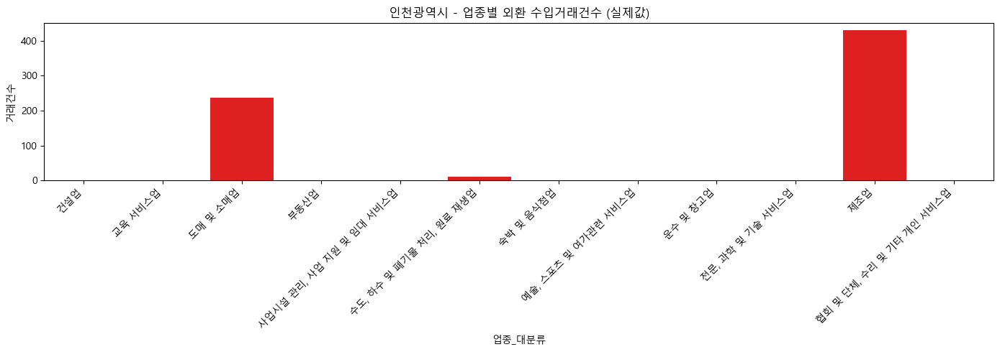

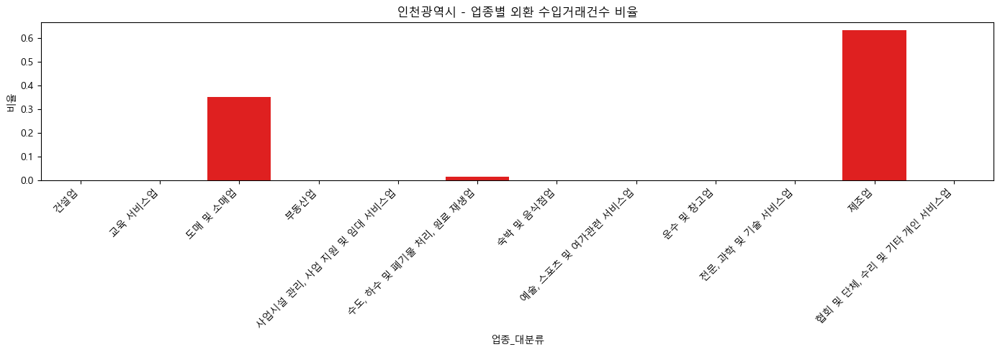



✅ 충청남도 - 업종별 외환 실적 (금액/건수 실제값 및 비율)


,업종_대분류,외환_수출실적금액,외환_수출실적금액_비율,외환_수입실적금액,외환_수입실적금액_비율,외환_수출실적거래건수,외환_수출실적거래건수_비율,외환_수입실적거래건수,외환_수입실적거래건수_비율
144,도매 및 소매업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
145,부동산업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
146,숙박 및 음식점업,0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
147,"전문, 과학 및 기술 서비스업",0.0,NaN,0.00,0.0,0.0,NaN,0.0,0.0
148,제조업,0.0,NaN,0.05,1.0,0.0,NaN,7.0,1.0


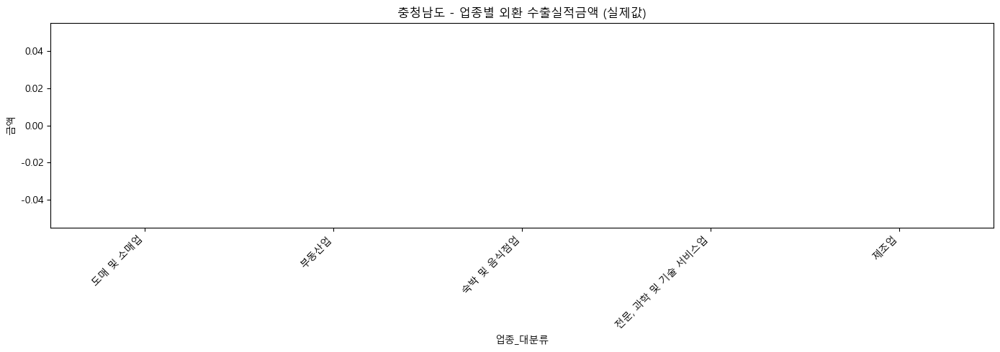

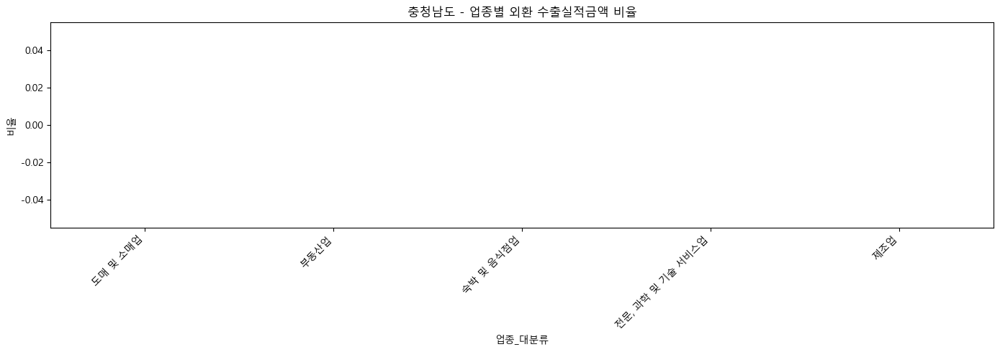

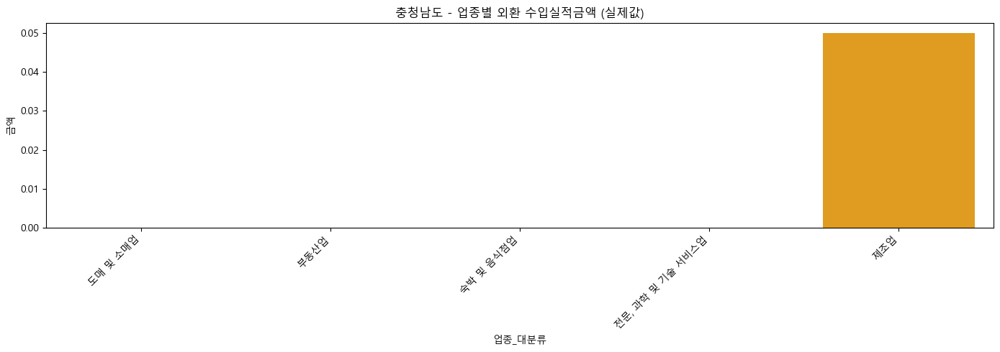

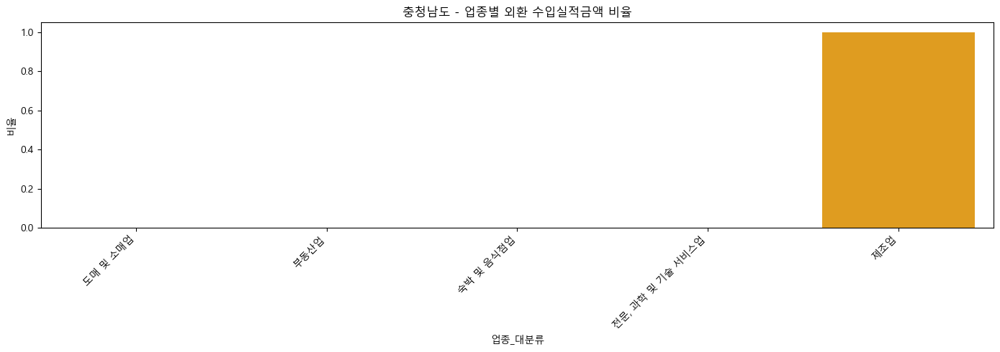

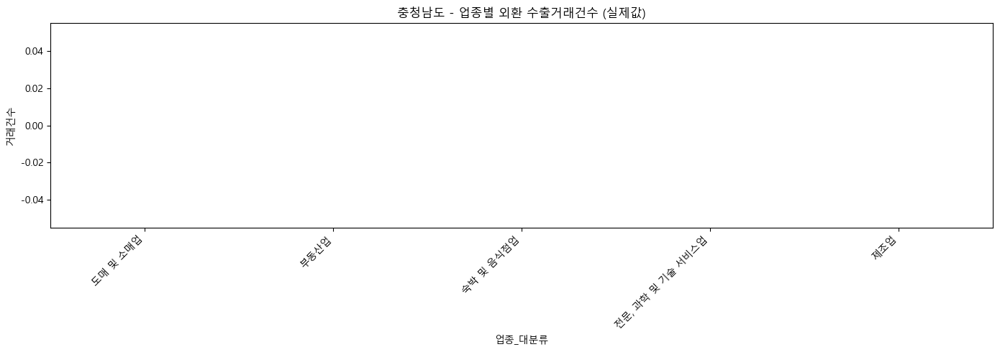

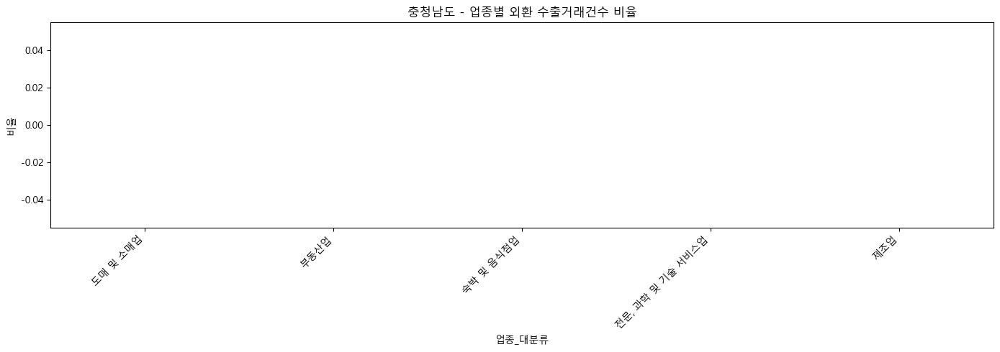

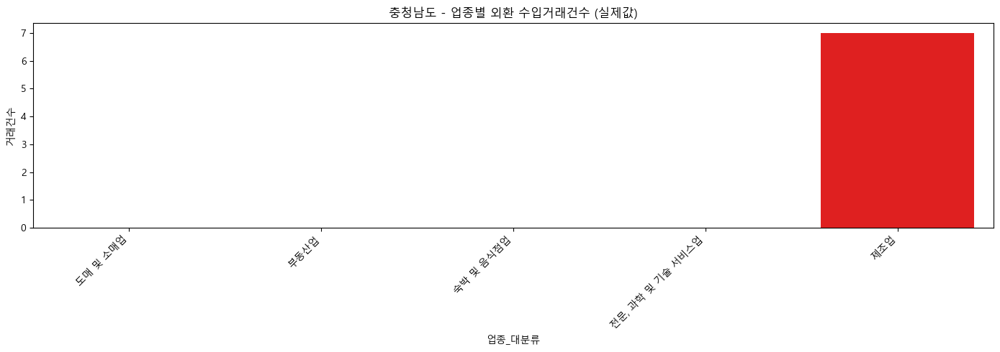

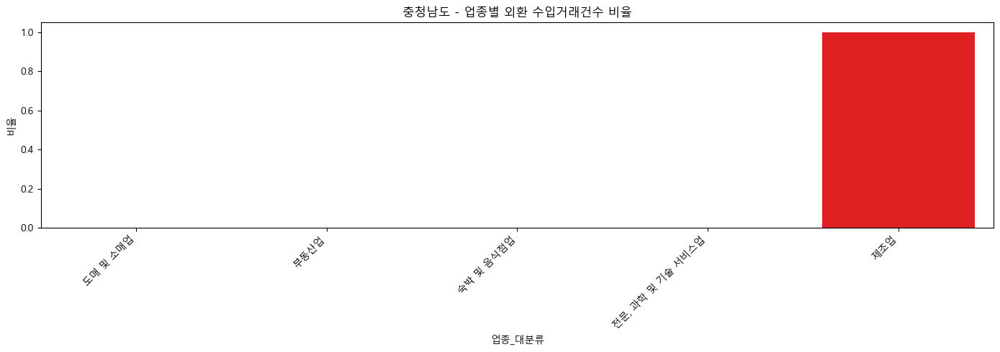

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# 1. 필요한 컬럼만 선택
cols = ['사업장_시도', '업종_대분류',
        '외환_수출실적금액', '외환_수입실적금액',
        '외환_수출실적거래건수', '외환_수입실적거래건수']
df_filtered = data[cols].copy()

# 2. 시도-업종별 집계
agg_df = df_filtered.groupby(['사업장_시도', '업종_대분류']).sum().reset_index()

# 3. 비율 계산
for col in ['외환_수출실적금액', '외환_수입실적금액',
            '외환_수출실적거래건수', '외환_수입실적거래건수']:
    agg_df[f'{col}_비율'] = agg_df.groupby('사업장_시도')[col].transform(lambda x: x / x.sum())

# 4. 시도 리스트 추출
sido_list = agg_df['사업장_시도'].unique()

# 5. 시도별로 display + 시각화
for sido in sido_list:
    tmp = agg_df[agg_df['사업장_시도'] == sido].copy()
    
    print(f"\n\n✅ {sido} - 업종별 외환 실적 (금액/건수 실제값 및 비율)")
    display(tmp[['업종_대분류',
                 '외환_수출실적금액', '외환_수출실적금액_비율',
                 '외환_수입실적금액', '외환_수입실적금액_비율',
                 '외환_수출실적거래건수', '외환_수출실적거래건수_비율',
                 '외환_수입실적거래건수', '외환_수입실적거래건수_비율']])

    # 수출금액 (실제값)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수출실적금액')
    plt.title(f'{sido} - 업종별 외환 수출실적금액 (실제값)')
    plt.ylabel('금액')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 수출금액 (비율)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수출실적금액_비율')
    plt.title(f'{sido} - 업종별 외환 수출실적금액 비율')
    plt.ylabel('비율')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 수입금액 (실제값)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수입실적금액', color='orange')
    plt.title(f'{sido} - 업종별 외환 수입실적금액 (실제값)')
    plt.ylabel('금액')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 수입금액 (비율)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수입실적금액_비율', color='orange')
    plt.title(f'{sido} - 업종별 외환 수입실적금액 비율')
    plt.ylabel('비율')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 수출건수 (실제값)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수출실적거래건수', color='green')
    plt.title(f'{sido} - 업종별 외환 수출거래건수 (실제값)')
    plt.ylabel('거래건수')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 수출건수 (비율)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수출실적거래건수_비율', color='green')
    plt.title(f'{sido} - 업종별 외환 수출거래건수 비율')
    plt.ylabel('비율')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 수입건수 (실제값)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수입실적거래건수', color='red')
    plt.title(f'{sido} - 업종별 외환 수입거래건수 (실제값)')
    plt.ylabel('거래건수')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 수입건수 (비율)
    plt.figure(figsize=(14, 5))
    sns.barplot(data=tmp, x='업종_대분류', y='외환_수입실적거래건수_비율', color='red')
    plt.title(f'{sido} - 업종별 외환 수입거래건수 비율')
    plt.ylabel('비율')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


## 외환 2

In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

df=data